<div>
    <center><span style="font-family: 'Open Sans', sans-serif; font-size: 30px;">
Прогнозирование оттока клиентов телеком-компании
    </span></center>
    <br>
</div>



## Предварительный анализ

<link rel="preconnect" href="https://fonts.googleapis.com">
<link rel="preconnect" href="https://fonts.gstatic.com" crossorigin>
<link href="https://fonts.googleapis.com/css2?family=Open+Sans:wght@300&display=swap" rel="stylesheet">
<div style="background-color: #cce5ff; padding: 20px; border: 1px solid #cccccc; border-radius: 10px; box-shadow: 2px 2px 5px #999999;">
    <img src="https://downloader.disk.yandex.ru/preview/e2ce92ca2cceab251cef17a7c9fd66ca0d4a4dee6b4b1791faac4c34bad2fc0e/64a2b386/_Ia4gmyxfuZDuYX1zfzd01c1jZQ8exbaYgx7YybFi7pq5N4wVhheG6ZYgYzwIpNuYuJekWkAN0IheQLstqUILw%3D%3D?uid=0&filename=icons8-bookmark-20.png&disposition=inline&hash=&limit=0&content_type=image%2Fpng&owner_uid=0&tknv=v2&size=2048x2048" style="float: left; margin-right: 8px; margin-top: 0px;">
    <span style="font-family: 'Open Sans', sans-serif; font-size: 20px;">
        <p><strong>Описание и цели:</strong></p>
    </span>
    <br>
    <span style="font-family: 'Open Sans', sans-serif; font-size: 14px;">
        <p>

<strong>Описание проекта:</strong><br>
Оператор "Ниединогоразрыва.ком" хочет предсказывать, когда пользователи планируют уходить, чтобы предложить им промокоды и специальные условия для удержания. В рамках проекта представлены данные клиентов, информация о тарифах и договорах.<br>

    
<strong>Цели проекта:</strong>   <br>         
1. Прогнозирование оттока клиентов: <br>
&emsp;&emsp;Целью проекта является разработка ML-модели , которая будет  прогнозировать отток клиентов оператора связи <br>
&emsp;&emsp;"Ниединогоразрыва.ком".<br>
2. Улучшение клиентского опыта <br>

<strong>Задачи проекта:</strong><br>
&emsp;1. Подготовка данных <br>
&emsp;2. Исследовательский анализ данных <br>
&emsp;3. Создание модели прогнозирования оттока <br>
&emsp;4. Оценка и выбор лучшей модели <br>
&emsp;5. Выводы по результатам + разработка стратегий удержания клиентов <br>
</p>
    </span>

</div>


In [1]:
#!pip install scikit-optimize
#!pip install feature_engine

In [2]:
# Import the required modules
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder
from sklearn.preprocessing import StandardScaler, MinMaxScaler, FunctionTransformer 
from sklearn.metrics import accuracy_score,confusion_matrix,roc_curve, roc_auc_score as roc_auc

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from lightgbm import LGBMClassifier
from sklearn.compose import ColumnTransformer, make_column_selector, make_column_transformer
from imblearn.pipeline import make_pipeline as make_imblearn_pipeline
from feature_engine.discretisation import EqualWidthDiscretiser

from skopt import BayesSearchCV

from scipy.stats import boxcox, yeojohnson

from sklearn.cluster import DBSCAN  

import phik
from phik.report import plot_correlation_matrix
from phik import report

import shap

In [3]:
class PreEda:
    """
    Класс используется для представления общей информации о данных

    ...

    Атрибуты
    ----------
    name_of_file : str or list of strings
        Имя файла с указанием расширения .csv, либо список таких имён
    path : str
        путь до файла

    Методы
    -------
    create_dataframes()
        Создает датафрейм. При отсутствии файла по указанному пути файл будет загружен с s3 хранилища. Ве
    modify_names_of_column()
        Преобразовывает названия колонок к snake_case 
    explore_dataframe()
        Выводит основную информацию о датафрейме(ах)
        
        
    
    """
    def __init__(self, name_of_file, path):
        """
        Параметры
        ----------
        name_of_file : str
            название файла, либо список названий c расширением .csv
        path : str
            путь до файла
        
        Исключения
        ------
        TypeError
            Если тип имени файла не str/list, то выведет ошибку о не соответсвии
            типа введенных данных с ожидаемыми типами.
        """
        
        if not isinstance(name_of_file, (list, str)) :
            raise TypeError("Данные должны иметь тип list или str")
        
        self.name_of_file = name_of_file
        self.path = path
        #print(self._name_of_file)
    
    def __call__(self, complete_all_steps):
        """
        Parameters
        ----------
        complete_all_steps : int
            При вводе 1 выполнит следующие методы: 
                1. create_dataframes 
                2. modify_names_of_column 
                3. explore_dataframe
            При вводе 2 выполнит следующие методы: 
                1. create_dataframes 
                2. modify_names_of_column 
        """
        
        if complete_all_steps == 1:
            self.create_dataframes()
            self.modify_names_of_column()
            self.explore_dataframe()
            
        if complete_all_steps == 2:
            self.create_dataframes()
            self.modify_names_of_column()
    def create_dataframes(self):
        
        """
        Возвращает список датафреймов.
        
        Исключения
        ------
        FileNotFoundError
            Если по указанному пути нет указанного файла, то этот файл будет 
            выгружен с s3 хранилища. При отсутствии этого файла и в s3 будет 
            выдана ошибка FileNotFoundError.
        """
        def try_read(path, name_of_file):
            try:
                return pd.read_csv(path + name_of_file)
            except FileNotFoundError:
                return pd.read_csv('https://code.s3.yandex.net/datasets/' + name_of_file)
   
        if isinstance(self.name_of_file, str):
            self.name_of_file = [self.name_of_file]
        
        
        self.dataframes = [try_read(self.path, name) for name in self.name_of_file]
        return  self.dataframes
        
    def modify_names_of_column(self):
        """
        Возвращает список датафреймов c названиями колонок приведенными к snake_case.
       
        """
        
        modified_dataframe = []
        modified_column_names = []
        for j, dataframe_ in  enumerate(self.dataframes):
            for column_name in dataframe_:
                modified_string = ''
                for i, char in enumerate(column_name):
                    if char.isupper() and i != 0 and not column_name[i-1].isupper():
                        modified_string += "_"
                    modified_string += char.lower()
                modified_column_names.append(modified_string)
            self.dataframes[j].columns = modified_column_names
            modified_column_names = []
        return self.dataframes
    
    def explore_dataframe(self): 
        """
        Выводит общую информацию о датафреймах.
       
        """
        for i in range(len(self.dataframes)):
        

            print(f"{'*' * 50}\nПервые 5 строк датафрейма {self.name_of_file[i][:-4]}:\n{'*' * 50}\n")
            display(self.dataframes[i].head())
            print()

            # выводим информацию о типах данных и количестве пропущенных значений
            print(f"{'*' * 40}\nИнформация о данных в {self.name_of_file[i][:-4]}:\n{'*' * 40}\n")
            self.dataframes[i].info()
            print(*['\n','Кол-во уникальных значений\n', self.dataframes[i].nunique()])
            print(*['\n','Кол-во полных дубликатов:', self.dataframes[i].duplicated().sum()])
            print(*['\n', 'Кол-во Nan:\n', self.dataframes[i].isna().sum()])
            print()

            # выводим описание статистических характеристик числовых столбцов
            print(f"{'*' * 65}\nСтатистические характеристики числовых столбцов в {self.name_of_file[i][:-4]}:\n{'*' * 65}\n")
            display(self.dataframes[i].describe())
            
            print('\n\n')
            print('='*120)
            print('='*120)
            print('\n\n')
            
        

In [4]:
preeda_object = PreEda(['contract_new.csv', 'internet_new.csv', 'personal_new.csv', 'phone_new.csv'], './')
preeda_object(complete_all_steps=1)

**************************************************
Первые 5 строк датафрейма contract_new:
**************************************************



,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges
0,7590-VHVEG,2020-01-01,No,Month-to-month,Yes,Electronic check,29.85,31.04
1,5575-GNVDE,2017-04-01,No,One year,No,Mailed check,56.95,2071.84
2,3668-QPYBK,2019-10-01,No,Month-to-month,Yes,Mailed check,53.85,226.17
3,7795-CFOCW,2016-05-01,No,One year,No,Bank transfer (automatic),42.30,1960.6
4,9237-HQITU,2019-09-01,No,Month-to-month,Yes,Electronic check,70.70,353.5



****************************************
Информация о данных в contract_new:
****************************************

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   customer_id        7043 non-null   object 
 1   begin_date         7043 non-null   object 
 2   end_date           7043 non-null   object 
 3   type               7043 non-null   object 
 4   paperless_billing  7043 non-null   object 
 5   payment_method     7043 non-null   object 
 6   monthly_charges    7043 non-null   float64
 7   total_charges      7043 non-null   object 
dtypes: float64(1), object(7)
memory usage: 440.3+ KB

 Кол-во уникальных значений
 customer_id          7043
begin_date             77
end_date               67
type                    3
paperless_billing       2
payment_method          4
monthly_charges      1585
total_charges        6658
dt

,monthly_charges
count,7043.000000
mean,64.761692
std,30.090047
min,18.250000
25%,35.500000
50%,70.350000
75%,89.850000
max,118.750000








**************************************************
Первые 5 строк датафрейма internet_new:
**************************************************



,customer_id,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies
0,7590-VHVEG,DSL,No,Yes,No,No,No,No
1,5575-GNVDE,DSL,Yes,No,Yes,No,No,No
2,3668-QPYBK,DSL,Yes,Yes,No,No,No,No
3,7795-CFOCW,DSL,Yes,No,Yes,Yes,No,No
4,9237-HQITU,Fiber optic,No,No,No,No,No,No



****************************************
Информация о данных в internet_new:
****************************************

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5517 entries, 0 to 5516
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   customer_id        5517 non-null   object
 1   internet_service   5517 non-null   object
 2   online_security    5517 non-null   object
 3   online_backup      5517 non-null   object
 4   device_protection  5517 non-null   object
 5   tech_support       5517 non-null   object
 6   streaming_tv       5517 non-null   object
 7   streaming_movies   5517 non-null   object
dtypes: object(8)
memory usage: 344.9+ KB

 Кол-во уникальных значений
 customer_id          5517
internet_service        2
online_security         2
online_backup           2
device_protection       2
tech_support            2
streaming_tv            2
streaming_movies        2
dtype: int64

 Кол-во по

,customer_id,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies
count,5517,5517,5517,5517,5517,5517,5517,5517
unique,5517,2,2,2,2,2,2,2
top,7590-VHVEG,Fiber optic,No,No,No,No,No,No
freq,1,3096,3498,3088,3095,3473,2810,2785








**************************************************
Первые 5 строк датафрейма personal_new:
**************************************************



,customer_id,gender,senior_citizen,partner,dependents
0,7590-VHVEG,Female,0,Yes,No
1,5575-GNVDE,Male,0,No,No
2,3668-QPYBK,Male,0,No,No
3,7795-CFOCW,Male,0,No,No
4,9237-HQITU,Female,0,No,No



****************************************
Информация о данных в personal_new:
****************************************

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   customer_id     7043 non-null   object
 1   gender          7043 non-null   object
 2   senior_citizen  7043 non-null   int64 
 3   partner         7043 non-null   object
 4   dependents      7043 non-null   object
dtypes: int64(1), object(4)
memory usage: 275.2+ KB

 Кол-во уникальных значений
 customer_id       7043
gender               2
senior_citizen       2
partner              2
dependents           2
dtype: int64

 Кол-во полных дубликатов: 0

 Кол-во Nan:
 customer_id       0
gender            0
senior_citizen    0
partner           0
dependents        0
dtype: int64

*****************************************************************
Статистические характеристики ч

,senior_citizen
count,7043.000000
mean,0.162147
std,0.368612
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,1.000000








**************************************************
Первые 5 строк датафрейма phone_new:
**************************************************



,customer_id,multiple_lines
0,5575-GNVDE,No
1,3668-QPYBK,No
2,9237-HQITU,No
3,9305-CDSKC,Yes
4,1452-KIOVK,Yes



****************************************
Информация о данных в phone_new:
****************************************

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6361 entries, 0 to 6360
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   customer_id     6361 non-null   object
 1   multiple_lines  6361 non-null   object
dtypes: object(2)
memory usage: 99.5+ KB

 Кол-во уникальных значений
 customer_id       6361
multiple_lines       2
dtype: int64

 Кол-во полных дубликатов: 0

 Кол-во Nan:
 customer_id       0
multiple_lines    0
dtype: int64

*****************************************************************
Статистические характеристики числовых столбцов в phone_new:
*****************************************************************



,customer_id,multiple_lines
count,6361,6361
unique,6361,2
top,5575-GNVDE,No
freq,1,3390


<link rel="preconnect" href="https://fonts.googleapis.com">
<link rel="preconnect" href="https://fonts.gstatic.com" crossorigin>
<link href="https://fonts.googleapis.com/css2?family=Open+Sans:wght@300&display=swap" rel="stylesheet">
<div style="background-color: #cce5ff; padding: 20px; border: 1px solid #cccccc; border-radius: 10px; box-shadow: 2px 2px 5px #999999;">
    <img src="https://downloader.disk.yandex.ru/preview/36b5b4bebefdd00bee94157f7918370abe32f6a5bd924089298df5b2aea3290f/64a2efc5/tRQlLxklfPyglkrgbEWnNUYRPeY6G5k9H6S5w9ieKaaANuYK_vzorCU4v3sDtgBKkOAthpD744DqiH9lgvXuzw%3D%3D?uid=0&filename=icons8-about-20.png&disposition=inline&hash=&limit=0&content_type=image%2Fpng&owner_uid=0&tknv=v2&size=2048x2048" style="float: left; margin-right: 8px; margin-top: 18px;">
    <span style="font-family: 'Open Sans', sans-serif; font-size: 17px;">
        <h3>Промежуточные выводы:</h3>
    </span>
    <br>
    <span style="font-family: 'Open Sans', sans-serif; font-size: 14px;">
        <p>
             <strong>1. contract_new</strong><br>
    <li>Столбцы begin_date и end_date имеют тип object. После слияния данных нужно изменить их тип на datetime.</li>
    <li>Количество уникальных id совпадает с количеством строк в таблице (7043).</li>
    <li>Количество полных дубликатов: 0</li>
    <li>Количество значений NaN: 0, но есть значения 'No' в столбце end_date - пользователь продолжает пользоваться услугами.</li>
    <li>Столбец total_charges имеет тип object. Нужно изменить его тип на float.</li>
        </p>
        <p>
             <strong>2. internet_new</strong>
               <li> Количество уникальных id совпадает с количеством строк в таблице (5517).</li>
   <li> В каждом столбце, кроме столбца id, присутствуют только 2 уникальных значения. За исключением столбца internet_service, все остальные признаки указывают, подключена ли услуга yes/no. Столбец internet_service содержит два разных типа подключения к интернету.</li>
   <li> Есть смысл преобразовать логические признаки yes и no в тип числовой тип.</li>
   <li> Количество полных дубликатов: 0</li>
   <li> Количество значений NaN: 0</li>
        </p>
        <p>
            <strong>3. personal_new</strong>
               <li> Количество уникальных id совпадает с количеством строк в таблице (7043).</li>
   <li> В таблице также присутствуют признаки с 2 уникальными значениями, такие как senior_citizen, partner и dependents. Лучше преобразовать их в числовой тип.</li>
   <li> Количество полных дубликатов: 0</li>
   <li> Количество значений NaN: 0</li>
        </p>
        <p>
             <strong>4. phone_new</strong>
               <li> Количество уникальных id совпадает с количеством строк в таблице (6361).</li>
   <li> Количество полных дубликатов: 0</li>
   <li> Количество значений NaN: 0</li>
   <li> Столбец multiple_lines лучше преобразовать в их в числовой тип.</li>
        </p>
    </span>
</div>


In [5]:
contract_new_df, internet_new_df, personal_new_df, phone_new_df = preeda_object.modify_names_of_column()

In [6]:
#замена типов в contract_new_df
contract_new_df['paperless_billing'] = contract_new_df['paperless_billing'] \
    .apply(lambda x: 1 if x == 'Yes' else 0) \
    .astype('uint8')

contract_new_df['total_charges'] = pd.to_numeric(contract_new_df['total_charges'], errors='coerce').fillna(0.)
contract_new_df['begin_date'] = pd.to_datetime(contract_new_df['begin_date'])
contract_new_df['end_date'] = pd.to_datetime(contract_new_df['end_date'], errors='coerce')
contract_new_df

,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges
0,7590-VHVEG,2020-01-01,NaT,Month-to-month,1,Electronic check,29.85,31.04
1,5575-GNVDE,2017-04-01,NaT,One year,0,Mailed check,56.95,2071.84
2,3668-QPYBK,2019-10-01,NaT,Month-to-month,1,Mailed check,53.85,226.17
3,7795-CFOCW,2016-05-01,NaT,One year,0,Bank transfer (automatic),42.30,1960.60
4,9237-HQITU,2019-09-01,NaT,Month-to-month,1,Electronic check,70.70,353.50
...,...,...,...,...,...,...,...,...
7038,6840-RESVB,2018-02-01,NaT,One year,1,Mailed check,84.80,2035.20
7039,2234-XADUH,2014-02-01,NaT,One year,1,Credit card (automatic),103.20,7430.40
7040,4801-JZAZL,2019-03-01,NaT,Month-to-month,1,Electronic check,29.60,325.60
7041,8361-LTMKD,2019-07-01,NaT,Month-to-month,1,Mailed check,74.40,520.80


In [7]:
#замена типов в internet_new_df
columns_to_convert = ['online_security', 
                      'online_backup', 
                      'device_protection', 
                      'tech_support', 
                      'streaming_tv', 
                      'streaming_movies']

internet_new_df[columns_to_convert] = internet_new_df[columns_to_convert] \
    .apply(lambda x: x.map({'Yes': 1, 'No': 0})) \
    .astype('uint8')
internet_new_df

,customer_id,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies
0,7590-VHVEG,DSL,0,1,0,0,0,0
1,5575-GNVDE,DSL,1,0,1,0,0,0
2,3668-QPYBK,DSL,1,1,0,0,0,0
3,7795-CFOCW,DSL,1,0,1,1,0,0
4,9237-HQITU,Fiber optic,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...
5512,6840-RESVB,DSL,1,0,1,1,1,1
5513,2234-XADUH,Fiber optic,0,1,1,0,1,1
5514,4801-JZAZL,DSL,1,0,0,0,0,0
5515,8361-LTMKD,Fiber optic,0,0,0,0,0,0


In [8]:
#замена типов в personal_new_df
columns_to_convert = ['partner', 
                      'dependents']

personal_new_df[columns_to_convert] = personal_new_df[columns_to_convert] \
    .apply(lambda x: x.map({'Yes': 1, 'No': 0})) \
    .astype('uint8')
personal_new_df

,customer_id,gender,senior_citizen,partner,dependents
0,7590-VHVEG,Female,0,1,0
1,5575-GNVDE,Male,0,0,0
2,3668-QPYBK,Male,0,0,0
3,7795-CFOCW,Male,0,0,0
4,9237-HQITU,Female,0,0,0
...,...,...,...,...,...
7038,6840-RESVB,Male,0,1,1
7039,2234-XADUH,Female,0,1,1
7040,4801-JZAZL,Female,0,1,1
7041,8361-LTMKD,Male,1,1,0


In [9]:
#замена типов в phone_new_df
phone_new_df['multiple_lines'] = phone_new_df['multiple_lines'] \
    .apply(lambda x: 1 if x == 'Yes' else 0) \
    .astype('uint8')
phone_new_df

,customer_id,multiple_lines
0,5575-GNVDE,0
1,3668-QPYBK,0
2,9237-HQITU,0
3,9305-CDSKC,1
4,1452-KIOVK,1
...,...,...
6356,2569-WGERO,0
6357,6840-RESVB,1
6358,2234-XADUH,1
6359,8361-LTMKD,1


In [10]:
#выводим информацию о датафрейме после изменений 
preeda_object.explore_dataframe()

**************************************************
Первые 5 строк датафрейма contract_new:
**************************************************



,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges
0,7590-VHVEG,2020-01-01,NaT,Month-to-month,1,Electronic check,29.85,31.04
1,5575-GNVDE,2017-04-01,NaT,One year,0,Mailed check,56.95,2071.84
2,3668-QPYBK,2019-10-01,NaT,Month-to-month,1,Mailed check,53.85,226.17
3,7795-CFOCW,2016-05-01,NaT,One year,0,Bank transfer (automatic),42.30,1960.60
4,9237-HQITU,2019-09-01,NaT,Month-to-month,1,Electronic check,70.70,353.50



****************************************
Информация о данных в contract_new:
****************************************

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   customer_id        7043 non-null   object        
 1   begin_date         7043 non-null   datetime64[ns]
 2   end_date           1101 non-null   datetime64[ns]
 3   type               7043 non-null   object        
 4   paperless_billing  7043 non-null   uint8         
 5   payment_method     7043 non-null   object        
 6   monthly_charges    7043 non-null   float64       
 7   total_charges      7043 non-null   float64       
dtypes: datetime64[ns](2), float64(2), object(3), uint8(1)
memory usage: 392.2+ KB

 Кол-во уникальных значений
 customer_id          7043
begin_date             77
end_date               66
type                    3
paperle

,paperless_billing,monthly_charges,total_charges
count,7043.000000,7043.000000,7043.000000
mean,0.592219,64.761692,2115.312885
std,0.491457,30.090047,2112.742814
min,0.000000,18.250000,0.000000
25%,0.000000,35.500000,436.750000
50%,1.000000,70.350000,1343.350000
75%,1.000000,89.850000,3236.690000
max,1.000000,118.750000,9221.380000








**************************************************
Первые 5 строк датафрейма internet_new:
**************************************************



,customer_id,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies
0,7590-VHVEG,DSL,0,1,0,0,0,0
1,5575-GNVDE,DSL,1,0,1,0,0,0
2,3668-QPYBK,DSL,1,1,0,0,0,0
3,7795-CFOCW,DSL,1,0,1,1,0,0
4,9237-HQITU,Fiber optic,0,0,0,0,0,0



****************************************
Информация о данных в internet_new:
****************************************

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5517 entries, 0 to 5516
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   customer_id        5517 non-null   object
 1   internet_service   5517 non-null   object
 2   online_security    5517 non-null   uint8 
 3   online_backup      5517 non-null   uint8 
 4   device_protection  5517 non-null   uint8 
 5   tech_support       5517 non-null   uint8 
 6   streaming_tv       5517 non-null   uint8 
 7   streaming_movies   5517 non-null   uint8 
dtypes: object(2), uint8(6)
memory usage: 118.7+ KB

 Кол-во уникальных значений
 customer_id          5517
internet_service        2
online_security         2
online_backup           2
device_protection       2
tech_support            2
streaming_tv            2
streaming_movies        2
dtype: int64



,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies
count,5517.000000,5517.000000,5517.000000,5517.000000,5517.000000,5517.000000
mean,0.365960,0.440276,0.439007,0.370491,0.490665,0.495197
std,0.481742,0.496465,0.496311,0.482980,0.499958,0.500022
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000








**************************************************
Первые 5 строк датафрейма personal_new:
**************************************************



,customer_id,gender,senior_citizen,partner,dependents
0,7590-VHVEG,Female,0,1,0
1,5575-GNVDE,Male,0,0,0
2,3668-QPYBK,Male,0,0,0
3,7795-CFOCW,Male,0,0,0
4,9237-HQITU,Female,0,0,0



****************************************
Информация о данных в personal_new:
****************************************

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   customer_id     7043 non-null   object
 1   gender          7043 non-null   object
 2   senior_citizen  7043 non-null   int64 
 3   partner         7043 non-null   uint8 
 4   dependents      7043 non-null   uint8 
dtypes: int64(1), object(2), uint8(2)
memory usage: 179.0+ KB

 Кол-во уникальных значений
 customer_id       7043
gender               2
senior_citizen       2
partner              2
dependents           2
dtype: int64

 Кол-во полных дубликатов: 0

 Кол-во Nan:
 customer_id       0
gender            0
senior_citizen    0
partner           0
dependents        0
dtype: int64

*****************************************************************
Статистические характ

,senior_citizen,partner,dependents
count,7043.000000,7043.000000,7043.000000
mean,0.162147,0.483033,0.299588
std,0.368612,0.499748,0.458110
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000
75%,0.000000,1.000000,1.000000
max,1.000000,1.000000,1.000000








**************************************************
Первые 5 строк датафрейма phone_new:
**************************************************



,customer_id,multiple_lines
0,5575-GNVDE,0
1,3668-QPYBK,0
2,9237-HQITU,0
3,9305-CDSKC,1
4,1452-KIOVK,1



****************************************
Информация о данных в phone_new:
****************************************

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6361 entries, 0 to 6360
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   customer_id     6361 non-null   object
 1   multiple_lines  6361 non-null   uint8 
dtypes: object(1), uint8(1)
memory usage: 56.0+ KB

 Кол-во уникальных значений
 customer_id       6361
multiple_lines       2
dtype: int64

 Кол-во полных дубликатов: 0

 Кол-во Nan:
 customer_id       0
multiple_lines    0
dtype: int64

*****************************************************************
Статистические характеристики числовых столбцов в phone_new:
*****************************************************************



,multiple_lines
count,6361.000000
mean,0.467065
std,0.498953
min,0.000000
25%,0.000000
50%,0.000000
75%,1.000000
max,1.000000


<link rel="preconnect" href="https://fonts.googleapis.com">
<link rel="preconnect" href="https://fonts.gstatic.com" crossorigin>
<link href="https://fonts.googleapis.com/css2?family=Open+Sans:wght@300&display=swap" rel="stylesheet">
<div style="background-color: #cce5ff; padding: 20px; border: 1px solid #cccccc; border-radius: 10px; box-shadow: 2px 2px 5px #999999;">
    <img src="https://downloader.disk.yandex.ru/preview/36b5b4bebefdd00bee94157f7918370abe32f6a5bd924089298df5b2aea3290f/64a2efc5/tRQlLxklfPyglkrgbEWnNUYRPeY6G5k9H6S5w9ieKaaANuYK_vzorCU4v3sDtgBKkOAthpD744DqiH9lgvXuzw%3D%3D?uid=0&filename=icons8-about-20.png&disposition=inline&hash=&limit=0&content_type=image%2Fpng&owner_uid=0&tknv=v2&size=2048x2048" style="float: left; margin-right: 8px; margin-top: 18px;">
    <span style="font-family: 'Open Sans', sans-serif; font-size: 17px;">
        <h3>Промежуточные выводы:</h3>
    </span>
    <br>
    <span style="font-family: 'Open Sans', sans-serif; font-size: 14px;">
        <p>
             <strong>1. contract_new</strong><br>
            <li>begin_date, end_date - приведены к datetime, No в end_date заменены на NaT  </li>
            <li> paperless_billing - приведен к uint8 </li>
            <li> total_charges - привден к float, пропущенные значения заменены на 0.0</li>
            <li>monthly_charges - явных аномалий не имеет. у total_charges есть сильные отклонения от бокса </li>
        </p>
        <p>
             <strong>2. internet_new</strong>
            <li>В online_security, online_backup, device_protection, tech_support, streaming_tv, streaming_movies - yes/no приведены к 1 и 0</li>
            <li> приведенные признаки не имеют сильного дисбаланса (небольшой дисбаланс у online_security и tech_support )</li>
        </p>
        <p>
            <strong>3. personal_new</strong>
            <li>Признаки partner, dependents приведены к 1 и 0  </li>
            <li>senior_citizen, dependents - имеют дисбаланс </li>
        </p>
        <p>
             <strong>4. phone_new</strong>
            <li>Признак multiple_lines   приведен к 1 и 0 </li>
        </p>
    </span>
</div>


## EDA

### Объединение датафреймов

In [11]:
df = contract_new_df.merge(personal_new_df, on='customer_id',how='left') \
        .merge(internet_new_df, on='customer_id',how='left') \
        .merge(phone_new_df, on='customer_id',how='left')

df, df_test1 = train_test_split(df, test_size=0.25, random_state=300623)

In [12]:
df.shape, df_test1.shape

((5282, 20), (1761, 20))

In [13]:
df.head()

,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines
6212,6537-OTKMY,2018-11-01,NaT,One year,0,Electronic check,50.75,776.48,Male,0,0,0,DSL,0.0,0.0,1.0,0.0,1.0,1.0,NaN
5401,5124-EOGYE,2017-07-01,NaT,Two year,0,Mailed check,20.45,633.95,Male,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
313,2799-ARNLO,2019-09-01,NaT,Month-to-month,1,Electronic check,69.35,346.75,Female,1,1,0,Fiber optic,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2638,6769-DCQLI,2015-09-01,NaT,One year,1,Bank transfer (automatic),105.00,5565.00,Male,0,0,0,Fiber optic,0.0,1.0,1.0,1.0,1.0,1.0,0.0
1870,3566-HJGPK,2020-01-01,NaT,Month-to-month,1,Mailed check,45.55,45.55,Male,0,0,0,DSL,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5282 entries, 6212 to 2006
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   customer_id        5282 non-null   object        
 1   begin_date         5282 non-null   datetime64[ns]
 2   end_date           818 non-null    datetime64[ns]
 3   type               5282 non-null   object        
 4   paperless_billing  5282 non-null   uint8         
 5   payment_method     5282 non-null   object        
 6   monthly_charges    5282 non-null   float64       
 7   total_charges      5282 non-null   float64       
 8   gender             5282 non-null   object        
 9   senior_citizen     5282 non-null   int64         
 10  partner            5282 non-null   uint8         
 11  dependents         5282 non-null   uint8         
 12  internet_service   4143 non-null   object        
 13  online_security    4143 non-null   float64       
 14  onlin

In [15]:
df.describe()

,paperless_billing,monthly_charges,total_charges,senior_citizen,partner,dependents,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines
count,5282.000000,5282.000000,5282.000000,5282.000000,5282.000000,5282.000000,4143.000000,4143.000000,4143.000000,4143.000000,4143.000000,4143.000000,4760.000000
mean,0.593904,64.635536,2097.560767,0.164900,0.478607,0.296668,0.365918,0.437123,0.431571,0.366643,0.489742,0.490949,0.461975
std,0.491149,30.025866,2097.977862,0.371125,0.499589,0.456832,0.481745,0.496091,0.495355,0.481946,0.499955,0.499978,0.498604
min,0.000000,18.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,35.562500,437.350000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,70.250000,1330.150000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,89.800000,3215.712500,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,1.000000,118.750000,9221.380000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [16]:
df.duplicated().sum()

0

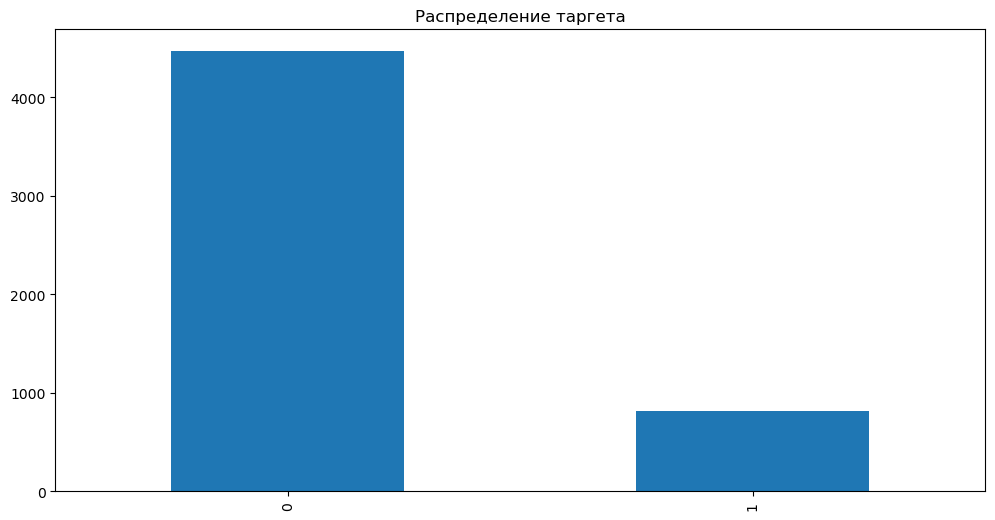

In [17]:
df['is_stopped'] = np.where(df['end_date'].isna(), 0,1 )
plt.figure(figsize=(12,6))
df['is_stopped'].value_counts().plot(kind='bar')
plt.title("Распределение таргета")
plt.show()

In [18]:
df['is_stopped'].value_counts()

0    4464
1     818
Name: is_stopped, dtype: int64

<link rel="preconnect" href="https://fonts.googleapis.com">
<link rel="preconnect" href="https://fonts.gstatic.com" crossorigin>
<link href="https://fonts.googleapis.com/css2?family=Open+Sans:wght@300&display=swap" rel="stylesheet">
<div style="background-color: #cce5ff; padding: 20px; border: 1px solid #cccccc; border-radius: 10px; box-shadow: 2px 2px 5px #999999;">
    <img src="https://downloader.disk.yandex.ru/preview/36b5b4bebefdd00bee94157f7918370abe32f6a5bd924089298df5b2aea3290f/64a2efc5/tRQlLxklfPyglkrgbEWnNUYRPeY6G5k9H6S5w9ieKaaANuYK_vzorCU4v3sDtgBKkOAthpD744DqiH9lgvXuzw%3D%3D?uid=0&filename=icons8-about-20.png&disposition=inline&hash=&limit=0&content_type=image%2Fpng&owner_uid=0&tknv=v2&size=2048x2048" style="float: left; margin-right: 8px; margin-top: 0;">
    <span style="font-family: 'Open Sans', sans-serif; font-size: 17px;">
        <strong>Заметка</strong>
    </span>
    <br>
    <span style="font-family: 'Open Sans', sans-serif; font-size: 14px;">
        <p>
            В таргете есть дисбаланс, что для такого типа данных является нормой. 15% - завершили пользоваться услугами.  
        </p>
    </span>
</div>


In [19]:
num_features = ['monthly_charges', 'total_charges']
target = ['is_stopped']

In [20]:
categorical_features = df.drop(num_features + target + ['customer_id','begin_date','end_date'], axis=1).columns.to_list()
categorical_features

['type',
 'paperless_billing',
 'payment_method',
 'gender',
 'senior_citizen',
 'partner',
 'dependents',
 'internet_service',
 'online_security',
 'online_backup',
 'device_protection',
 'tech_support',
 'streaming_tv',
 'streaming_movies',
 'multiple_lines']

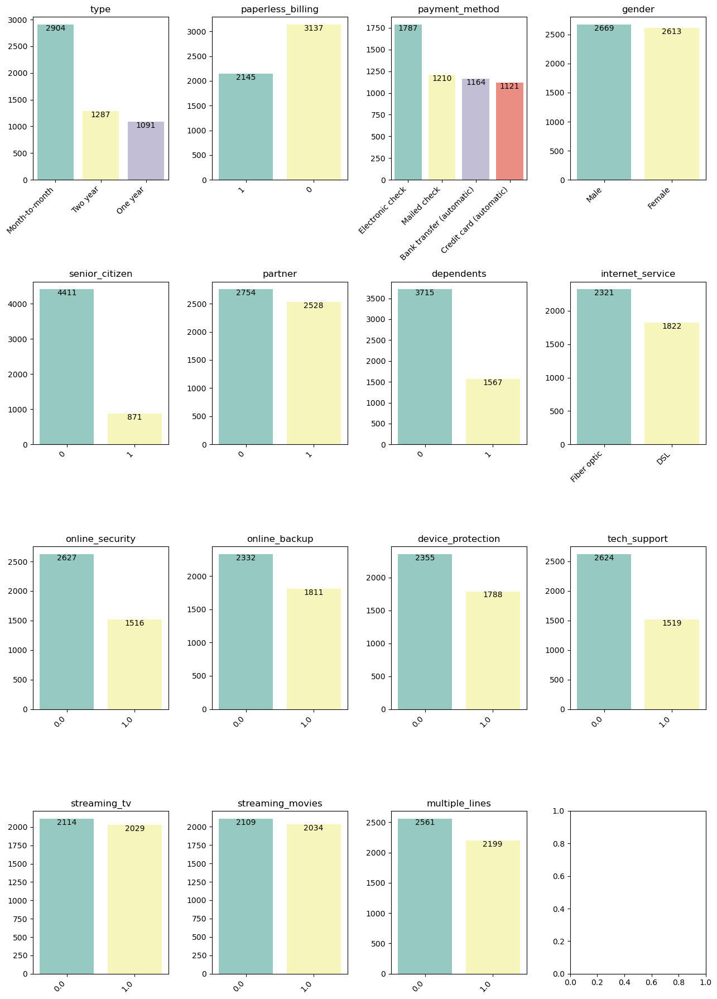

In [21]:
fig, axs = plt.subplots(ncols=4, nrows=4, figsize=(13, 18))

for (ax, feature) in zip(axs.flat, categorical_features):
    sns.barplot(x=df[feature].value_counts().index, y=df[feature].value_counts().values, ax=ax, palette='Set3')
    ax.set_title(feature)
    ax.set_xticklabels(df[feature].value_counts().index.to_list(), rotation=45, ha='right')
    for p in ax.patches:
        ax.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., 
                                                    p.get_height()), 
                    ha='center', va='bottom', 
                    xytext=(0, -10), 
                    textcoords='offset points')


plt.tight_layout()
plt.show()


<link rel="preconnect" href="https://fonts.googleapis.com">
<link rel="preconnect" href="https://fonts.gstatic.com" crossorigin>
<link href="https://fonts.googleapis.com/css2?family=Open+Sans:wght@300&display=swap" rel="stylesheet">
<div style="background-color: #cce5ff; padding: 20px; border: 1px solid #cccccc; border-radius: 10px; box-shadow: 2px 2px 5px #999999;">
    <img src="https://downloader.disk.yandex.ru/preview/36b5b4bebefdd00bee94157f7918370abe32f6a5bd924089298df5b2aea3290f/64a2efc5/tRQlLxklfPyglkrgbEWnNUYRPeY6G5k9H6S5w9ieKaaANuYK_vzorCU4v3sDtgBKkOAthpD744DqiH9lgvXuzw%3D%3D?uid=0&filename=icons8-about-20.png&disposition=inline&hash=&limit=0&content_type=image%2Fpng&owner_uid=0&tknv=v2&size=2048x2048" style="float: left; margin-right: 8px; margin-top: 0;">
    <span style="font-family: 'Open Sans', sans-serif; font-size: 17px;">
        <strong>Заметка</strong>
    </span>
    <br>
    <span style="font-family: 'Open Sans', sans-serif; font-size: 14px;">
        <p>
            <strong>1) Тип подписки: </strong> <br>
            - преобладает ежемесячная (>50%), годовая и двугодовая - имеют примерно одинаковые доли, составляя вторую половину выборки. <br>
            <strong>2) Безналичный расчет: </strong><br>
            - видно что наличный предпочитают больше людей (3137) чем безналичный (2145)<br>
            <strong>3) Способ оплаты: </strong><br>
            - есть странность -с способы оплаты не соотносятся с безналичным расчетом<br>
            <strong>4) Пол: </strong><br>
            - пол примерно 50 на 50, что логично так как телфонией все пользуются в равной степении<br>
            <strong>5) Наличие пенсионного статуса: </strong><br>
            - Пенсионный статус имеют примерно 16% из выборки (что похоже на процент дисбаланска таргета)<br>
            <strong>6) Наличие супруга: </strong><br>
            - Здесь распределение  примерно 50 на 50 <br>
            <strong>7) Наличие иждивенцев: </strong><br>
            - У 30% из выборки есть иждевенцы <br>
            <strong>8) Наличие иждивенцев: </strong><br>
            - хоть большинство и пользуется оптоволоконным типом связи(2321), но так же большой процент использует довольно таки старую технологию  dsl (1822) - здесь требуется посмотреть <br>
            <strong>9) безопасность: </strong><br>
            <strong>10) бэкап: </strong><br>
            <strong>11) защита девайса: </strong><br>
            <strong>12) техподдержка: </strong><br>
            этими услугами пользуются людей меньше чем не пользуются -> посмотреть влияет ли нахождение в этой группе на продолжение/уход<br>
            <strong>13) ТВ: </strong><br>
            <strong>14) Фильмы: </strong><br>
            этими услугами пользуются 50 на 50 -> посмотреть по этим группам на продолжение/уход<br>
            <strong>15) Наличие возможности ведения параллельных линий: </strong><br>
        </p>
    </span>
</div>


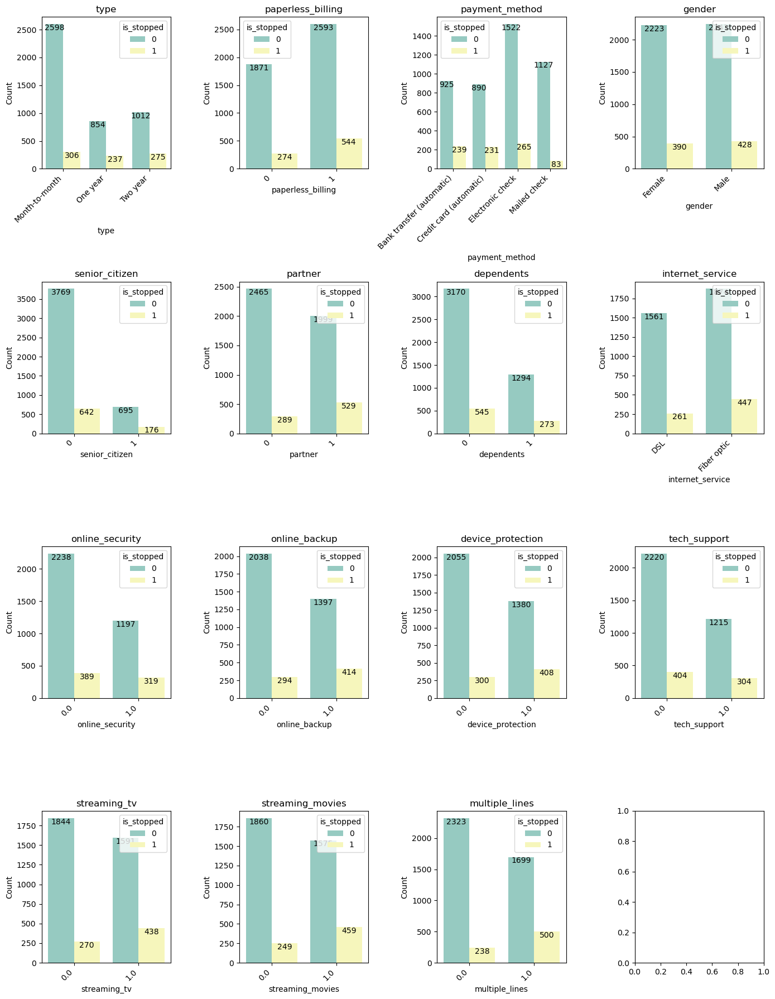

In [22]:
fig, axs = plt.subplots(ncols=4, nrows=4, figsize=(14, 18))

for (ax, feature) in zip(axs.flat, categorical_features):
    data_grouped = df.groupby([feature, 'is_stopped']).size().reset_index(name='Count')
    sns.barplot(data=data_grouped, x=feature, y='Count', hue='is_stopped', ax=ax, palette='Set3')
    ax.set_title(feature)
    ax.legend(title='is_stopped')
    ax.set_xticklabels(data_grouped[feature].unique(), rotation=45, ha='right')
    for p in ax.patches:
        ax.annotate(format(p.get_height(), '.0f'), 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', 
                    va='bottom', 
                    xytext=(0, -10), 
                    textcoords='offset points')

plt.tight_layout()
plt.show()


<link rel="preconnect" href="https://fonts.googleapis.com">
<link rel="preconnect" href="https://fonts.gstatic.com" crossorigin>
<link href="https://fonts.googleapis.com/css2?family=Open+Sans:wght@300&display=swap" rel="stylesheet">
<div style="background-color: #cce5ff; padding: 20px; border: 1px solid #cccccc; border-radius: 10px; box-shadow: 2px 2px 5px #999999;">
    <img src="https://downloader.disk.yandex.ru/preview/36b5b4bebefdd00bee94157f7918370abe32f6a5bd924089298df5b2aea3290f/64a2efc5/tRQlLxklfPyglkrgbEWnNUYRPeY6G5k9H6S5w9ieKaaANuYK_vzorCU4v3sDtgBKkOAthpD744DqiH9lgvXuzw%3D%3D?uid=0&filename=icons8-about-20.png&disposition=inline&hash=&limit=0&content_type=image%2Fpng&owner_uid=0&tknv=v2&size=2048x2048" style="float: left; margin-right: 8px; margin-top: 0;">
    <span style="font-family: 'Open Sans', sans-serif; font-size: 17px;">
        <strong>Заметка</strong>
    </span>
    <br>
    <span style="font-family: 'Open Sans', sans-serif; font-size: 14px;">
        <p>
            <strong>1) Тип подписки: </strong> <br>
            из каждой группы ушло примерно одинаковое чило клиентов. Но в процентном соотношении в лучшую сторону выделяются клиенты месячной подписки (10.6%), когда в остальных около 20%. <br>
            <strong>2) Безналичный расчет: </strong><br>
            - видно что наличный предпочитают больше людей (3137) чем безналичный (2145)<br>
            <strong>3) Способ оплаты: </strong><br>
            - есть странность -с способы оплаты не соотносятся с безналичным расчетом<br>
            <strong>5) Наличие пенсионного статуса: </strong><br>
            - Пенсия немного чаще в процентном соотношении уходит (20% против 15%)<br>
            <strong>6) Наличие супруга: </strong><br>
            - Если есть супруг то чаще уходит(22% против 10%) <br>
            <strong>8) Наличие иждивенцев: </strong><br>
            - примерно равный процент ухода <br>
            <strong>9) безопасность: </strong><br>
            <strong>10) бэкап: </strong><br>
            <strong>11) защита девайса: </strong><br>
            <strong>12) техподдержка: </strong><br>
            процент ухода больше у тех кто пользуется этими услугами<br>
            <strong>13) ТВ: </strong><br>
            <strong>14) Фильмы: </strong><br>
            Здесь так же процент ухода больше и он заметнее чем в прошлой группе, может быть клиентам не нравятся эти сервисы<br>
            <strong>15) Наличие возможности ведения параллельных линий: </strong><br>
            Здесь так же высокий процент ухода у тех кто подключил данную услугу
        </p>
    </span>
</div>


------------

In [23]:
df.head()

,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,gender,senior_citizen,...,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines,is_stopped
6212,6537-OTKMY,2018-11-01,NaT,One year,0,Electronic check,50.75,776.48,Male,0,...,0,DSL,0.0,0.0,1.0,0.0,1.0,1.0,NaN,0
5401,5124-EOGYE,2017-07-01,NaT,Two year,0,Mailed check,20.45,633.95,Male,0,...,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0
313,2799-ARNLO,2019-09-01,NaT,Month-to-month,1,Electronic check,69.35,346.75,Female,1,...,0,Fiber optic,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2638,6769-DCQLI,2015-09-01,NaT,One year,1,Bank transfer (automatic),105.00,5565.00,Male,0,...,0,Fiber optic,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0
1870,3566-HJGPK,2020-01-01,NaT,Month-to-month,1,Mailed check,45.55,45.55,Male,0,...,0,DSL,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


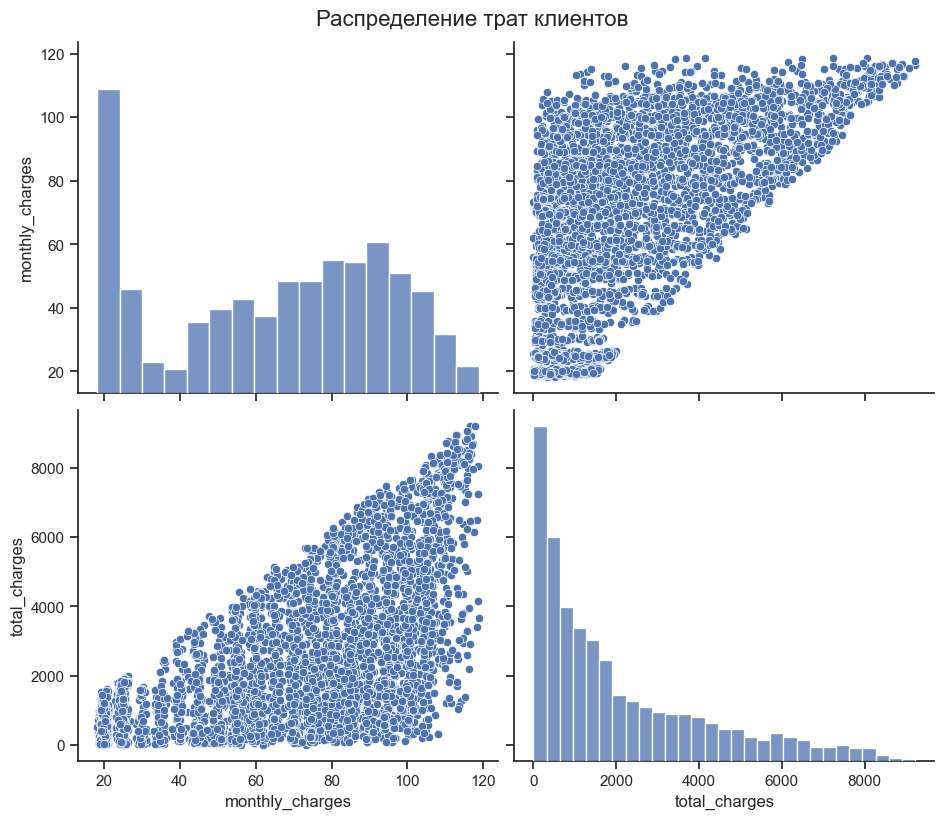

In [24]:
sns.set(style='ticks')
sns.pairplot(data=df[num_features], height=4, aspect=1.2)
plt.figtext(0.5, 1.0, 'Распределение трат клиентов', fontsize=16, ha='center')
plt.show()

<link rel="preconnect" href="https://fonts.googleapis.com">
<link rel="preconnect" href="https://fonts.gstatic.com" crossorigin>
<link href="https://fonts.googleapis.com/css2?family=Open+Sans:wght@300&display=swap" rel="stylesheet">
<div style="background-color: #cce5ff; padding: 20px; border: 1px solid #cccccc; border-radius: 10px; box-shadow: 2px 2px 5px #999999;">
    <img src="https://4.downloader.disk.yandex.ru/preview/e94d77672c67e773ce389ba975ff6f93dfa85e6bf38330994ddb167e45d43b2e/inf/FVaRiax1bkEIrSJD3W5o0vltYGLJsoGOy3uYGIvEWK3S0BJTW8uUuR5gEFPx-2OkS79cs8UznKovmnI6Pdz2hw%3D%3D?uid=839951300&filename=icons8-редактировать-20.png&disposition=inline&hash=&limit=0&content_type=image%2Fpng&owner_uid=839951300&tknv=v2&size=1344x964" style="float: left; margin-right: 8px; margin-top: 0;">
    <span style="font-family: 'Open Sans', sans-serif; font-size: 18px;">
        <strong>Заметка</strong>
    </span>
    <br>
    <span style="font-family: 'Open Sans', sans-serif; font-size: 14px;">
        <p>
           Видно что: 
            <li>тотал к месячной относятся нелинейно, но эти данные можно получить поворотом прямой </li>
            <li>есть пики около нулевых значений у total_charges </li>
            <li>если откинуть  значения около 20, то распределение у monthly_charges будет близко к нормальному</li>
        </p>
    </span>
</div>


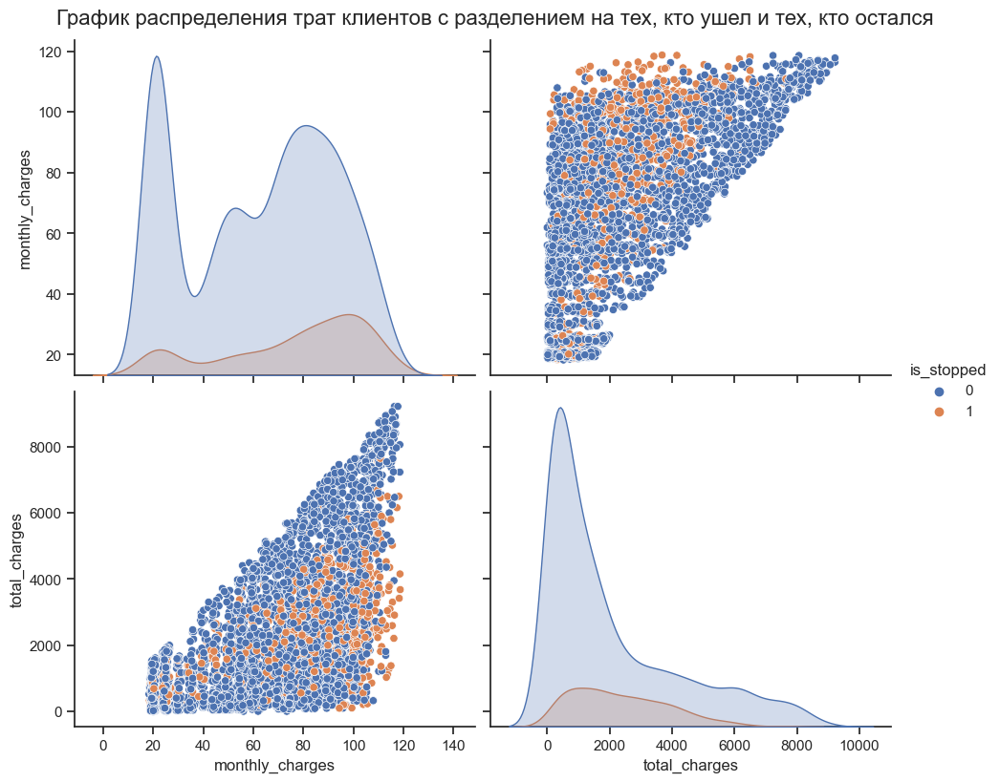

In [25]:
sns.set(style='ticks')
sns.pairplot(data=df[num_features + ['is_stopped']],hue='is_stopped', height=4, aspect=1.2)
plt.figtext(0.5, 1.0, 'График распределения трат клиентов с разделением на тех, кто ушел и тех, кто остался', 
            fontsize=16, ha='center')
plt.show()

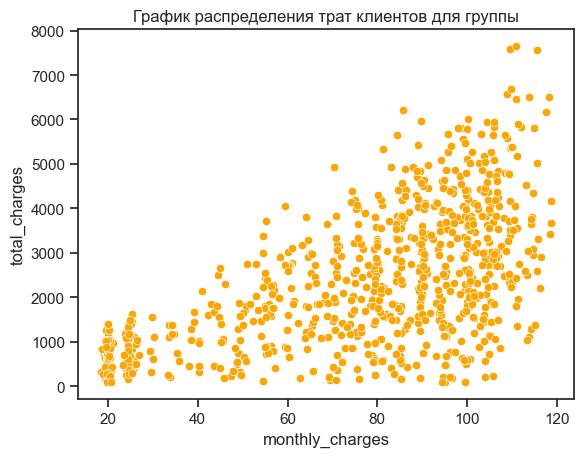

In [26]:
filtered_data = df[df['is_stopped'] == 1]
sns.scatterplot(data=filtered_data,   
                    x='monthly_charges',   
                    y='total_charges', color='orange')  
plt.title('График распределения трат клиентов для группы')   
plt.show()  

<link rel="preconnect" href="https://fonts.googleapis.com">
<link rel="preconnect" href="https://fonts.gstatic.com" crossorigin>
<link href="https://fonts.googleapis.com/css2?family=Open+Sans:wght@300&display=swap" rel="stylesheet">
<div style="background-color: #cce5ff; padding: 20px; border: 1px solid #cccccc; border-radius: 10px; box-shadow: 2px 2px 5px #999999;">
    <img src="https://4.downloader.disk.yandex.ru/preview/e94d77672c67e773ce389ba975ff6f93dfa85e6bf38330994ddb167e45d43b2e/inf/FVaRiax1bkEIrSJD3W5o0vltYGLJsoGOy3uYGIvEWK3S0BJTW8uUuR5gEFPx-2OkS79cs8UznKovmnI6Pdz2hw%3D%3D?uid=839951300&filename=icons8-редактировать-20.png&disposition=inline&hash=&limit=0&content_type=image%2Fpng&owner_uid=839951300&tknv=v2&size=1344x964" style="float: left; margin-right: 8px; margin-top: 0;">
    <span style="font-family: 'Open Sans', sans-serif; font-size: 17px;">
        <strong>Заметка</strong>
    </span>
    <br>
    <span style="font-family: 'Open Sans', sans-serif; font-size: 14px;">
        <p>
            Видно что: 
            <li>те клиенты что уходят не имеют такого выраженного пика около нуля, значит цена может являться важным фактором. + Явно виден что много людей уходит при высокой ежемесячной плате</li>
        </p>
    </span>
</div>


In [27]:
#чуть сдвину ноль чтобы можно было делить / считать логарифм
df.loc[df['total_charges'] == 0, 'total_charges'] += 0.0001

In [28]:
def create_features(df):
    df['matching_rows1'] = 0  
    df.loc[(df['online_security'] == 1) &
           (df['online_backup'] == 1) & 
           (df['device_protection'] == 1) & 
           (df['tech_support'] == 1), 'matching_rows1'] = 1  

    df['matching_rows2'] = 0  
    df.loc[(df['streaming_tv'] == 1) &
           (df['streaming_movies'] == 1), 'matching_rows2'] = 1  

    df['matching_rows3'] = 0  
    df.loc[(df['streaming_tv'] == 1) &
           (df['streaming_movies'] == 1) & (df['multiple_lines'] == 1) , 'matching_rows3'] = 1  

    df['matching_rows4'] = 0  
    df.loc[(df['type'].isin(['One year', 'Two year'])) &
           (df['senior_citizen'] == 0) & (df['partner'] == 1) , 'matching_rows4'] = 1  

    df['matching_rows5'] = 0  
    df.loc[(df['type'].isin(['One year', 'Two year'])) &
           (df['senior_citizen'] == 1) & (df['partner'] == 1) , 'matching_rows5'] = 1  

    df['matching_rows6'] = 0  
    df.loc[(df['senior_citizen'] == 1) & (df['partner'] == 1) , 'matching_rows6'] = 1  

    df['matching_rows7'] = 0  
    df.loc[(df['senior_citizen'] == 0) & (df['partner'] == 1) , 'matching_rows7'] = 1 

    df['matching_rows8'] = 0  
    df.loc[(df['senior_citizen'] == 1) & (df['partner'] == 0) , 'matching_rows8'] = 1 

    df['matching_rows9'] = 0  
    df.loc[(df['senior_citizen'] == 0) & (df['partner'] == 0) , 'matching_rows9'] = 1 

    df['matching_rows10'] = 0  
    df.loc[(df['monthly_charges'] > 30), 'matching_rows10'] = 1 

    df['matching_rows11'] = 0  
    df.loc[(df['monthly_charges'] > 21), 'matching_rows11'] = 1 


    df['duration'] = np.where(df['end_date'].isna(), pd.to_datetime('2020-02-01') - df['begin_date'], 
                              df['end_date'] - df['begin_date'])
    df['duration'] = df['duration'].dt.days

    df['log_transform_monthly_charges'] = boxcox(df['monthly_charges'], lmbda=0)
    df['log_transform_total_charges'] = boxcox(df['total_charges'], lmbda=0)

    df['boxcox_transform_monthly_charges'] = boxcox(df['monthly_charges'], lmbda=0.917)
    df['boxcox_transform_total_charges'] = boxcox(df['total_charges'], lmbda=0.246)


    df['div'] = df['total_charges']/df['monthly_charges']
    df['div12'] = df['total_charges']/(df['monthly_charges']*12)
    df['div_all'] =  df['total_charges']/(df['monthly_charges']*(df['duration']+10**(-5))/30)

    return df



**Группа 1** - Клиенты которые одновременно пользуются online_security, online_backup, device_protection, tech_support   
**Группа 2** - Клиенты которые одновременно пользуются стриминговыми сервисами  
**Группа 3** - Клиенты которые одновременно пользуются стриминговыми сервисами и multiple_lines  
**Группа 4** - Клиенты у которых тип подписки - год/два, которые не являются пенсионерами и есть партнер  
**Группа 5** - Клиенты у которых тип подписки - год/два, которые являются пенсионерами и есть партнер   
**Группа 6** - пенсия + партнер    
**Группа 7** - не пенсия + партнер    
**Группа 8** - пенсия + не партнер   
**Группа 9** - не пенсия + партнер   
**Группа 10** - отделим пик  20 и пик около 20  
**Группа 11** - отделим пик  20

**Фича duration** - сколько дней пользование

(не забыть сместить 0!/)  
**log_transform_monthly_charges** - лог трансформ monthly_charges  
**log_transform_total_charges** - лог трансформ total_charges  
**boxcox_transform_monthly_charges** - бокс кокс 0.917  monthly_charges  
**boxcox_transform_total_charges** - бокс кокс 0.246  total_charges    
  
**div** -  
**div12** -  
**div_all** -  

In [29]:
def distribution_groups(group):
    '''Функция отрисовывает распределение для созданных групп
       -----
       На вход подается номер группы от 1 до 11'''
    
    if group not in range(1,12):
        raise ValueError('Group должен быть в отрезке 1 до 11')
    
    sns.set(style='ticks')
    sns.pairplot(data=df[num_features + ['matching_rows' + str(group)]],hue='matching_rows' + str(group), height=4, aspect=1.2)
    plt.figtext(0.5, 1.0, 'График распределения трат клиентов с разделением на группу ' + str(group), 
                fontsize=16, ha='center')
    plt.show()
    
    filtered_data = df[df['matching_rows' + str(group)] == 1]
    sns.scatterplot(data=filtered_data,   
                    x='monthly_charges',   
                    y='total_charges', color='orange')  
    plt.title('График распределения трат клиентов для группы ' + str(group))   
    plt.show()  

    data_grouped = df.groupby(['matching_rows'+ str(group), 'is_stopped']).size().reset_index(name='Count')  
    total_counts = data_grouped.groupby('matching_rows'+ str(group))['Count'].transform('sum')  
    data_grouped['Percentage'] = data_grouped['Count'] / total_counts * 100  

    sns.barplot(data=data_grouped, x='matching_rows'+ str(group), y='Percentage', hue='is_stopped', palette='Set3')  
    plt.title('Group '+ str(group))  
    plt.legend(title='is_stopped')  
    plt.ylabel('Percentage')  
    plt.show()  
    
    data_grouped = df.groupby(['matching_rows'+ str(group), 'is_stopped']).size().reset_index(name='Count')
    sns.barplot(data=data_grouped, x='matching_rows'+ str(group), y='Count', hue='is_stopped', palette='Set3')
    ax.set_title('matching_rows'+ str(group))
    ax.legend(title='is_stopped')


In [30]:
df = create_features(df)

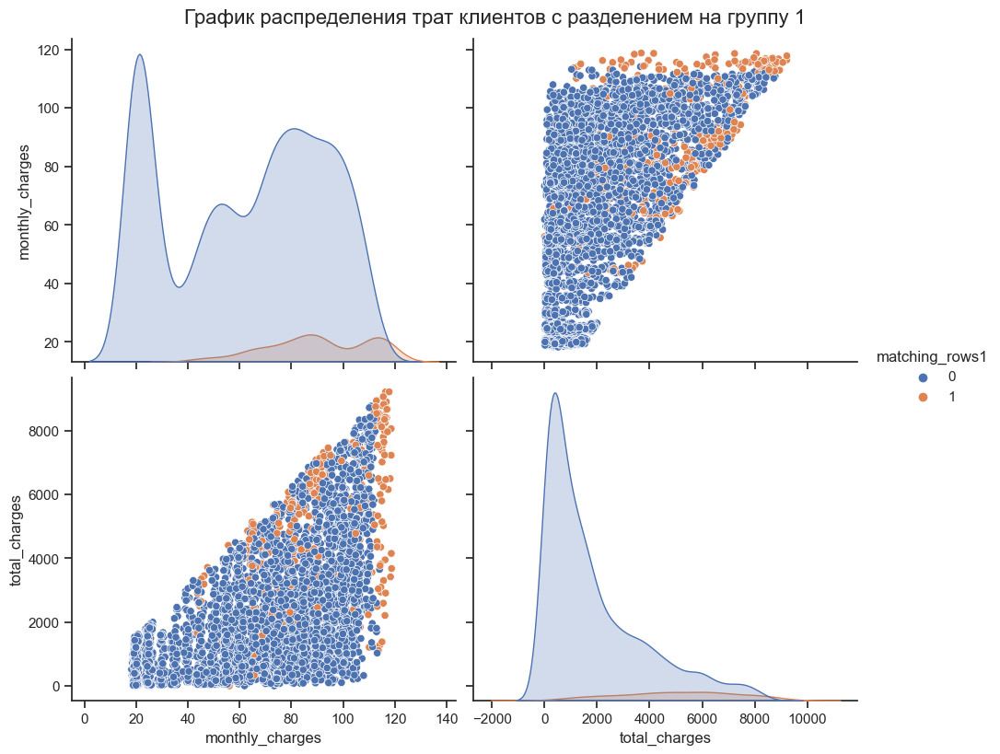

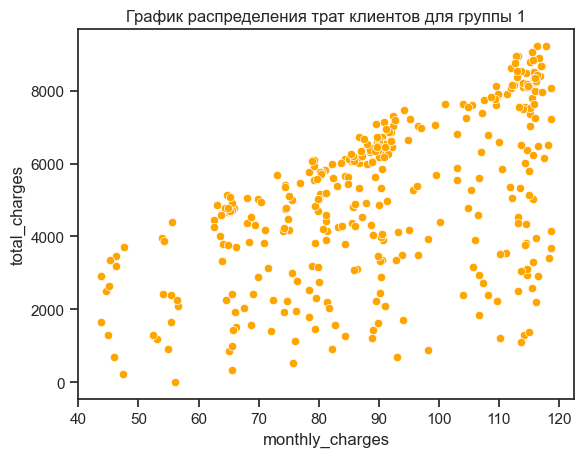

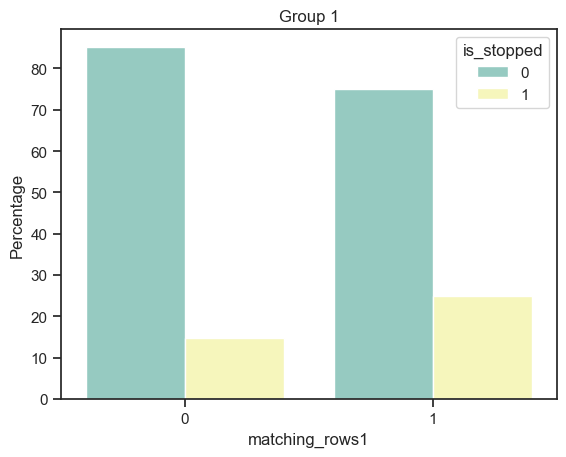

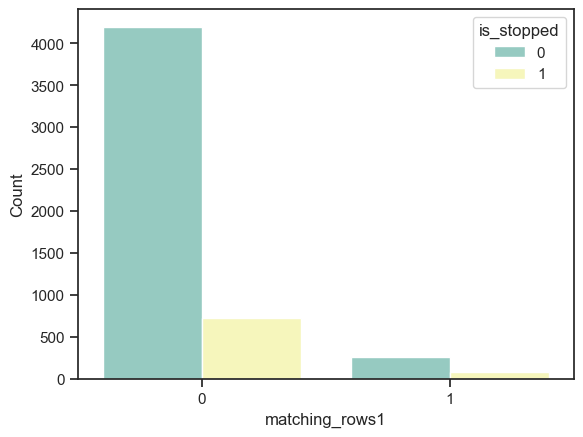

In [31]:
distribution_groups(1)

<link rel="preconnect" href="https://fonts.googleapis.com">
<link rel="preconnect" href="https://fonts.gstatic.com" crossorigin>
<link href="https://fonts.googleapis.com/css2?family=Open+Sans:wght@300&display=swap" rel="stylesheet">
<div style="background-color: #cce5ff; padding: 20px; border: 1px solid #cccccc; border-radius: 10px; box-shadow: 2px 2px 5px #999999;">
    <img src="https://4.downloader.disk.yandex.ru/preview/e94d77672c67e773ce389ba975ff6f93dfa85e6bf38330994ddb167e45d43b2e/inf/FVaRiax1bkEIrSJD3W5o0vltYGLJsoGOy3uYGIvEWK3S0BJTW8uUuR5gEFPx-2OkS79cs8UznKovmnI6Pdz2hw%3D%3D?uid=839951300&filename=icons8-редактировать-20.png&disposition=inline&hash=&limit=0&content_type=image%2Fpng&owner_uid=839951300&tknv=v2&size=1344x964" style="float: left; margin-right: 8px; margin-top: 0;">
    <span style="font-family: 'Open Sans', sans-serif; font-size: 17px;">
        <strong>Заметка</strong>
    </span>
    <br>
    <span style="font-family: 'Open Sans', sans-serif; font-size: 14px;">
        <p>
           Эта группа с "активными" пользователями<br>
           Видно что: 
            <li>Группы имеют сильный дисбаланс </li>
            <li> Группа "активных" имеет некий тренд к нахождению на границах sactter'а </li>
            <li>В этой группе % ушедших > 20</li>
        </p> 
    </span>
</div>


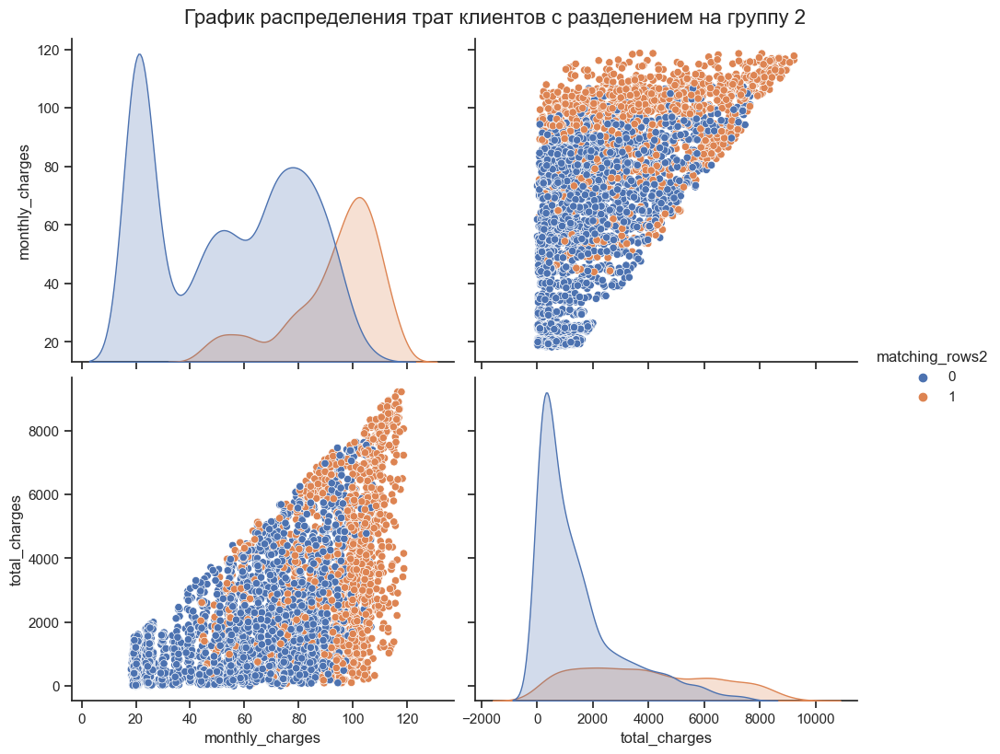

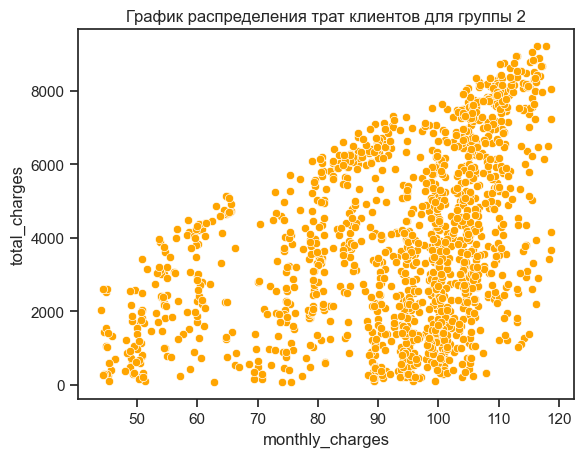

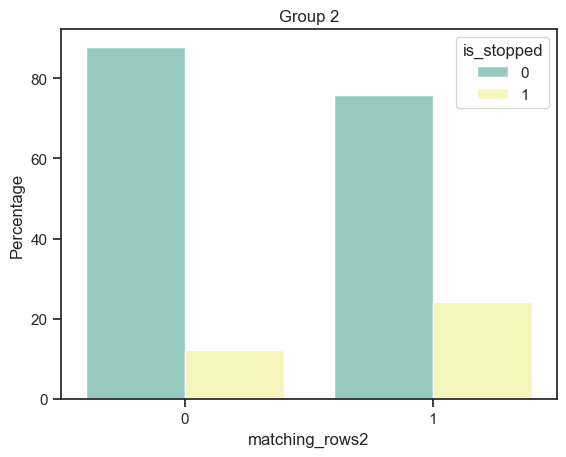

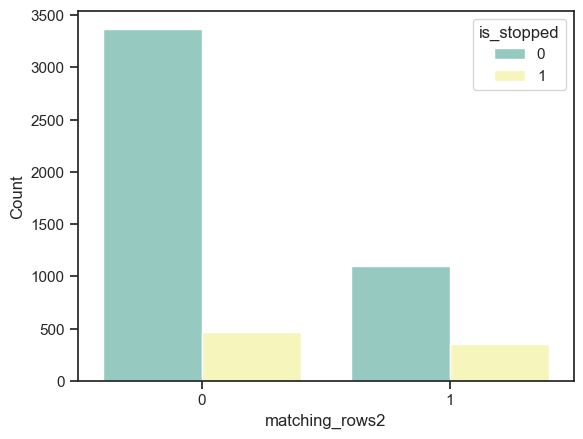

In [32]:
distribution_groups(2)

<link rel="preconnect" href="https://fonts.googleapis.com">
<link rel="preconnect" href="https://fonts.gstatic.com" crossorigin>
<link href="https://fonts.googleapis.com/css2?family=Open+Sans:wght@300&display=swap" rel="stylesheet">
<div style="background-color: #cce5ff; padding: 20px; border: 1px solid #cccccc; border-radius: 10px; box-shadow: 2px 2px 5px #999999;">
    <img src="https://4.downloader.disk.yandex.ru/preview/e94d77672c67e773ce389ba975ff6f93dfa85e6bf38330994ddb167e45d43b2e/inf/FVaRiax1bkEIrSJD3W5o0vltYGLJsoGOy3uYGIvEWK3S0BJTW8uUuR5gEFPx-2OkS79cs8UznKovmnI6Pdz2hw%3D%3D?uid=839951300&filename=icons8-редактировать-20.png&disposition=inline&hash=&limit=0&content_type=image%2Fpng&owner_uid=839951300&tknv=v2&size=1344x964" style="float: left; margin-right: 8px; margin-top: 0;">
    <span style="font-family: 'Open Sans', sans-serif; font-size: 17px;">
        <strong>Заметка</strong>
    </span>
    <br>
    <span style="font-family: 'Open Sans', sans-serif; font-size: 14px;">
        <p>
            Видно что: 
            <li>Эта группа с преобладаниием monthly_charges больше 90  и меньше 110 c равномерным заполнением total_charges </li>
            <li>Дисбаланс между группами примерно 1 к 3 </li>
            <li>процент ушедших > 20 в данной группе</li>
        </p>
    </span>
</div>


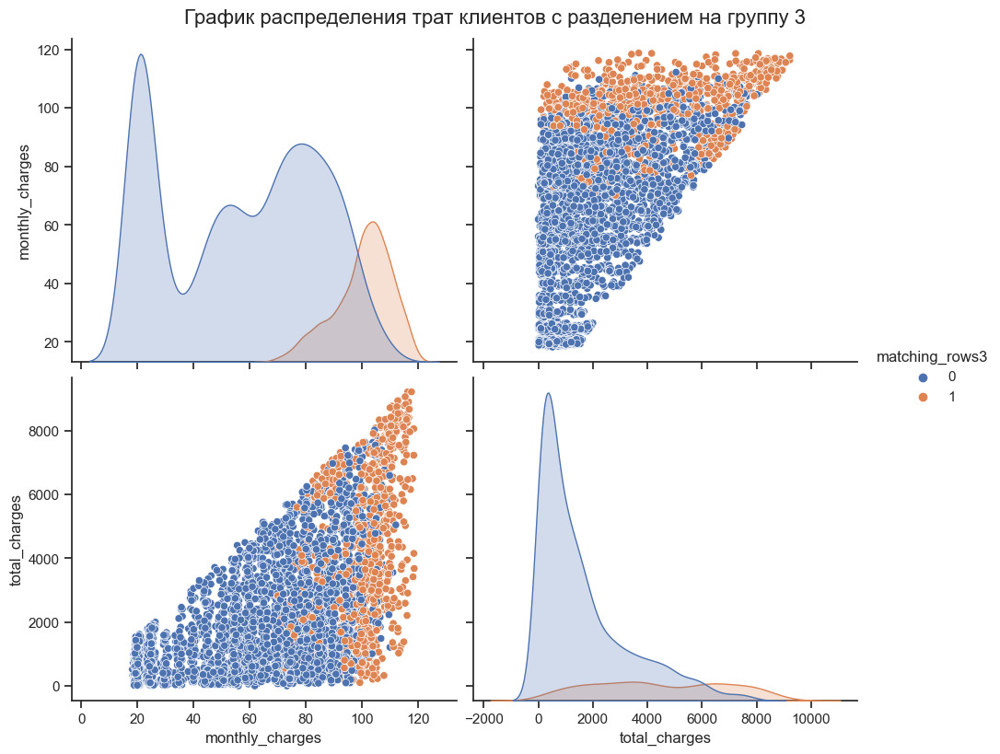

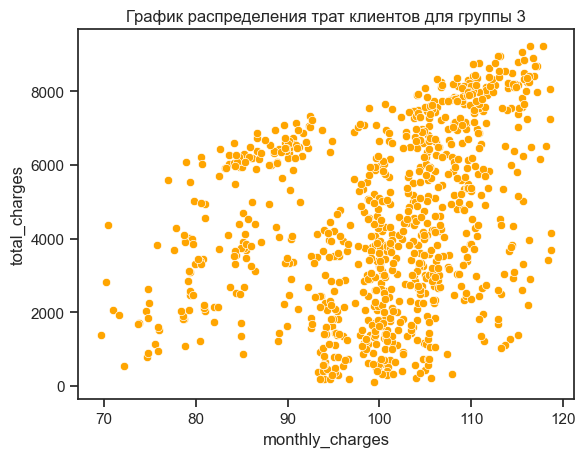

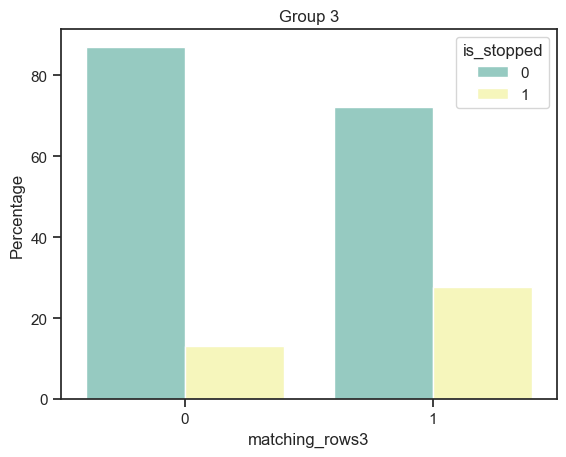

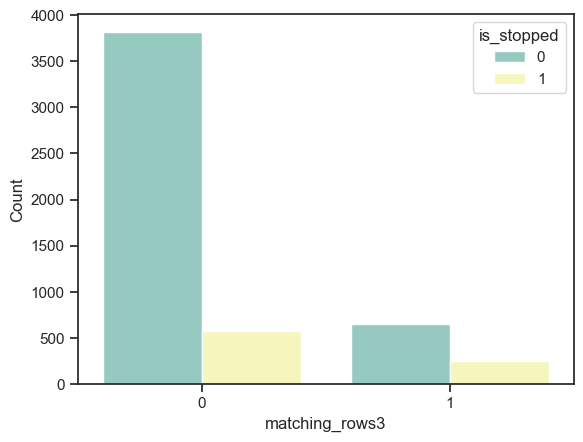

In [33]:
distribution_groups(3)

<link rel="preconnect" href="https://fonts.googleapis.com">
<link rel="preconnect" href="https://fonts.gstatic.com" crossorigin>
<link href="https://fonts.googleapis.com/css2?family=Open+Sans:wght@300&display=swap" rel="stylesheet">
<div style="background-color: #cce5ff; padding: 20px; border: 1px solid #cccccc; border-radius: 10px; box-shadow: 2px 2px 5px #999999;">
    <img src="https://4.downloader.disk.yandex.ru/preview/e94d77672c67e773ce389ba975ff6f93dfa85e6bf38330994ddb167e45d43b2e/inf/FVaRiax1bkEIrSJD3W5o0vltYGLJsoGOy3uYGIvEWK3S0BJTW8uUuR5gEFPx-2OkS79cs8UznKovmnI6Pdz2hw%3D%3D?uid=839951300&filename=icons8-редактировать-20.png&disposition=inline&hash=&limit=0&content_type=image%2Fpng&owner_uid=839951300&tknv=v2&size=1344x964" style="float: left; margin-right: 8px; margin-top: 0;">
    <span style="font-family: 'Open Sans', sans-serif; font-size: 17px;">
        <strong>Заметка</strong>
    </span>
    <br>
    <span style="font-family: 'Open Sans', sans-serif; font-size: 14px;">
        <p>
            Видно что :
            <li>Так же есть дисбаланс</li>
            <li>Эта группа так же много платит ежемесячно и имеет +- равномерное распределение по total_charges в пределеах 95-105   monthly_charges</li>
            <li>В этой группе процент ухода близится к 30</li>
        </p>
    </span>
</div>


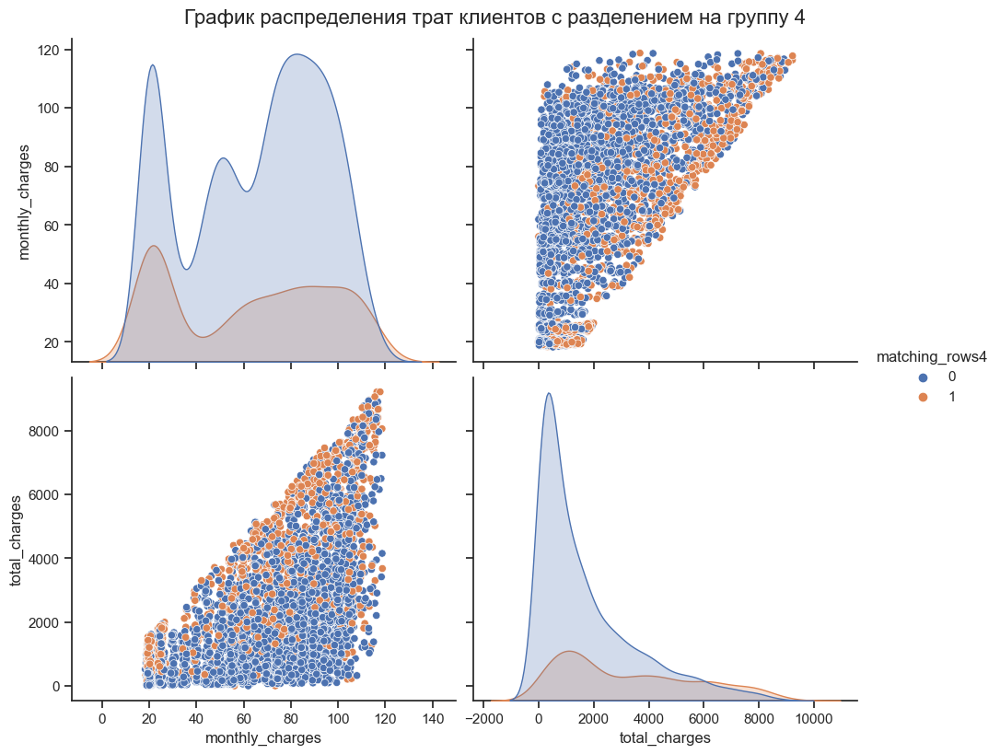

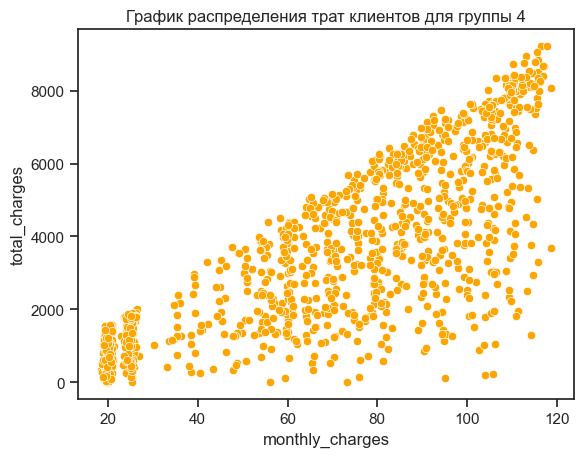

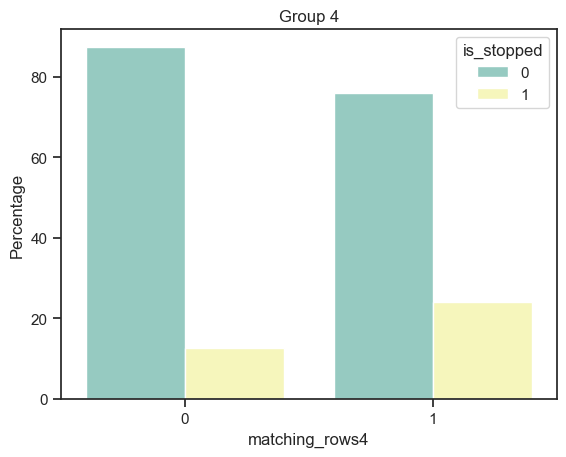

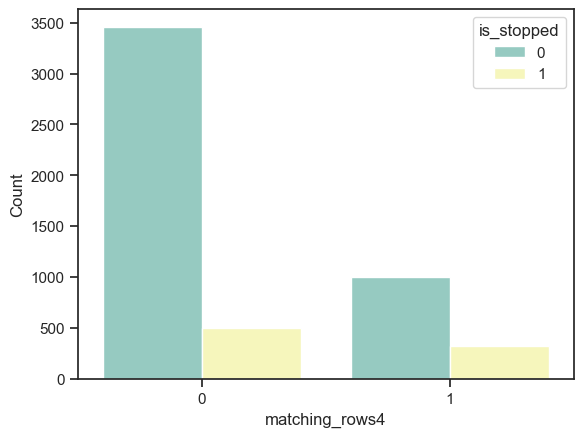

In [34]:
distribution_groups(4)

<link rel="preconnect" href="https://fonts.googleapis.com">
<link rel="preconnect" href="https://fonts.gstatic.com" crossorigin>
<link href="https://fonts.googleapis.com/css2?family=Open+Sans:wght@300&display=swap" rel="stylesheet">
<div style="background-color: #cce5ff; padding: 20px; border: 1px solid #cccccc; border-radius: 10px; box-shadow: 2px 2px 5px #999999;">
    <img src="https://4.downloader.disk.yandex.ru/preview/e94d77672c67e773ce389ba975ff6f93dfa85e6bf38330994ddb167e45d43b2e/inf/FVaRiax1bkEIrSJD3W5o0vltYGLJsoGOy3uYGIvEWK3S0BJTW8uUuR5gEFPx-2OkS79cs8UznKovmnI6Pdz2hw%3D%3D?uid=839951300&filename=icons8-редактировать-20.png&disposition=inline&hash=&limit=0&content_type=image%2Fpng&owner_uid=839951300&tknv=v2&size=1344x964" style="float: left; margin-right: 8px; margin-top: 0;">
    <span style="font-family: 'Open Sans', sans-serif; font-size: 17px;">
        <strong>Заметка</strong>
    </span>
    <br>
    <span style="font-family: 'Open Sans', sans-serif; font-size: 14px;">
        <p>
            Тут выделенная группа похожа на тех что в нее не попали, посмотреть на важности -> если не играет то удалить.
        </p>
    </span>
</div>


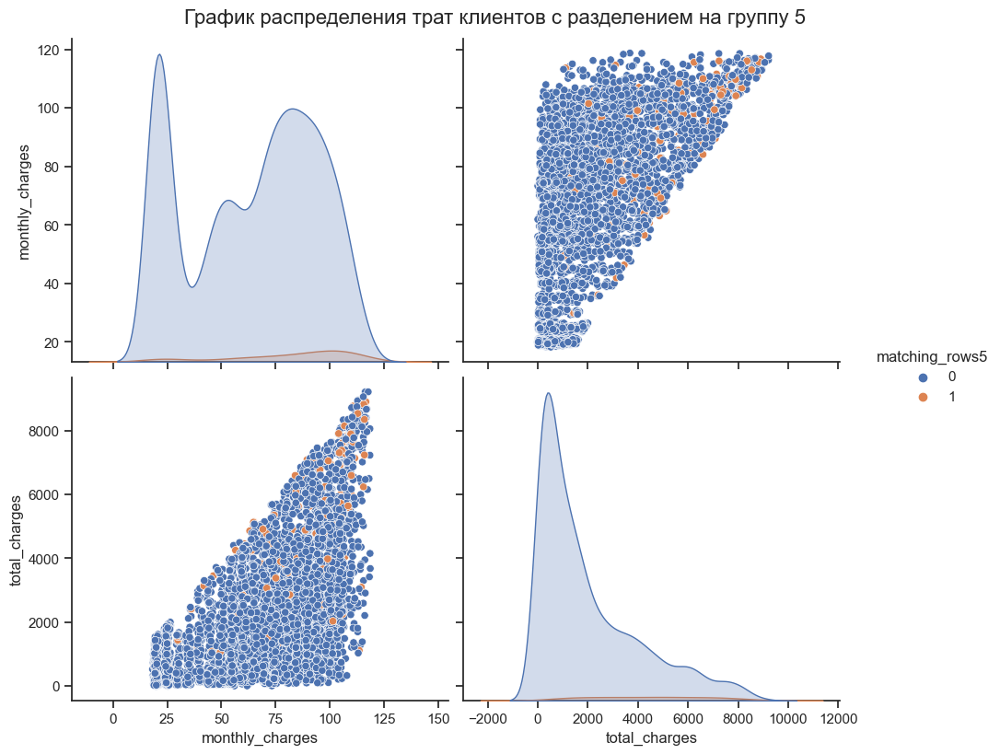

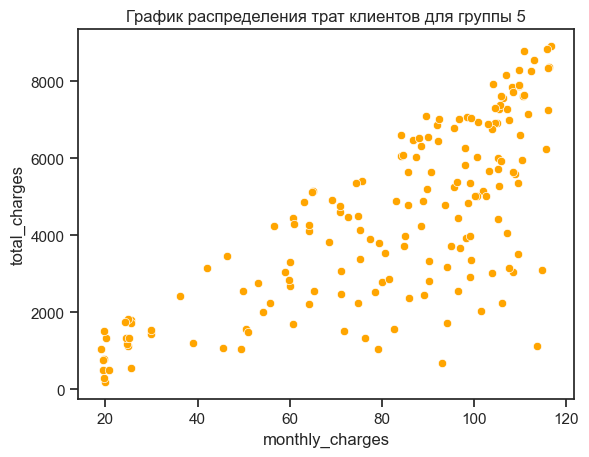

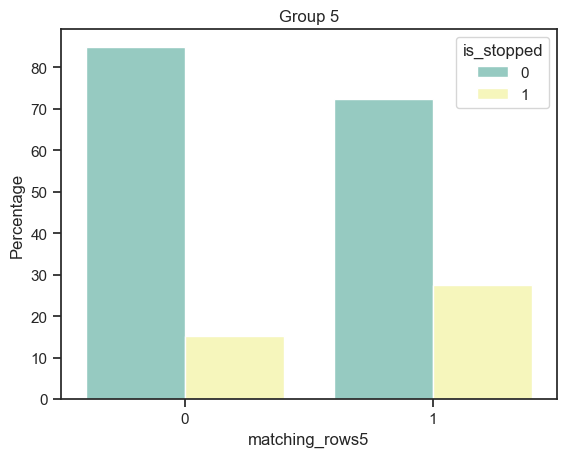

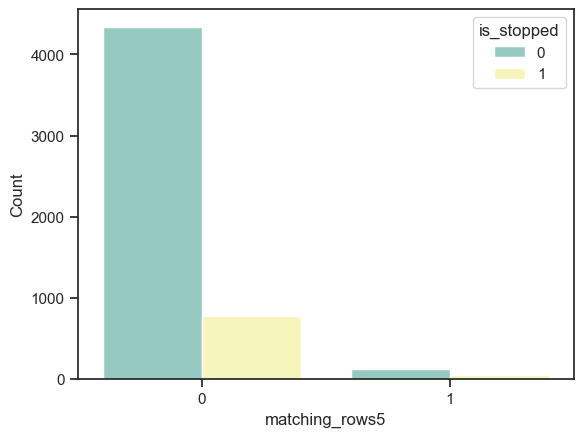

In [35]:
distribution_groups(5)

<link rel="preconnect" href="https://fonts.googleapis.com">
<link rel="preconnect" href="https://fonts.gstatic.com" crossorigin>
<link href="https://fonts.googleapis.com/css2?family=Open+Sans:wght@300&display=swap" rel="stylesheet">
<div style="background-color: #cce5ff; padding: 20px; border: 1px solid #cccccc; border-radius: 10px; box-shadow: 2px 2px 5px #999999;">
    <img src="https://4.downloader.disk.yandex.ru/preview/e94d77672c67e773ce389ba975ff6f93dfa85e6bf38330994ddb167e45d43b2e/inf/FVaRiax1bkEIrSJD3W5o0vltYGLJsoGOy3uYGIvEWK3S0BJTW8uUuR5gEFPx-2OkS79cs8UznKovmnI6Pdz2hw%3D%3D?uid=839951300&filename=icons8-редактировать-20.png&disposition=inline&hash=&limit=0&content_type=image%2Fpng&owner_uid=839951300&tknv=v2&size=1344x964" style="float: left; margin-right: 8px; margin-top: 0;">
    <span style="font-family: 'Open Sans', sans-serif; font-size: 17px;">
        <strong>Заметка</strong>
    </span>
    <br>
    <span style="font-family: 'Open Sans', sans-serif; font-size: 14px;">
        <p>
            <li>Сильный дисбаланас </li>
            <li>% ухода в группе около 30</li>
        </p>
    </span>
</div>


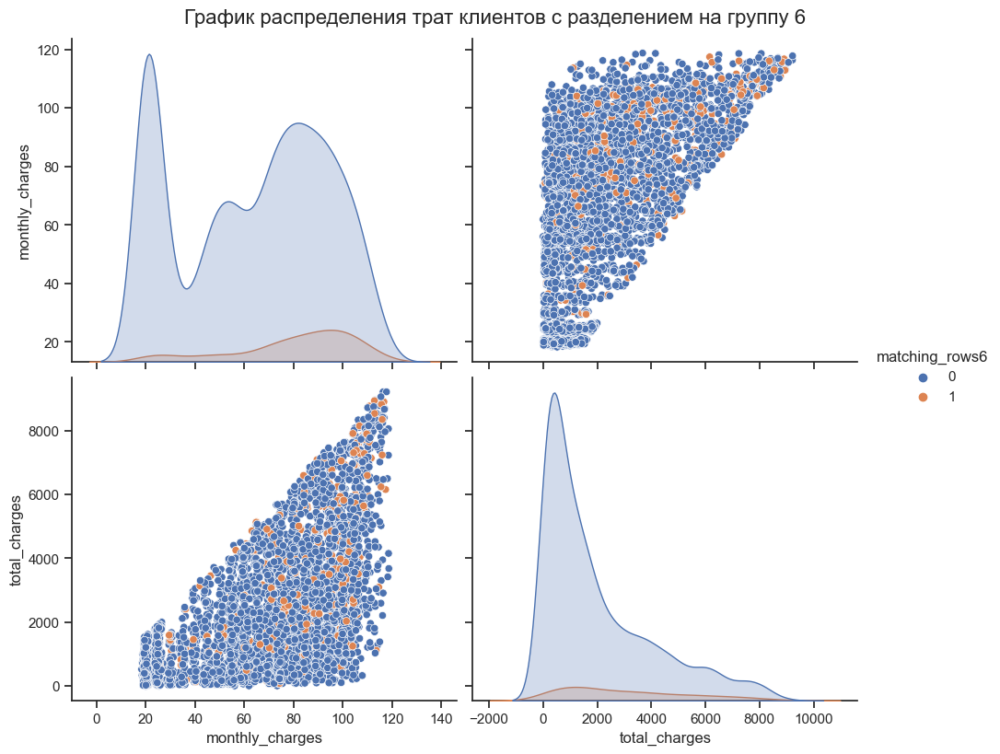

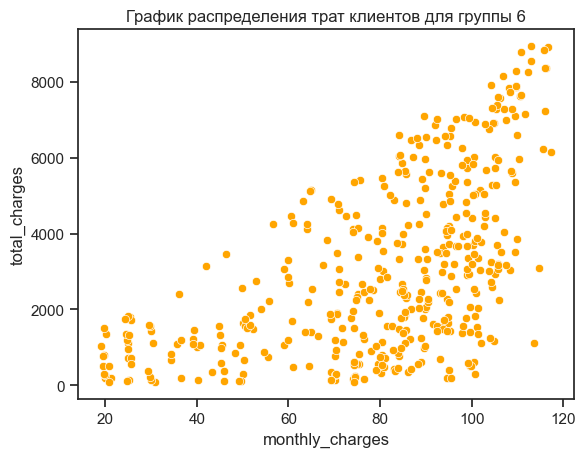

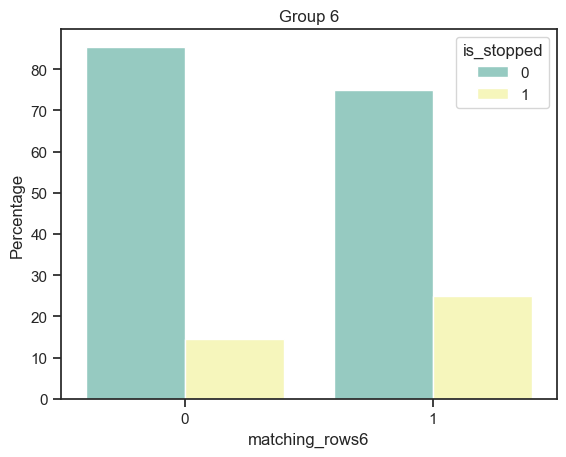

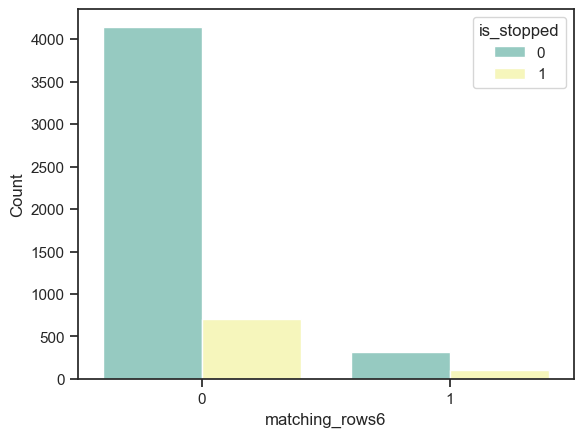

In [36]:
distribution_groups(6)

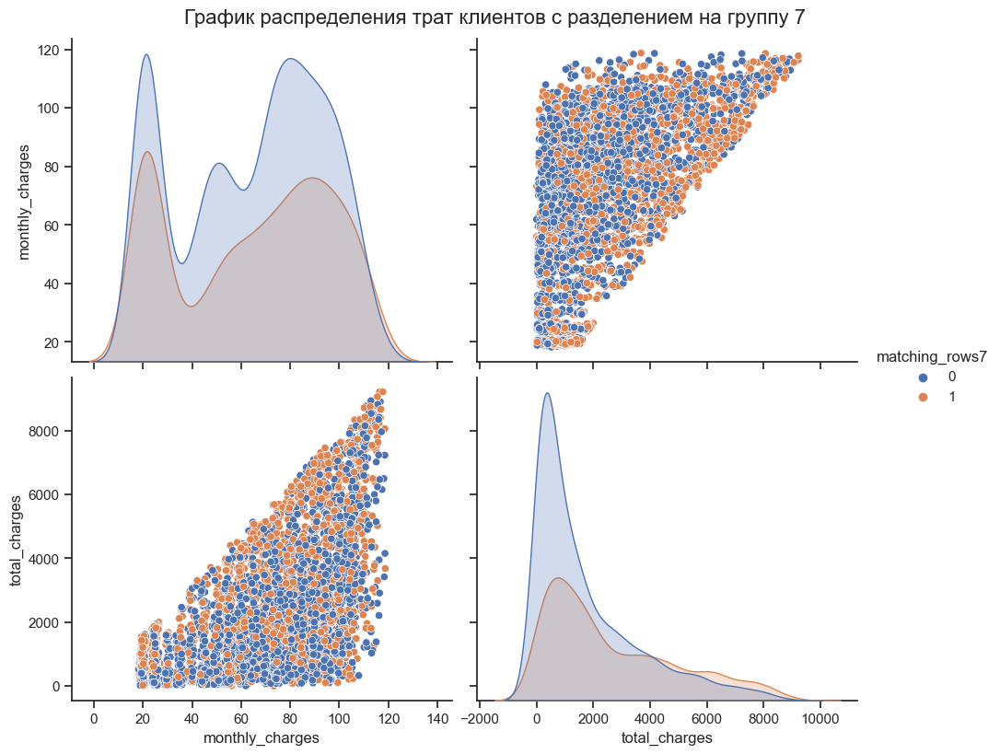

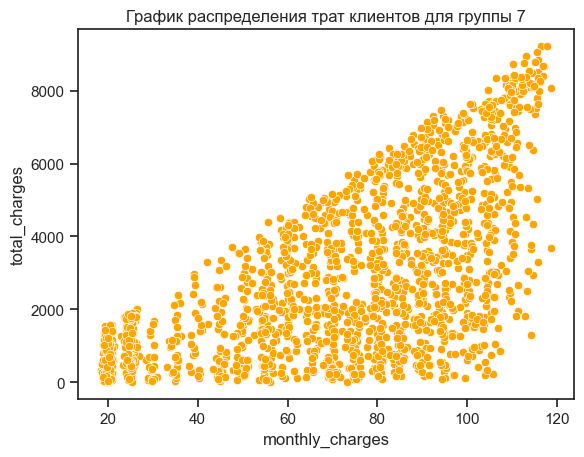

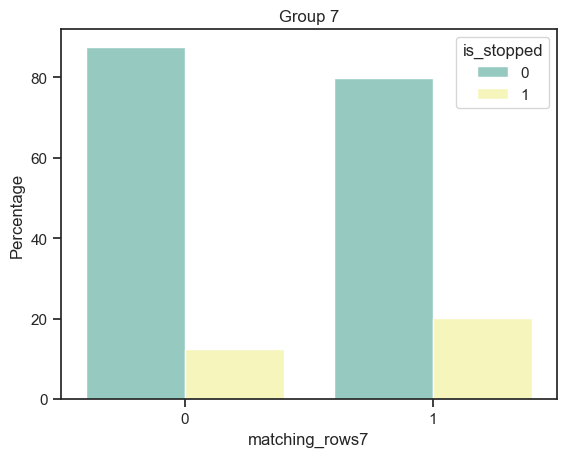

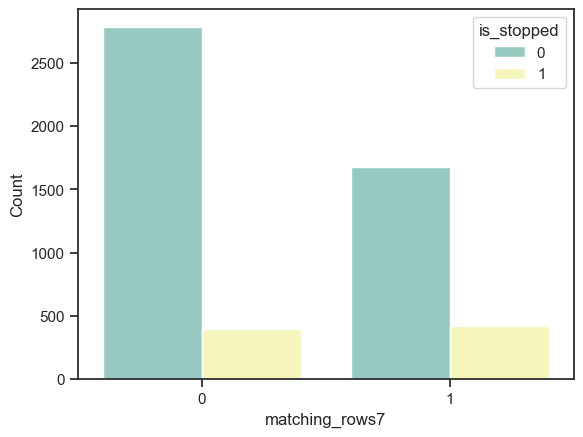

In [37]:
distribution_groups(7)

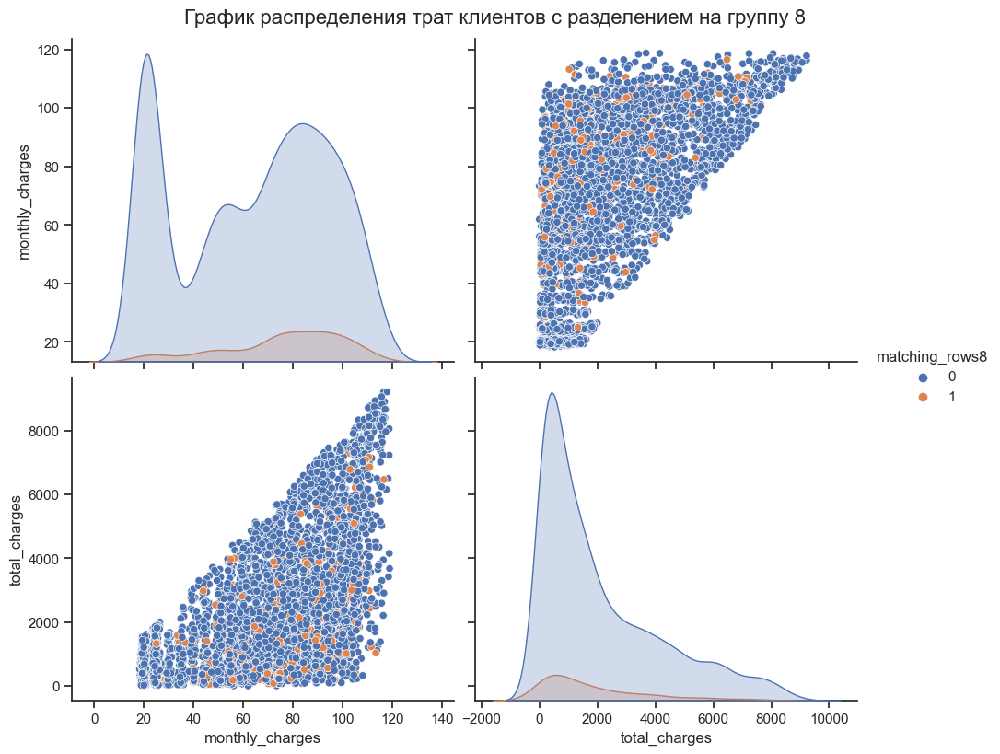

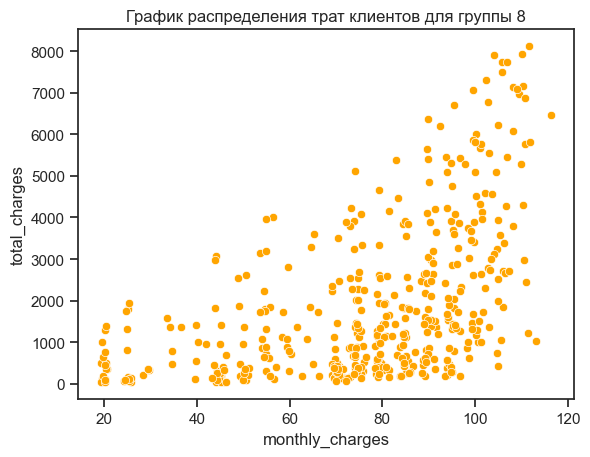

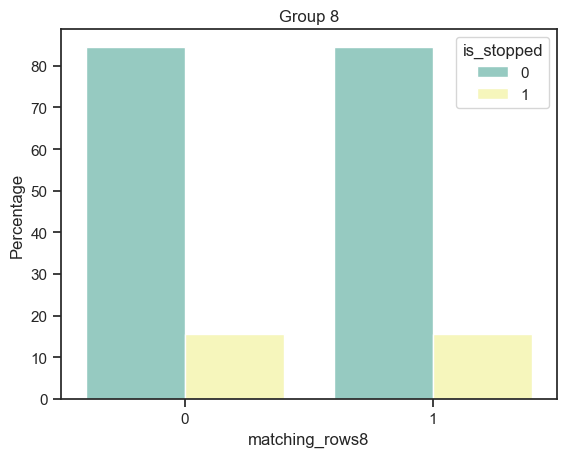

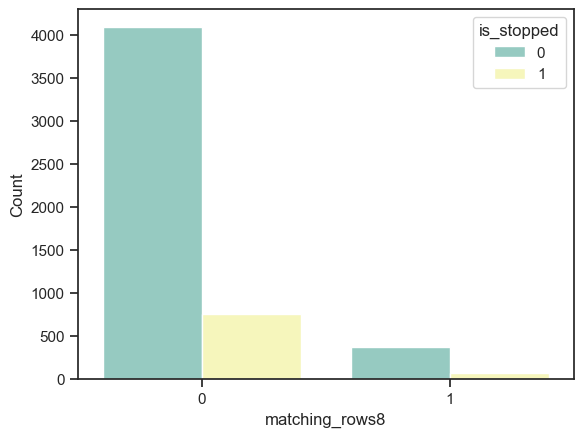

In [38]:
distribution_groups(8)

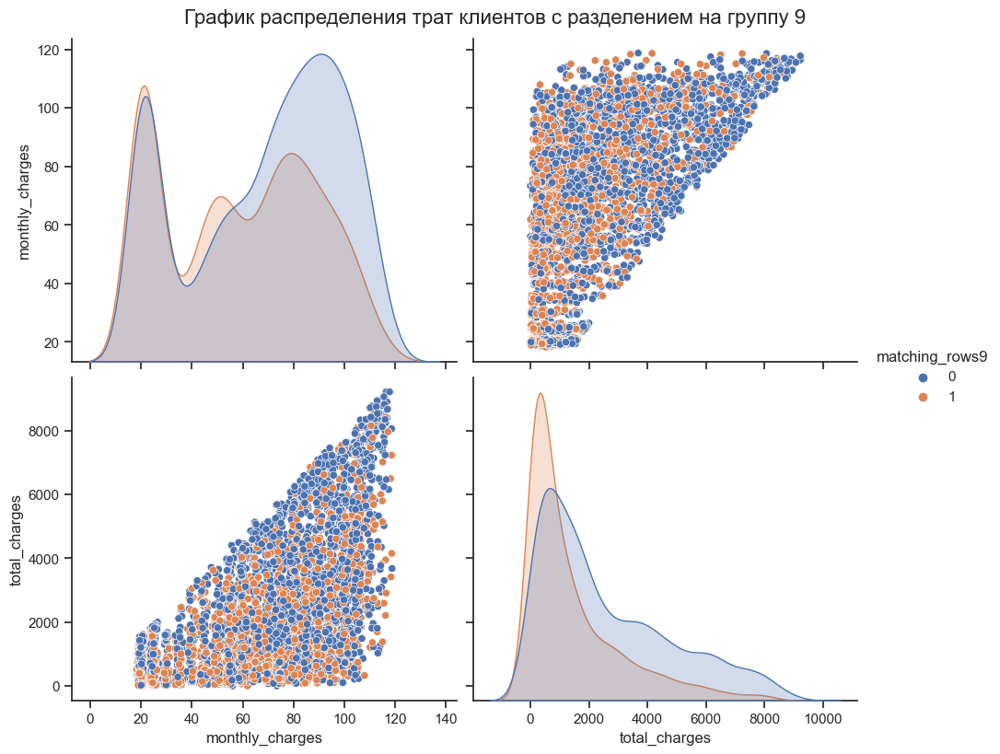

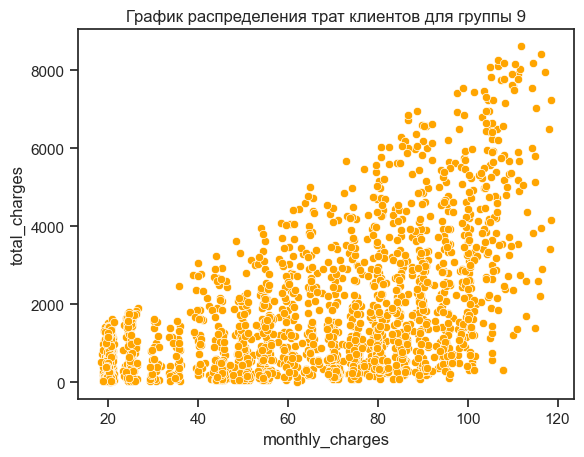

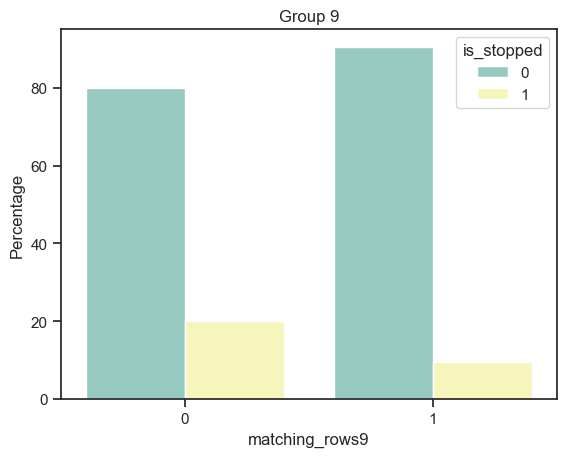

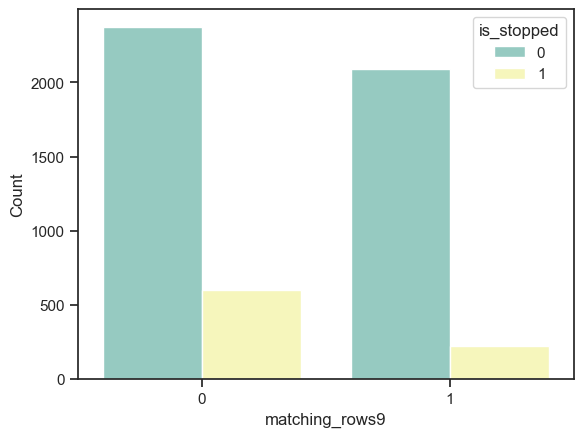

In [39]:
distribution_groups(9)

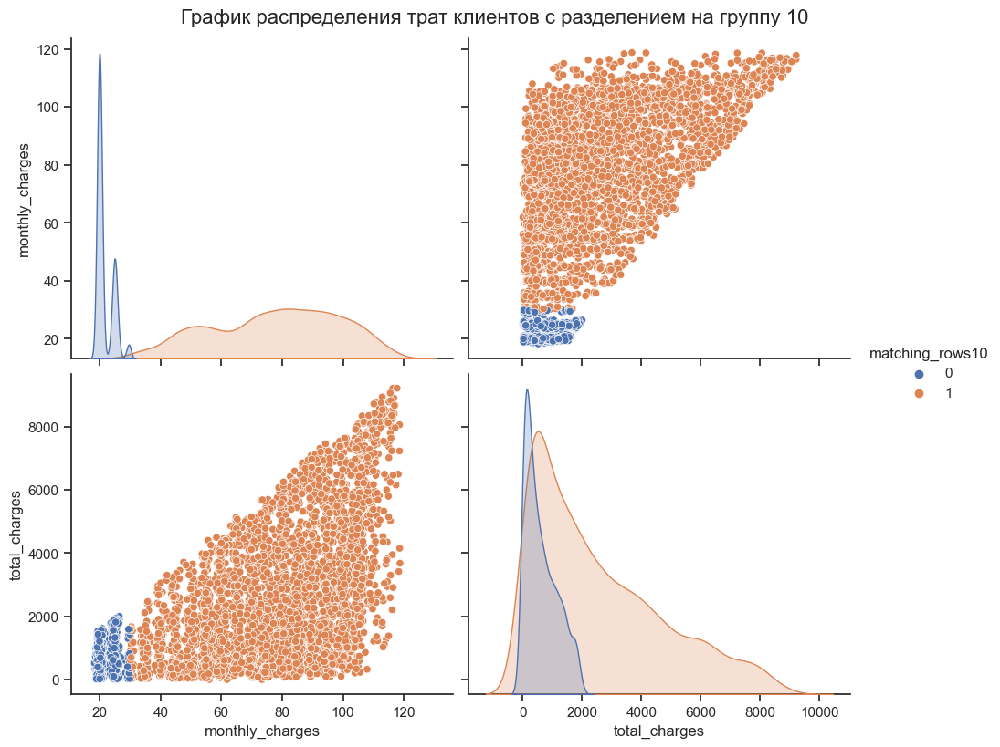

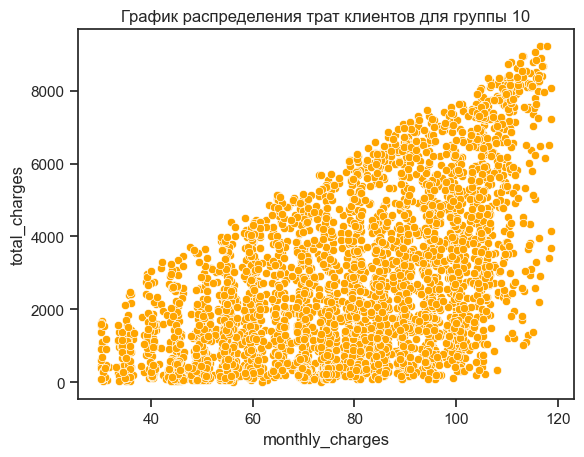

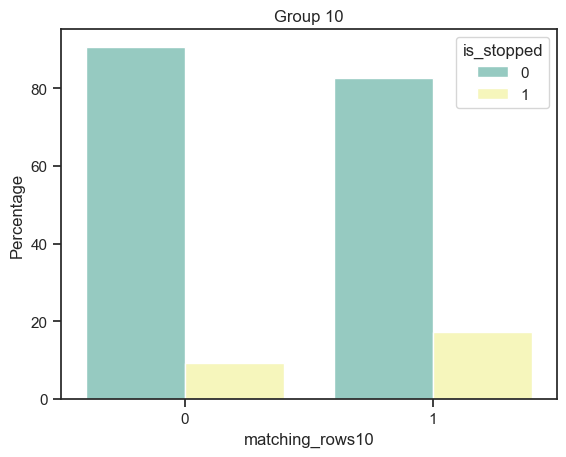

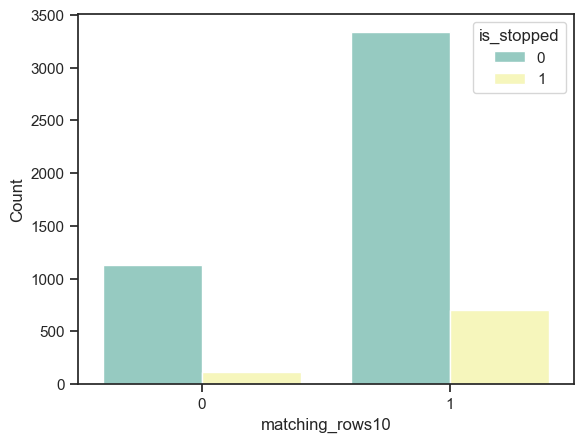

In [40]:
distribution_groups(10)

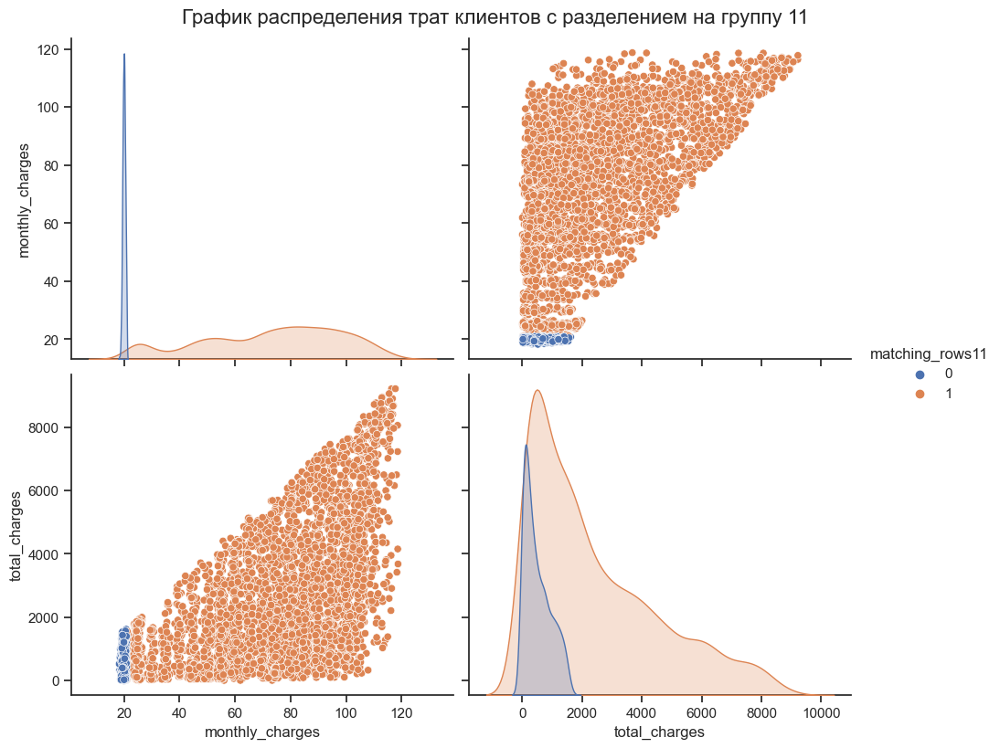

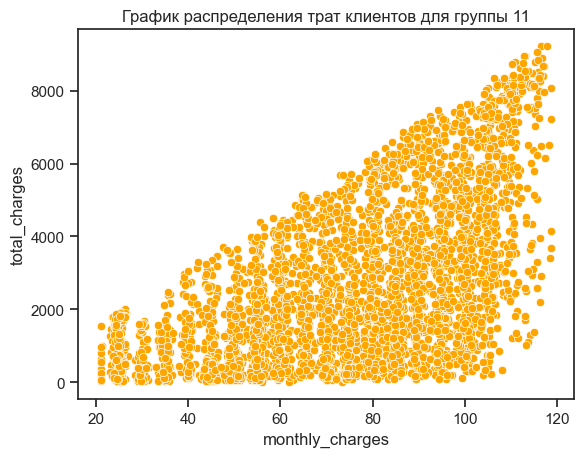

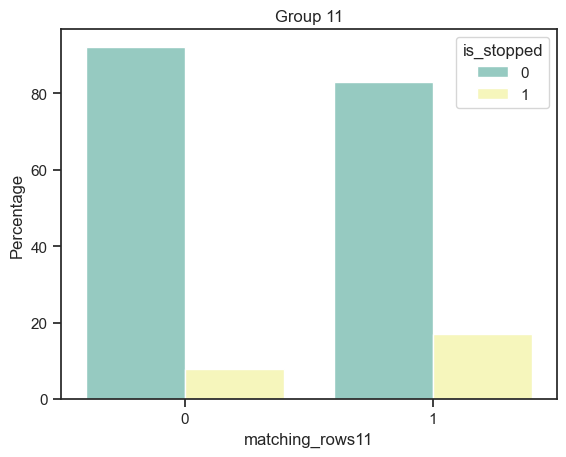

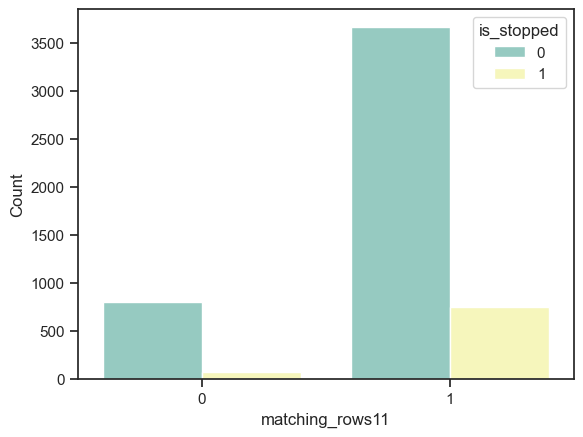

In [41]:
distribution_groups(11)

<link rel="preconnect" href="https://fonts.googleapis.com">
<link rel="preconnect" href="https://fonts.gstatic.com" crossorigin>
<link href="https://fonts.googleapis.com/css2?family=Open+Sans:wght@300&display=swap" rel="stylesheet">
<div style="background-color: #cce5ff; padding: 20px; border: 1px solid #cccccc; border-radius: 10px; box-shadow: 2px 2px 5px #999999;">
    <img src="https://4.downloader.disk.yandex.ru/preview/e94d77672c67e773ce389ba975ff6f93dfa85e6bf38330994ddb167e45d43b2e/inf/FVaRiax1bkEIrSJD3W5o0vltYGLJsoGOy3uYGIvEWK3S0BJTW8uUuR5gEFPx-2OkS79cs8UznKovmnI6Pdz2hw%3D%3D?uid=839951300&filename=icons8-редактировать-20.png&disposition=inline&hash=&limit=0&content_type=image%2Fpng&owner_uid=839951300&tknv=v2&size=1344x964" style="float: left; margin-right: 8px; margin-top: 0;">
    <span style="font-family: 'Open Sans', sans-serif; font-size: 17px;">
        <strong>Заметка</strong>
    </span>
    <br>
    <span style="font-family: 'Open Sans', sans-serif; font-size: 14px;">
        <p>
            Видно что те кто имеют подписки с оплатой около 20 редко уходят
        </p>
    </span>
</div>


<AxesSubplot:xlabel='monthly_charges', ylabel='total_charges'>

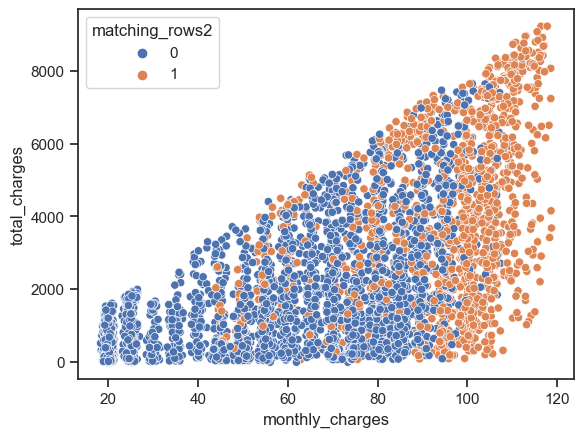

In [42]:
df['matching_rows2']
sns.scatterplot(data=df, x='monthly_charges',y='total_charges', hue='matching_rows2')

boxcox_transform_monthly_charges


In [43]:
X = df.loc[:, ['boxcox_transform_monthly_charges','boxcox_transform_total_charges']]

<AxesSubplot:xlabel='boxcox_transform_monthly_charges', ylabel='boxcox_transform_total_charges'>

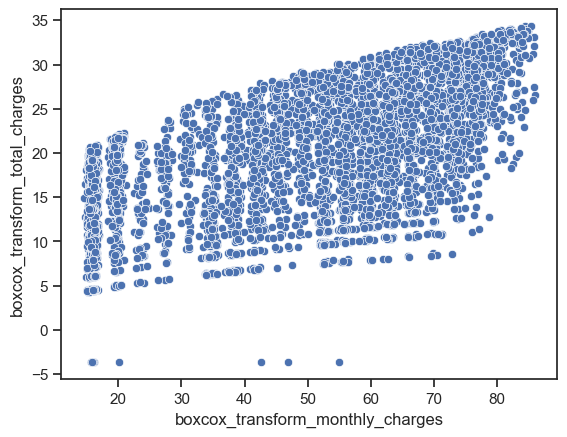

In [44]:
sns.scatterplot(data=X , x='boxcox_transform_monthly_charges',y='boxcox_transform_total_charges')

In [45]:
X

,boxcox_transform_monthly_charges,boxcox_transform_total_charges
6212,38.859371,16.829698
5401,16.268956,15.812856
313,52.104421,13.070939
2638,76.724117,29.854450
1870,35.089150,6.335431
...,...,...
1969,40.911952,25.574034
3047,62.428727,16.494394
6937,27.881909,18.176849
1971,15.410748,13.626165


In [46]:
eps = 3.3 # радиус окрестности точки  
min_samples = 210 # минимальное количество точек в окрестности  
dbscan2 = DBSCAN(eps=eps, min_samples=min_samples)  

dbscan2.fit(X)  
labels = dbscan2.labels_  

print(labels)
X['cl2'] = labels

[-1  0 -1 ... -1  0 -1]


<AxesSubplot:xlabel='boxcox_transform_monthly_charges', ylabel='boxcox_transform_total_charges'>

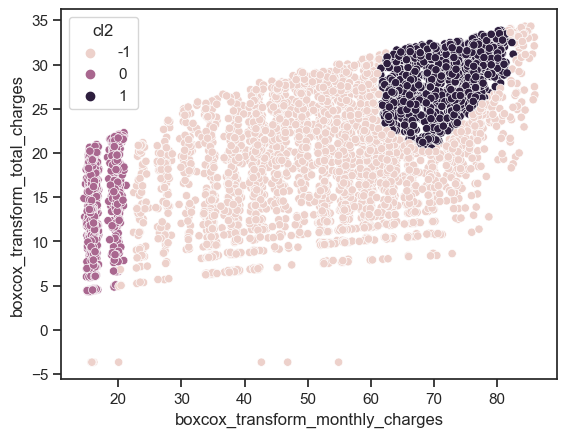

In [47]:
sns.scatterplot(data=X, x='boxcox_transform_monthly_charges',y='boxcox_transform_total_charges', hue='cl2')

In [48]:
X.loc[X[X['boxcox_transform_total_charges'] < 0].index.to_list(), 'cl2'] = 2

In [49]:
X['cl3'] = -1

In [50]:
limit1 = X[X['cl2'] == 0]['boxcox_transform_monthly_charges'].max()

mask1 = (X['boxcox_transform_monthly_charges'] < limit1) & (X['boxcox_transform_total_charges'] > 0)  
X.loc[mask1, 'cl3'] = 0 

mask2 = X['boxcox_transform_total_charges'] < 0  
X.loc[mask2, 'cl3'] = 2  

cen_y = X[X['cl2']==1]['boxcox_transform_total_charges'].mean()
cen_x = X[X['cl2']==1]['boxcox_transform_monthly_charges'].mean()
center = np.array([cen_x, cen_y])
radius = 8.5                   

mask3 = np.linalg.norm(X[['boxcox_transform_monthly_charges', 'boxcox_transform_total_charges']] - center, axis=1) <= radius  
X.loc[mask3, 'cl3'] = 1 

X['cl3'].value_counts()

-1    3006
 0    1199
 1    1069
 2       8
Name: cl3, dtype: int64

<AxesSubplot:xlabel='boxcox_transform_monthly_charges', ylabel='boxcox_transform_total_charges'>

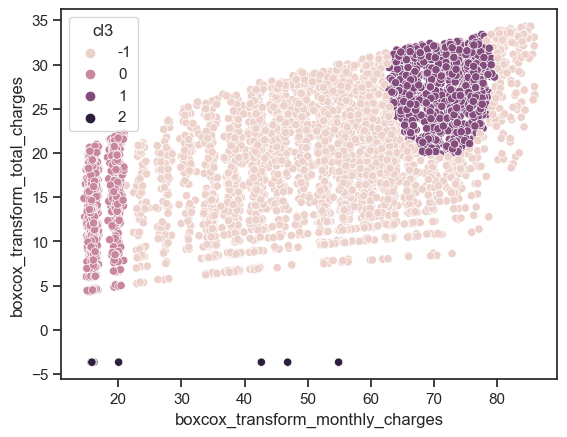

In [51]:
sns.scatterplot(data=X, x='boxcox_transform_monthly_charges',y='boxcox_transform_total_charges', hue='cl3')

In [52]:
df['cl'] = X['cl3']

------------

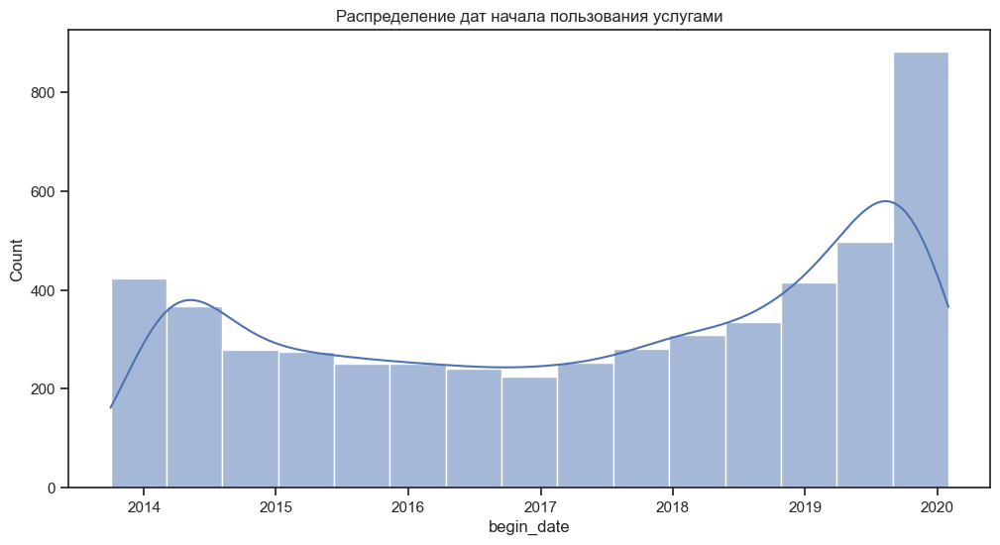

In [53]:
plt.figure(figsize=(12, 6))
sns.histplot(data=df, x='begin_date', bins='auto', kde=True)
plt.xlabel('begin_date')
plt.ylabel('Count')
plt.title('Распределение дат начала пользования услугами')
plt.show()

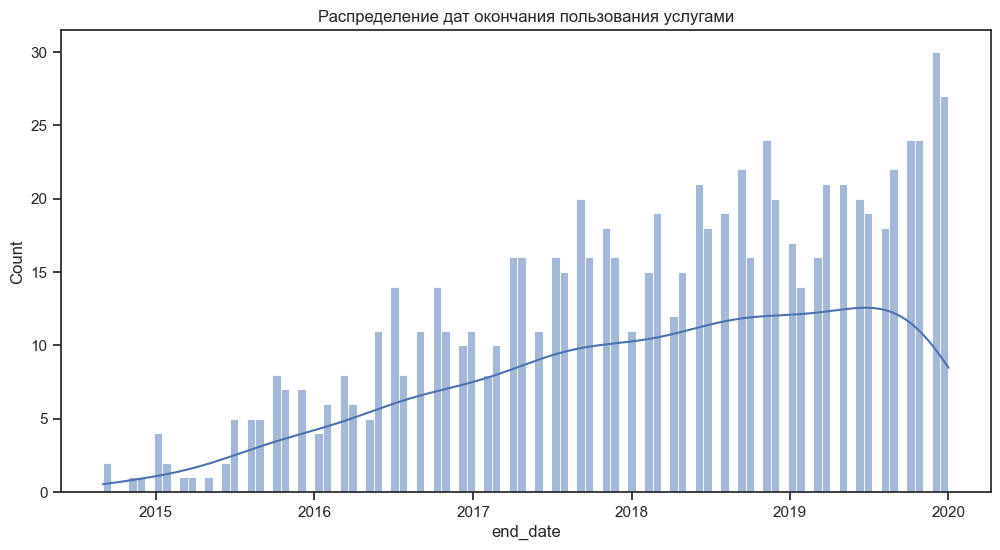

In [54]:
plt.figure(figsize=(12, 6))
sns.histplot(data=df, x='end_date', bins=100,  kde=True)
plt.xlabel('end_date')
plt.ylabel('Count')
plt.title('Распределение дат окончания пользования услугами')
plt.show()

<link rel="preconnect" href="https://fonts.googleapis.com">
<link rel="preconnect" href="https://fonts.gstatic.com" crossorigin>
<link href="https://fonts.googleapis.com/css2?family=Open+Sans:wght@300&display=swap" rel="stylesheet">
<div style="background-color: #cce5ff; padding: 20px; border: 1px solid #cccccc; border-radius: 10px; box-shadow: 2px 2px 5px #999999;">
    <img src="https://4.downloader.disk.yandex.ru/preview/e94d77672c67e773ce389ba975ff6f93dfa85e6bf38330994ddb167e45d43b2e/inf/FVaRiax1bkEIrSJD3W5o0vltYGLJsoGOy3uYGIvEWK3S0BJTW8uUuR5gEFPx-2OkS79cs8UznKovmnI6Pdz2hw%3D%3D?uid=839951300&filename=icons8-редактировать-20.png&disposition=inline&hash=&limit=0&content_type=image%2Fpng&owner_uid=839951300&tknv=v2&size=1344x964" style="float: left; margin-right: 8px; margin-top: 0;">
    <span style="font-family: 'Open Sans', sans-serif; font-size: 17px;">
        <strong>Заметка</strong>
    </span>
    <br>
    <span style="font-family: 'Open Sans', sans-serif; font-size: 14px;">
        <p>
            <li>до 2017 года был небольшой спад на подклюбчение услуг, полсе начался рост </li>
            <li>кол-во людей прекративгих пользование услугами всегда плавно росло, но это и логично, так как все больше люжей подключалось</li>
            <li></li>
        </p>
    </span>
</div>


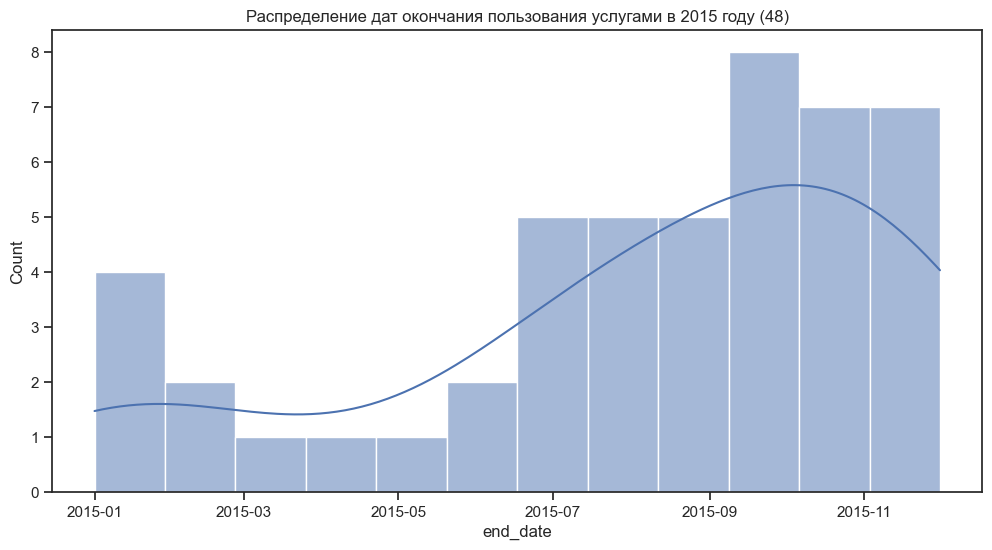

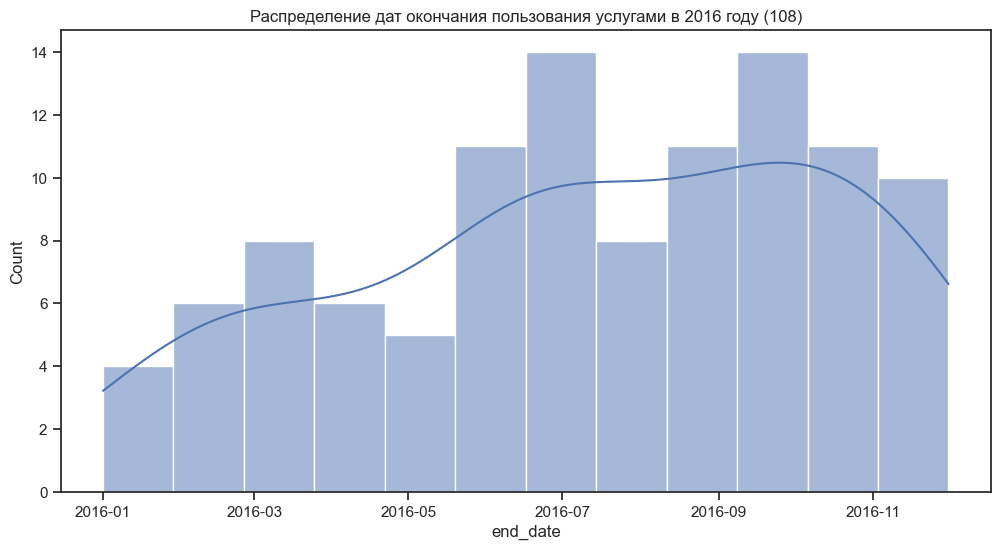

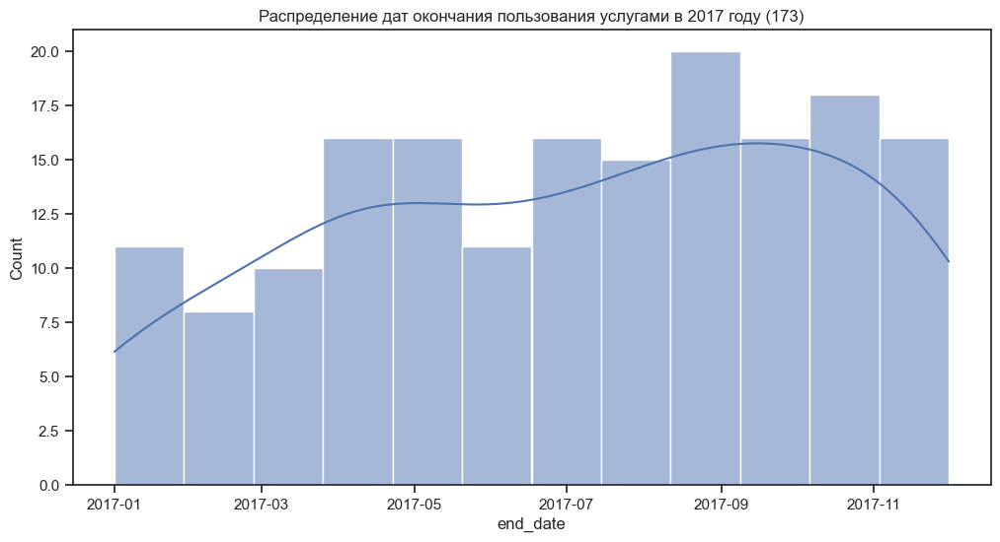

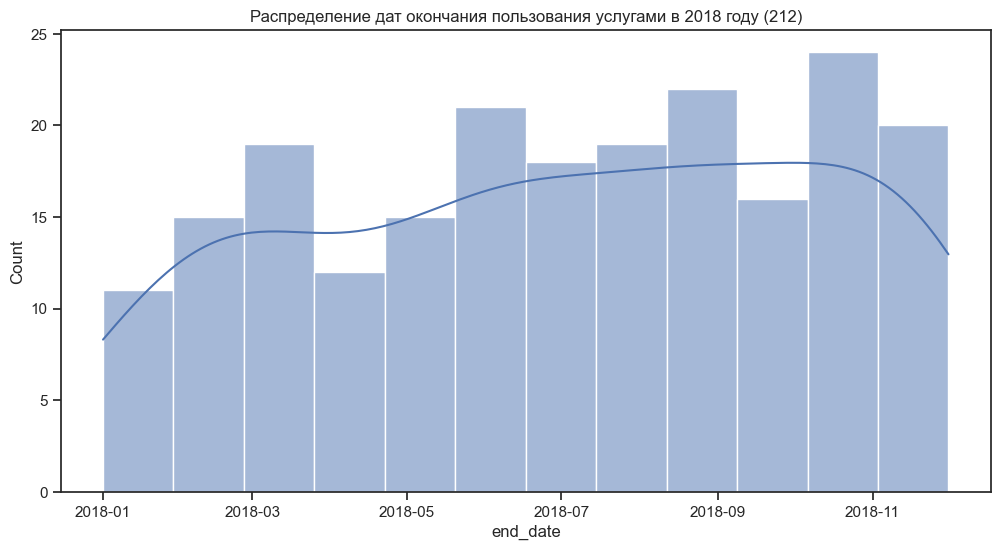

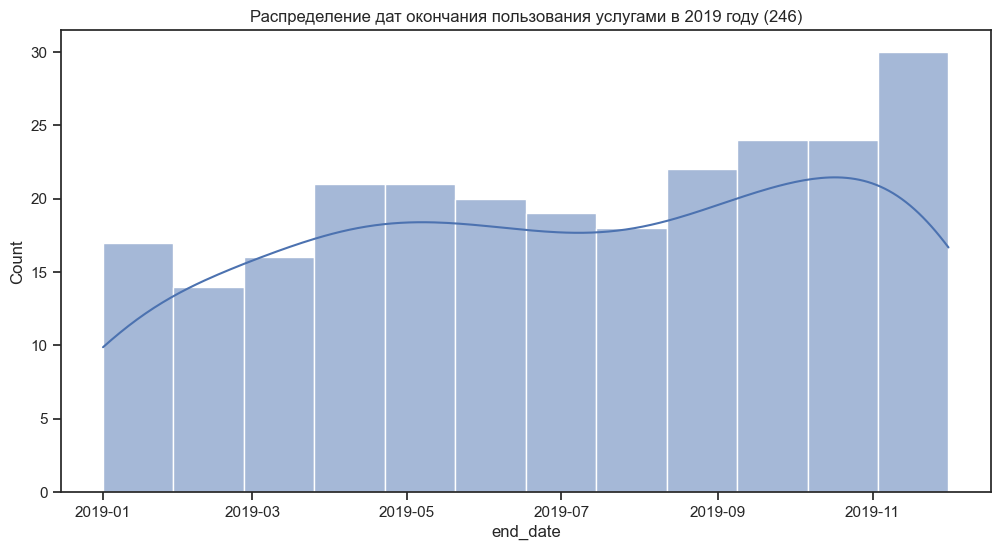

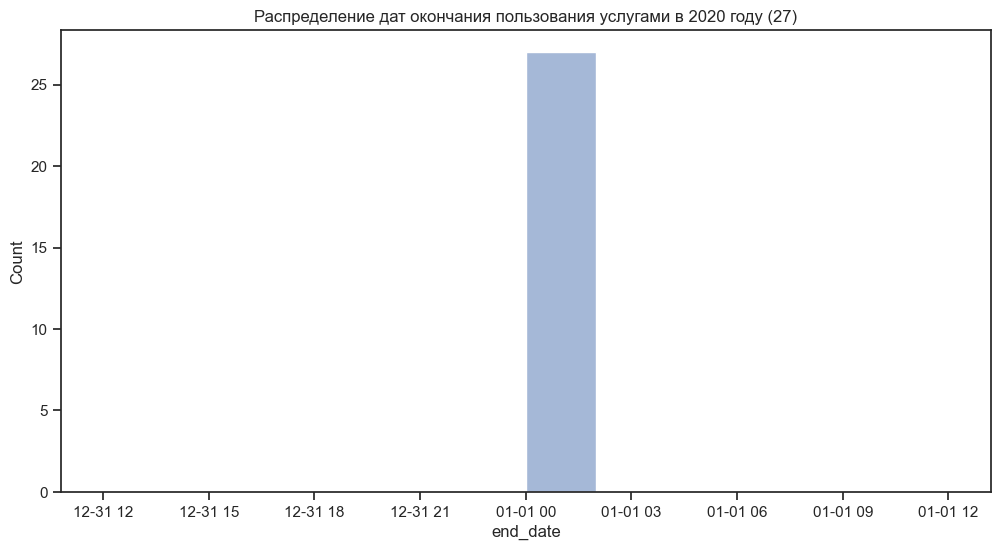

In [55]:
for year in range(2015, 2021, 1):
    plt.figure(figsize=(12, 6))  
    sns.histplot(data=df[df['end_date'].dt.year == year], x='end_date', bins=12, kde=True)  
    plt.xlabel('end_date')  
    plt.ylabel('Count')  
    plt.title(f"Распределение дат окончания пользования услугами в {year} году ({df[df['end_date'].dt.year == year]['customer_id'].count()})")
    plt.show()

<link rel="preconnect" href="https://fonts.googleapis.com">
<link rel="preconnect" href="https://fonts.gstatic.com" crossorigin>
<link href="https://fonts.googleapis.com/css2?family=Open+Sans:wght@300&display=swap" rel="stylesheet">
<div style="background-color: #cce5ff; padding: 20px; border: 1px solid #cccccc; border-radius: 10px; box-shadow: 2px 2px 5px #999999;">
    <img src="https://4.downloader.disk.yandex.ru/preview/e94d77672c67e773ce389ba975ff6f93dfa85e6bf38330994ddb167e45d43b2e/inf/FVaRiax1bkEIrSJD3W5o0vltYGLJsoGOy3uYGIvEWK3S0BJTW8uUuR5gEFPx-2OkS79cs8UznKovmnI6Pdz2hw%3D%3D?uid=839951300&filename=icons8-редактировать-20.png&disposition=inline&hash=&limit=0&content_type=image%2Fpng&owner_uid=839951300&tknv=v2&size=1344x964" style="float: left; margin-right: 8px; margin-top: 0;">
    <span style="font-family: 'Open Sans', sans-serif; font-size: 17px;">
        <strong>Заметка</strong>
    </span>
    <br>
    <span style="font-family: 'Open Sans', sans-serif; font-size: 14px;">
        <p>
            Каких-то анамальных уходов не выявлено
        </p>
    </span>
</div>


In [56]:
df.head()


,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,gender,senior_citizen,...,matching_rows11,duration,log_transform_monthly_charges,log_transform_total_charges,boxcox_transform_monthly_charges,boxcox_transform_total_charges,div,div12,div_all,cl
6212,6537-OTKMY,2018-11-01,NaT,One year,0,Electronic check,50.75,776.48,Male,0,...,1,457,3.926912,6.654771,38.859371,16.829698,15.300099,1.275008,1.004383,-1
5401,5124-EOGYE,2017-07-01,NaT,Two year,0,Mailed check,20.45,633.95,Male,0,...,0,945,3.017983,6.451970,16.268956,15.812856,31.000000,2.583333,0.984127,0
313,2799-ARNLO,2019-09-01,NaT,Month-to-month,1,Electronic check,69.35,346.75,Female,1,...,1,153,4.239166,5.848604,52.104421,13.070939,5.000000,0.416667,0.980392,-1
2638,6769-DCQLI,2015-09-01,NaT,One year,1,Bank transfer (automatic),105.00,5565.00,Male,0,...,1,1614,4.653960,8.624252,76.724117,29.854450,53.000000,4.416667,0.985130,1
1870,3566-HJGPK,2020-01-01,NaT,Month-to-month,1,Mailed check,45.55,45.55,Male,0,...,1,31,3.818811,3.818811,35.089150,6.335431,1.000000,0.083333,0.967742,-1


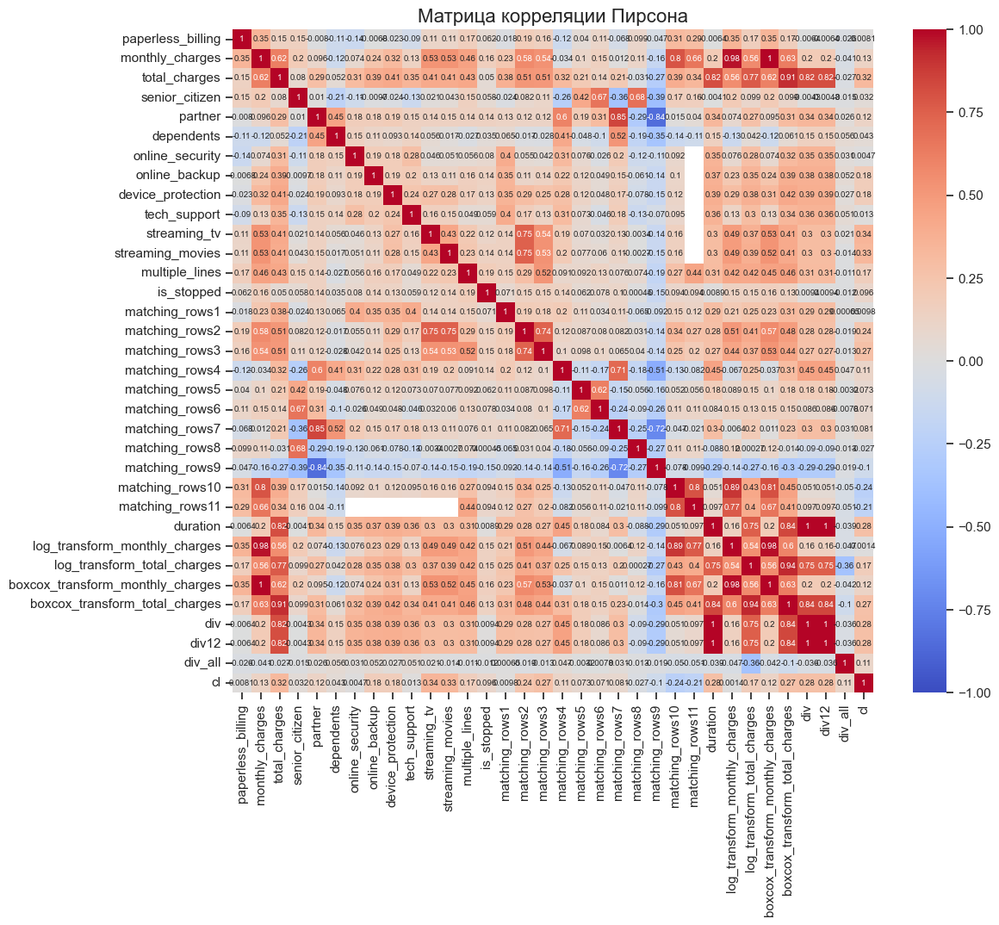

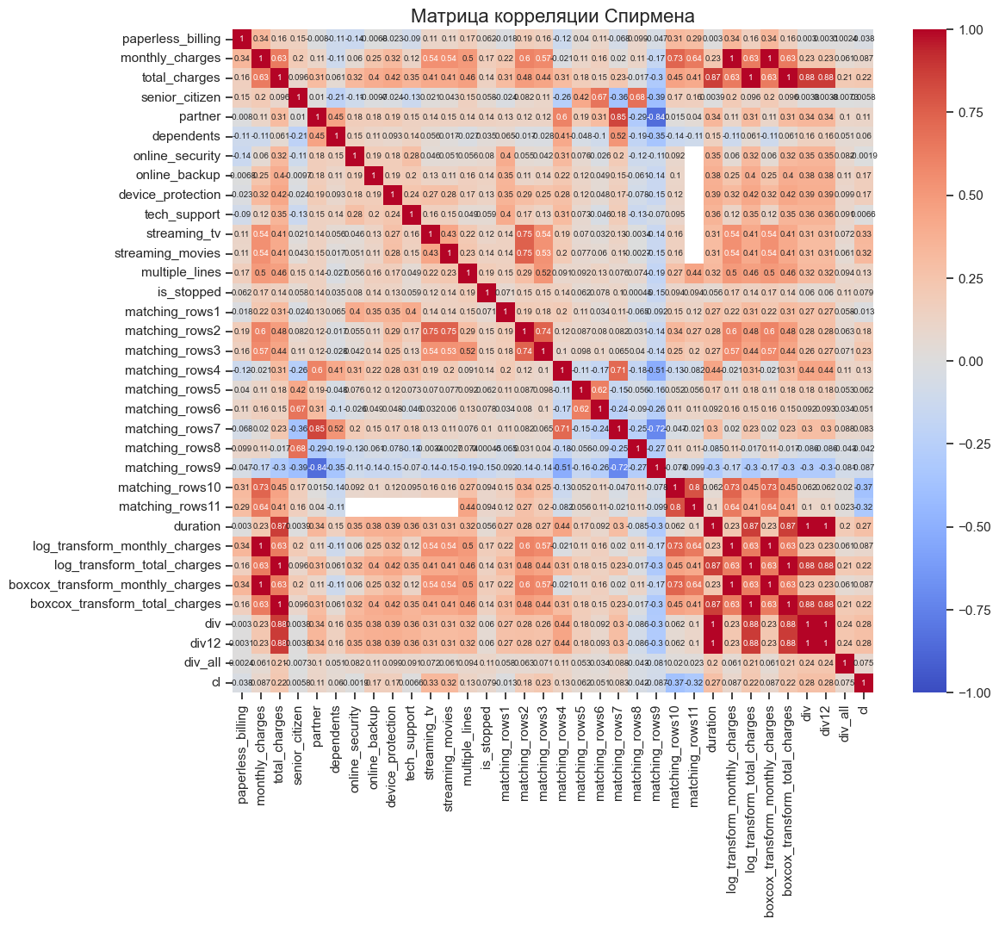

In [57]:
# Вычисляем матрицу корреляции Пирсона  
corr_pearson =df.drop(['begin_date','end_date','customer_id', 'payment_method', 'gender'], axis=1).corr(method='pearson')  
  
# Вычисляем матрицу корреляции Спирмена  
corr_spearman = df.drop(['begin_date','end_date','customer_id', 'payment_method', 'gender'], axis=1).corr(method='spearman')  
  
 
plt.figure(figsize=(12, 10))  
sns.heatmap(corr_pearson, annot=True, cmap='coolwarm', vmin=-1, vmax=1,annot_kws={"fontsize": 7})  
plt.title("Матрица корреляции Пирсона", fontsize=16)  
plt.show()  
  
 
plt.figure(figsize=(12, 10))  
sns.heatmap(corr_spearman, annot=True, cmap='coolwarm', vmin=-1, vmax=1,annot_kws={"fontsize": 7})  
plt.title("Матрица корреляции Спирмена", fontsize=16)  
plt.show() 

interval columns not set, guessing: ['paperless_billing', 'monthly_charges', 'total_charges', 'senior_citizen', 'partner', 'dependents', 'online_security', 'online_backup', 'device_protection', 'tech_support', 'streaming_tv', 'streaming_movies', 'multiple_lines', 'is_stopped', 'matching_rows1', 'matching_rows2', 'matching_rows3', 'matching_rows4', 'matching_rows5', 'matching_rows6', 'matching_rows7', 'matching_rows8', 'matching_rows9', 'matching_rows10', 'matching_rows11', 'duration', 'log_transform_monthly_charges', 'log_transform_total_charges', 'boxcox_transform_monthly_charges', 'boxcox_transform_total_charges', 'div', 'div12', 'div_all', 'cl']


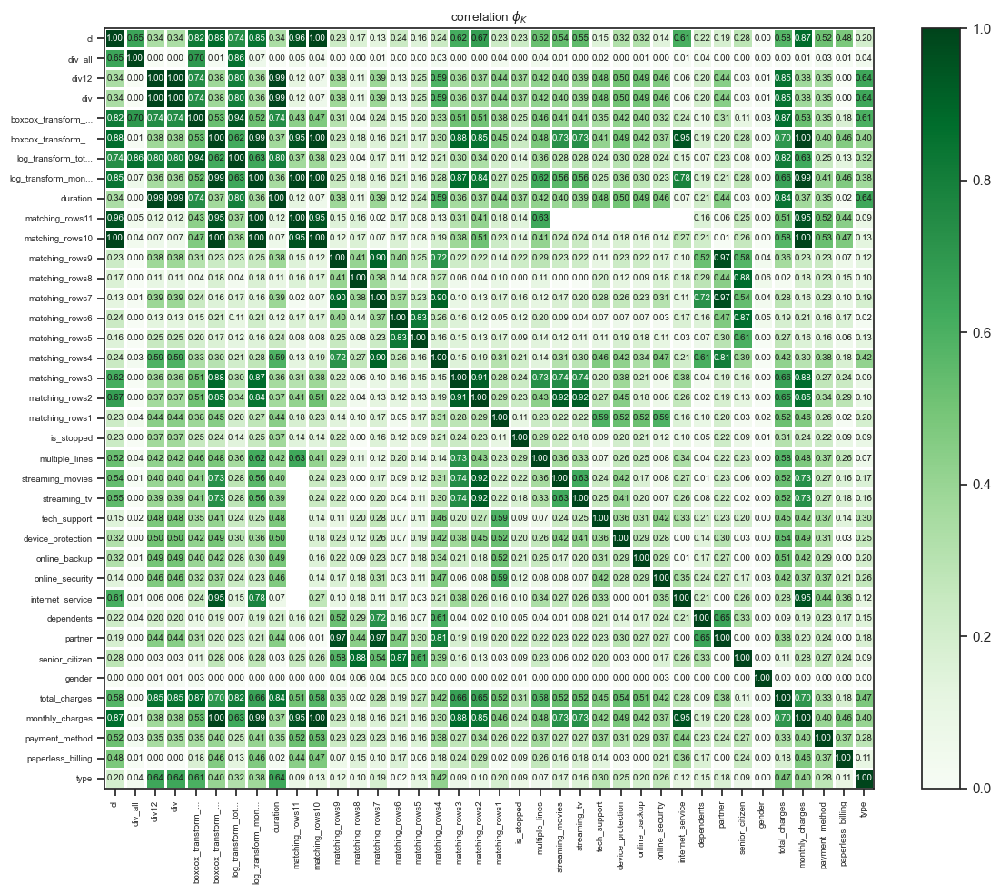

In [58]:
phik_overview = df.drop(['begin_date','end_date','customer_id'], axis=1).phik_matrix()

plot_correlation_matrix(phik_overview.values, 
                        x_labels=phik_overview.columns, 
                        y_labels=phik_overview.index, 
                        vmin=0, vmax=1, color_map="Greens", 
                        title=r"correlation $\phi_K$", 
                        fontsize_factor=0.7, 
                        figsize=(12, 10))
plt.tight_layout()

In [59]:
df.head()

,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,gender,senior_citizen,...,matching_rows11,duration,log_transform_monthly_charges,log_transform_total_charges,boxcox_transform_monthly_charges,boxcox_transform_total_charges,div,div12,div_all,cl
6212,6537-OTKMY,2018-11-01,NaT,One year,0,Electronic check,50.75,776.48,Male,0,...,1,457,3.926912,6.654771,38.859371,16.829698,15.300099,1.275008,1.004383,-1
5401,5124-EOGYE,2017-07-01,NaT,Two year,0,Mailed check,20.45,633.95,Male,0,...,0,945,3.017983,6.451970,16.268956,15.812856,31.000000,2.583333,0.984127,0
313,2799-ARNLO,2019-09-01,NaT,Month-to-month,1,Electronic check,69.35,346.75,Female,1,...,1,153,4.239166,5.848604,52.104421,13.070939,5.000000,0.416667,0.980392,-1
2638,6769-DCQLI,2015-09-01,NaT,One year,1,Bank transfer (automatic),105.00,5565.00,Male,0,...,1,1614,4.653960,8.624252,76.724117,29.854450,53.000000,4.416667,0.985130,1
1870,3566-HJGPK,2020-01-01,NaT,Month-to-month,1,Mailed check,45.55,45.55,Male,0,...,1,31,3.818811,3.818811,35.089150,6.335431,1.000000,0.083333,0.967742,-1


In [60]:
df.isna().sum()

customer_id                            0
begin_date                             0
end_date                            4464
type                                   0
paperless_billing                      0
payment_method                         0
monthly_charges                        0
total_charges                          0
gender                                 0
senior_citizen                         0
partner                                0
dependents                             0
internet_service                    1139
online_security                     1139
online_backup                       1139
device_protection                   1139
tech_support                        1139
streaming_tv                        1139
streaming_movies                    1139
multiple_lines                       522
is_stopped                             0
matching_rows1                         0
matching_rows2                         0
matching_rows3                         0
matching_rows4  

### Feature selection

In [61]:
df = df.drop(['div12', 'gender', 'matching_rows7','customer_id','begin_date', 'end_date'], axis=1)

cat_features_obj = ['type', 'payment_method','internet_service']
num_features = ['monthly_charges','total_charges',
                'div','div_all',
                'log_transform_monthly_charges','log_transform_total_charges',
                'boxcox_transform_monthly_charges','boxcox_transform_total_charges',
                'duration']
target = 'is_stopped'
cat_features_encoded_nan = [                  
                            'online_security',                     
                            'online_backup',                       
                            'device_protection',                  
                            'tech_support',                       
                            'streaming_tv',                      
                            'streaming_movies',                    
                            'multiple_lines', 'cl']                      
cat_features_encoded = df.drop(cat_features_obj + num_features + cat_features_encoded_nan+[target], axis=1).columns.to_list()

In [62]:
df[cat_features_encoded_nan]

,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines,cl
6212,0.0,0.0,1.0,0.0,1.0,1.0,NaN,-1
5401,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0
313,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1
2638,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1
1870,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1
...,...,...,...,...,...,...,...,...
1969,1.0,0.0,1.0,0.0,1.0,1.0,NaN,-1
3047,0.0,1.0,0.0,0.0,0.0,1.0,0.0,-1
6937,0.0,0.0,1.0,1.0,0.0,0.0,NaN,-1
1971,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0


In [63]:
df[cat_features_obj].head()

,type,payment_method,internet_service
6212,One year,Electronic check,DSL
5401,Two year,Mailed check,NaN
313,Month-to-month,Electronic check,Fiber optic
2638,One year,Bank transfer (automatic),Fiber optic
1870,Month-to-month,Mailed check,DSL


In [64]:
df[num_features].head()

,monthly_charges,total_charges,div,div_all,log_transform_monthly_charges,log_transform_total_charges,boxcox_transform_monthly_charges,boxcox_transform_total_charges,duration
6212,50.75,776.48,15.300099,1.004383,3.926912,6.654771,38.859371,16.829698,457
5401,20.45,633.95,31.000000,0.984127,3.017983,6.451970,16.268956,15.812856,945
313,69.35,346.75,5.000000,0.980392,4.239166,5.848604,52.104421,13.070939,153
2638,105.00,5565.00,53.000000,0.985130,4.653960,8.624252,76.724117,29.854450,1614
1870,45.55,45.55,1.000000,0.967742,3.818811,3.818811,35.089150,6.335431,31


In [65]:
df[cat_features_encoded].head()

,paperless_billing,senior_citizen,partner,dependents,matching_rows1,matching_rows2,matching_rows3,matching_rows4,matching_rows5,matching_rows6,matching_rows8,matching_rows9,matching_rows10,matching_rows11
6212,0,0,0,0,0,1,0,0,0,0,0,1,1,1
5401,0,0,0,0,0,0,0,0,0,0,0,1,0,0
313,1,1,1,0,0,0,0,0,0,1,0,0,1,1
2638,1,0,0,0,0,1,0,0,0,0,0,1,1,1
1870,1,0,0,0,0,0,0,0,0,0,0,1,1,1


interval columns not set, guessing: ['paperless_billing', 'monthly_charges', 'total_charges', 'senior_citizen', 'partner', 'dependents', 'online_security', 'online_backup', 'device_protection', 'tech_support', 'streaming_tv', 'streaming_movies', 'multiple_lines', 'is_stopped', 'matching_rows1', 'matching_rows2', 'matching_rows3', 'matching_rows4', 'matching_rows5', 'matching_rows6', 'matching_rows8', 'matching_rows9', 'matching_rows10', 'matching_rows11', 'duration', 'log_transform_monthly_charges', 'log_transform_total_charges', 'boxcox_transform_monthly_charges', 'boxcox_transform_total_charges', 'div', 'div_all', 'cl']


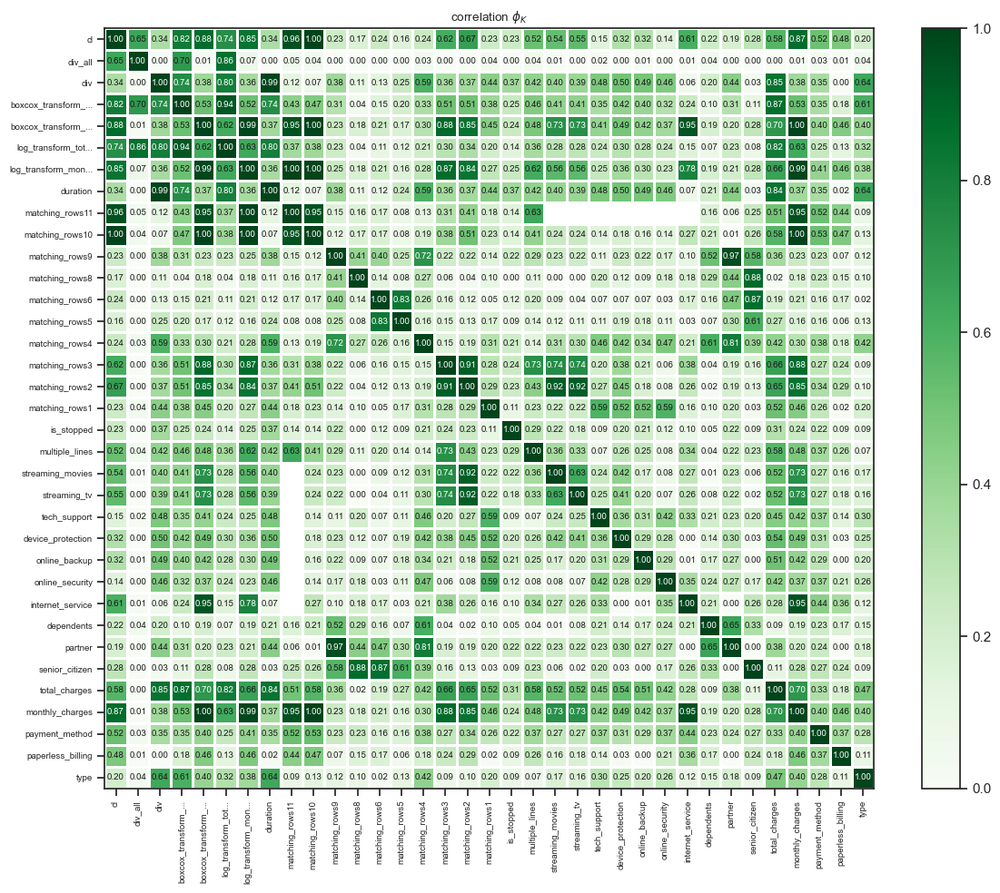

In [66]:
phik_overview = df.phik_matrix()
plot_correlation_matrix(phik_overview.values, 
                        x_labels=phik_overview.columns, 
                        y_labels=phik_overview.index, 
                        vmin=0, vmax=1, color_map="Greens", 
                        title=r"correlation $\phi_K$", 
                        fontsize_factor=0.7, 
                        figsize=(12, 10))
plt.tight_layout()

<link rel="preconnect" href="https://fonts.googleapis.com">
<link rel="preconnect" href="https://fonts.gstatic.com" crossorigin>
<link href="https://fonts.googleapis.com/css2?family=Open+Sans:wght@300&display=swap" rel="stylesheet">
<div style="background-color: #cce5ff; padding: 20px; border: 1px solid #cccccc; border-radius: 10px; box-shadow: 2px 2px 5px #999999;">
    <img src="https://4.downloader.disk.yandex.ru/preview/e94d77672c67e773ce389ba975ff6f93dfa85e6bf38330994ddb167e45d43b2e/inf/FVaRiax1bkEIrSJD3W5o0vltYGLJsoGOy3uYGIvEWK3S0BJTW8uUuR5gEFPx-2OkS79cs8UznKovmnI6Pdz2hw%3D%3D?uid=839951300&filename=icons8-редактировать-20.png&disposition=inline&hash=&limit=0&content_type=image%2Fpng&owner_uid=839951300&tknv=v2&size=1344x964" style="float: left; margin-right: 8px; margin-top: 0;">
    <span style="font-family: 'Open Sans', sans-serif; font-size: 17px;">
        <strong>Заметка</strong>
    </span>
    <br>
    <span style="font-family: 'Open Sans', sans-serif; font-size: 14px;">
        <p>
            Были убраны признаки которые имели сильную корреляцию и одновременно не показали какой-то способности обобщить данные. Так же убран пол так как на предыдущем этапе было видно, что он не несет информативности. Убран ID (не несет информативности и при плохой генерации может выдать лик). Убраны даты так как вместе с признаком могут дать лик (конечная дата в люом случае его даст)        </p>
    </span>
</div>


## Модельки

In [67]:
df_train, df_test = train_test_split(df, stratify=df['is_stopped'],test_size=0.1, random_state=300623)

In [68]:
df_train.head()

,type,paperless_billing,payment_method,monthly_charges,total_charges,senior_citizen,partner,dependents,internet_service,online_security,...,matching_rows10,matching_rows11,duration,log_transform_monthly_charges,log_transform_total_charges,boxcox_transform_monthly_charges,boxcox_transform_total_charges,div,div_all,cl
5323,One year,1,Credit card (automatic),105.20,6345.66,0,1,1,Fiber optic,0.0,...,1,1,1767,4.655863,8.755526,76.860022,30.967706,60.319962,1.024108,1
1969,Two year,0,Electronic check,53.60,3216.00,0,0,0,DSL,1.0,...,1,1,1826,3.981549,8.075894,40.911952,25.574034,60.000000,0.985761,-1
523,Month-to-month,0,Bank transfer (automatic),75.60,2041.20,0,0,0,Fiber optic,0.0,...,1,1,822,4.325456,7.621293,56.484647,22.438063,27.000000,0.985401,-1
1601,One year,1,Electronic check,94.65,4615.13,0,1,0,Fiber optic,0.0,...,1,1,1401,4.550186,8.437095,69.660600,28.328181,48.759958,1.044110,1
3412,Two year,0,Mailed check,59.50,121.38,0,1,1,DSL,1.0,...,1,1,62,4.085976,4.798926,45.132976,9.171213,2.040000,0.987097,-1


In [69]:
def dummy_transform(X):   
    return X  
  

dummy_transformer = FunctionTransformer(dummy_transform) 

In [70]:
scaler = StandardScaler()
OE = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value = -1,encoded_missing_value=-1)
OHE = OneHotEncoder(drop='first',handle_unknown='ignore')

num_pipeline = make_imblearn_pipeline(scaler)
num_pipeline2 = make_imblearn_pipeline()



column_transformer = make_column_transformer((scaler, num_features),
                                             (OHE, cat_features_obj),
                                             (dummy_transformer, cat_features_encoded), (OHE,cat_features_encoded_nan))
column_transformer

ColumnTransformer(transformers=[('standardscaler', StandardScaler(),
                                 ['monthly_charges', 'total_charges', 'div',
                                  'div_all', 'log_transform_monthly_charges',
                                  'log_transform_total_charges',
                                  'boxcox_transform_monthly_charges',
                                  'boxcox_transform_total_charges',
                                  'duration']),
                                ('onehotencoder-1',
                                 OneHotEncoder(drop='first',
                                               handle_unknown='ignore'),
                                 ['type', 'payment_m...
                                  'matching_rows2', 'matching_rows3',
                                  'matching_rows4', 'matching_rows5',
                                  'matching_rows6', 'matching_rows8',
                                  'matching_rows9', 'matching_rows10',
                                  'matching_rows11']),
                                ('onehotencoder-2',
                                 OneHotEncoder(drop='first',
                                               handle_unknown='ignore'),
                                 ['online_security', 'online_backup',
                                  'device_protection', 'tech_support',
                                  'streaming_tv', 'streaming_movies',
                                  'multiple_lines', 'cl'])])

In [71]:
pipeline_lr = make_imblearn_pipeline(column_transformer,
                         LogisticRegression(random_state=300623)) 
pipeline_lr

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('standardscaler',
                                                  StandardScaler(),
                                                  ['monthly_charges',
                                                   'total_charges', 'div',
                                                   'div_all',
                                                   'log_transform_monthly_charges',
                                                   'log_transform_total_charges',
                                                   'boxcox_transform_monthly_charges',
                                                   'boxcox_transform_total_charges',
                                                   'duration']),
                                                 ('onehotencoder-1',
                                                  OneHotEncoder(drop='first',
                                                                handle...
                                                   'matching_rows6',
                                                   'matching_rows8',
                                                   'matching_rows9',
                                                   'matching_rows10',
                                                   'matching_rows11']),
                                                 ('onehotencoder-2',
                                                  OneHotEncoder(drop='first',
                                                                handle_unknown='ignore'),
                                                  ['online_security',
                                                   'online_backup',
                                                   'device_protection',
                                                   'tech_support',
                                                   'streaming_tv',
                                                   'streaming_movies',
                                                   'multiple_lines', 'cl'])])),
                ('logisticregression',
                 LogisticRegression(random_state=300623))])

### LR

In [72]:
%%time
param_grid = {  
    'logisticregression__penalty': ['l2'],  
    'logisticregression__C': [0.1, 1, 10, 15, 30],  
    'logisticregression__fit_intercept': [True, False],  
    'logisticregression__solver': ['liblinear', 'saga', 'newton-cg', 'lbfgs'],  
    'logisticregression__max_iter': [100, 500, 550,600,700]
}  

clf_lr = BayesSearchCV(pipeline_lr, param_grid, n_iter=50,
optimizer_kwargs={"base_estimator":"GP",
                    "n_initial_points":10,
                    "initial_point_generator":"random",
                    "acq_func":"EI",
                    "acq_optimizer":"auto",
                    "n_jobs":-1,
                    "random_state":300623,
                    "acq_func_kwargs": {"xi":0.01}
                    },
random_state = 300623,
scoring = 'roc_auc', cv=5,
n_jobs=-1, refit = True)
clf_lr.fit(df_train[cat_features_obj+cat_features_encoded +num_features + cat_features_encoded_nan],df_train[target])
best_params_lr = clf_lr.best_params_  
best_score_lr = clf_lr.best_score_ 
print("Best Parameters:", best_params_lr) 
print("Best Score:", best_score_lr) 

The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Best Parameters: OrderedDict([('logisticregression__C', 10.0), ('logisticregression__fit_intercept', True), ('logisticregression__max_iter', 700), ('logisticregression__penalty', 'l2'), ('logisticregression__solver', 'lbfgs')])
Best Score: 0.8185898211616003
Wall time: 1min 47s


### RF 

In [73]:
column_transformer = make_column_transformer((scaler, num_features),
                                             (dummy_transformer, cat_features_encoded), 
                                             (OE,cat_features_encoded_nan + cat_features_obj))
column_transformer

ColumnTransformer(transformers=[('standardscaler', StandardScaler(),
                                 ['monthly_charges', 'total_charges', 'div',
                                  'div_all', 'log_transform_monthly_charges',
                                  'log_transform_total_charges',
                                  'boxcox_transform_monthly_charges',
                                  'boxcox_transform_total_charges',
                                  'duration']),
                                ('functiontransformer',
                                 FunctionTransformer(func=<function dummy_transform at 0x000001F0E9241...
                                  'matching_rows6', 'matching_rows8',
                                  'matching_rows9', 'matching_rows10',
                                  'matching_rows11']),
                                ('ordinalencoder',
                                 OrdinalEncoder(encoded_missing_value=-1,
                                                handle_unknown='use_encoded_value',
                                                unknown_value=-1),
                                 ['online_security', 'online_backup',
                                  'device_protection', 'tech_support',
                                  'streaming_tv', 'streaming_movies',
                                  'multiple_lines', 'cl', 'type',
                                  'payment_method', 'internet_service'])])

In [74]:
cat_features_encoded_nan + cat_features_obj

['online_security',
 'online_backup',
 'device_protection',
 'tech_support',
 'streaming_tv',
 'streaming_movies',
 'multiple_lines',
 'cl',
 'type',
 'payment_method',
 'internet_service']

In [75]:
cat_features_encoded_nan + cat_features_obj

['online_security',
 'online_backup',
 'device_protection',
 'tech_support',
 'streaming_tv',
 'streaming_movies',
 'multiple_lines',
 'cl',
 'type',
 'payment_method',
 'internet_service']

In [76]:
#pipeline_rf = make_imblearn_pipeline(column_transformer,
#                         RandomForestClassifier(random_state=300623,n_jobs=-1)) 
#pipeline_rf

In [77]:
'''
param_grid = {  
    'randomforestclassifier__n_estimators': [100, 300, 500, 800],  
    'randomforestclassifier__max_depth': [None, 10, 20, 25],  
    'randomforestclassifier__min_samples_split': [2, 5, 10, 20],  
    'randomforestclassifier__min_samples_leaf': [1, 2, 4, 8], 
    'randomforestclassifier__criterion': ['gini', 'log_loss']
}  
'''

"\nparam_grid = {  \n    'randomforestclassifier__n_estimators': [100, 300, 500, 800],  \n    'randomforestclassifier__max_depth': [None, 10, 20, 25],  \n    'randomforestclassifier__min_samples_split': [2, 5, 10, 20],  \n    'randomforestclassifier__min_samples_leaf': [1, 2, 4, 8], \n    'randomforestclassifier__criterion': ['gini', 'log_loss']\n}  \n"

In [78]:
'''%%time
clf_rf = BayesSearchCV(pipeline_rf, param_grid, n_iter=50,
        random_state = 300623,
        scoring = 'roc_auc', cv=5,
        n_jobs=-1, refit = True)

clf_rf.fit(df[cat_features_obj+cat_features_encoded+num_features+cat_features_encoded_nan],df[target])

best_params = clf_rf.best_params_  
best_params_rf = clf_rf.best_params_  
best_score_rf = clf_rf.best_score_ 
print("Best Parameters:", best_params_rf) 
print("Best Score:", best_score_rf) '''

'%%time\nclf_rf = BayesSearchCV(pipeline_rf, param_grid, n_iter=50,\n        random_state = 300623,\n        scoring = \'roc_auc\', cv=5,\n        n_jobs=-1, refit = True)\n\nclf_rf.fit(df[cat_features_obj+cat_features_encoded+num_features+cat_features_encoded_nan],df[target])\n\nbest_params = clf_rf.best_params_  \nbest_params_rf = clf_rf.best_params_  \nbest_score_rf = clf_rf.best_score_ \nprint("Best Parameters:", best_params_rf) \nprint("Best Score:", best_score_rf) '

### LGBM 

In [79]:
param_grid = {  
    'lgbmclassifier__learning_rate' : np.arange(0.22, 0.28, 0.002) ,
    'lgbmclassifier__max_depth' : [i for i in range(1,5)],
    'lgbmclassifier__num_leaves' :[17, 18, 16, 15, 14,13,10,20],
    'lgbmclassifier__min_data_in_leaf' :[i for i in range(4,13)],
    'lgbmclassifier__n_estimators' :[i for i in range(430, 800, 10)],
    'lgbmclassifier__min_sum_hessian_in_leaf' :np.arange(0.005, 0.9, 0.015)
}  

pipeline_lgbm = make_imblearn_pipeline(column_transformer,
                         LGBMClassifier(random_state=300623, n_jobs=-1)) 
pipeline_lgbm

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('standardscaler',
                                                  StandardScaler(),
                                                  ['monthly_charges',
                                                   'total_charges', 'div',
                                                   'div_all',
                                                   'log_transform_monthly_charges',
                                                   'log_transform_total_charges',
                                                   'boxcox_transform_monthly_charges',
                                                   'boxcox_transform_total_charges',
                                                   'duration']),
                                                 ('functiontransformer',
                                                  FunctionTransformer(func=<fun...
                                                   'matching_rows11']),
                                                 ('ordinalencoder',
                                                  OrdinalEncoder(encoded_missing_value=-1,
                                                                 handle_unknown='use_encoded_value',
                                                                 unknown_value=-1),
                                                  ['online_security',
                                                   'online_backup',
                                                   'device_protection',
                                                   'tech_support',
                                                   'streaming_tv',
                                                   'streaming_movies',
                                                   'multiple_lines', 'cl',
                                                   'type', 'payment_method',
                                                   'internet_service'])])),
                ('lgbmclassifier', LGBMClassifier(random_state=300623))])

In [80]:
%%time
clf_lgbm = BayesSearchCV(pipeline_lgbm, param_grid, n_iter=50,
    random_state = 300623,
    scoring = 'roc_auc', cv=5,
    n_jobs=-1, refit = True)

clf_lgbm.fit(df_train[cat_features_obj+cat_features_encoded+num_features+cat_features_encoded_nan],df_train[target])

best_params_lgbm = clf_lgbm.best_params_  
best_score_lgbm  = clf_lgbm.best_score_ 
print("Best Parameters:", best_params_lgbm) 
print("Best Score:", best_score_lgbm)

[LightGBM] [Warning] min_data_in_leaf is set=9, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=0.02, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=0.02
Best Parameters: OrderedDict([('lgbmclassifier__learning_rate', 0.252), ('lgbmclassifier__max_depth', 2), ('lgbmclassifier__min_data_in_leaf', 9), ('lgbmclassifier__min_sum_hessian_in_leaf', 0.02), ('lgbmclassifier__n_estimators', 640), ('lgbmclassifier__num_leaves', 18)])
Best Score: 0.9152853278200125
Wall time: 1min 51s


In [81]:
clf_lgbm.score(df_test.drop('is_stopped', axis=1),df_test['is_stopped'])

0.919435805096306

In [210]:
clf_lr.score(df_test.drop('is_stopped', axis=1),df_test['is_stopped'])

0.8047143558683909

In [82]:
import shap
print(f"Version: {shap.__version__}")

Version: 0.41.0


In [83]:
df_test_transformed_columns = df_test.drop('is_stopped', axis=1).columns
df_test_transformed = clf_lgbm.best_estimator_[0].transform(df_test.drop('is_stopped', axis=1))
target_test = df_test['is_stopped']

In [84]:
df_test_transformed_columns = df_test_transformed_columns.to_list()

In [85]:
len(df_test_transformed_columns)

34

In [86]:
df_test_transformed.shape

(529, 34)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


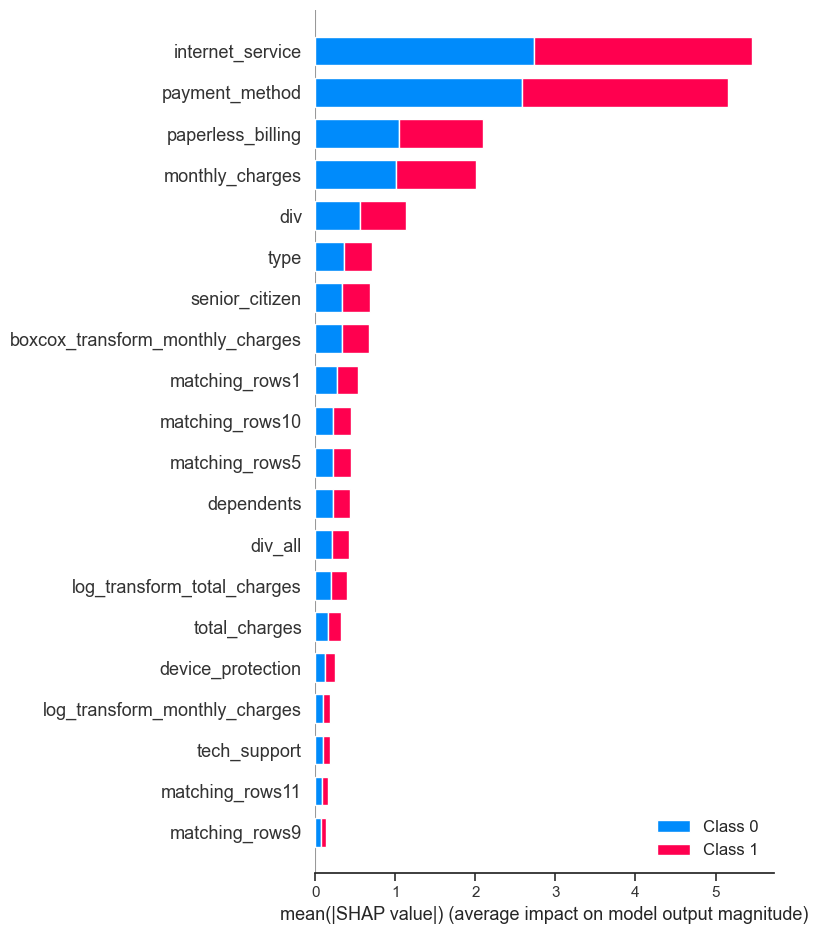

In [87]:
df_test_transformed = pd.DataFrame(df_test_transformed, columns = df_test_transformed_columns)
explainer = shap.TreeExplainer( clf_lgbm.best_estimator_[1])
shap_values = explainer.shap_values(df_test_transformed)
shap.summary_plot(shap_values, df_test_transformed, plot_type='bar')

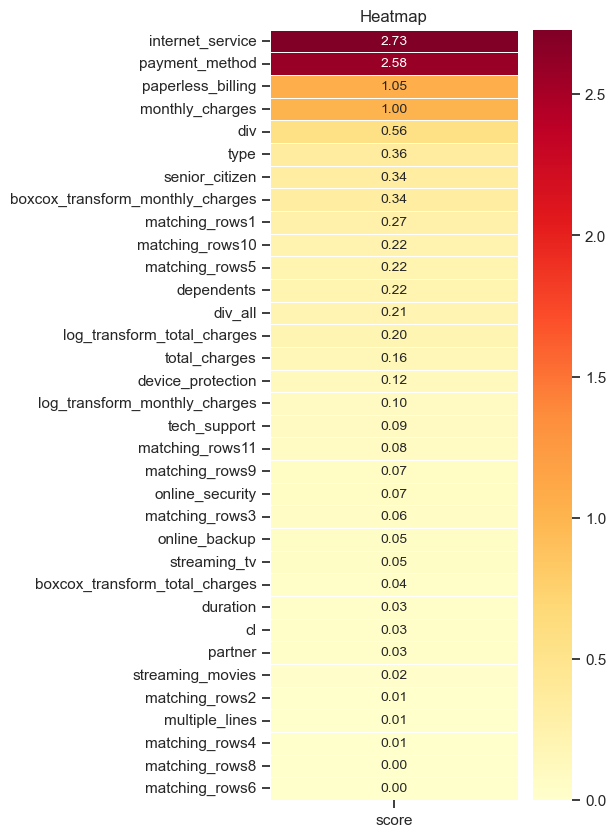

In [88]:
sv = np.abs(shap_values).mean(axis=0).mean(axis=0)  
series = pd.Series(sv, index=df_test_transformed_columns)  
df_heatmap = pd.DataFrame(series.sort_values(ascending=0), columns=['score'])  
  
plt.figure(figsize=(4,10))
sns.heatmap(df_heatmap, cmap='YlOrRd', annot=True, fmt=".2f", cbar=True,  
            linewidths=0.5, annot_kws={"size": 10})  
plt.title('Heatmap')  
plt.show() 

### Add/delete features after shap

In [89]:
cols_to_drop = list(df_heatmap.index[-7:-1]) + ['cl']

In [90]:
cols_to_drop

['partner',
 'streaming_movies',
 'matching_rows2',
 'multiple_lines',
 'matching_rows4',
 'matching_rows8',
 'cl']

In [91]:
df['yeojohnson_transform_monthly_charges'], lmbda_yeojohnson1 = yeojohnson(df['monthly_charges'])
df['yeojohnson_transform_total_charges'],lmbda_yeojohnson2  = yeojohnson(df['total_charges']) 
lmbda_yeojohnson1, lmbda_yeojohnson2

(0.9248553770453155, 0.23741312972245684)

In [92]:
df['yeojohnsonlog_transform_monthly_charges'], lmbda_yeojohnson3 = yeojohnson(df['log_transform_monthly_charges']) 
lmbda_yeojohnson3

5.056333461656507

In [93]:
df['sq_yeojohnsonlog_tr_month_charges'] = np.sqrt(df['yeojohnsonlog_transform_monthly_charges'])

In [94]:
extremum_of_interval_max = int(np.floor(df['monthly_charges'].max() +  df['monthly_charges'].min()/2.))
extremum_of_interval_min = int(np.ceil(df['monthly_charges'].min() -  df['monthly_charges'].min()/2.))

width_interval_equal = int(np.floor((extremum_of_interval_max - extremum_of_interval_min) / 10.))
width_interval_equal

11

In [95]:
disc = EqualWidthDiscretiser(bins=10, variables = ['monthly_charges'],return_object=True)
disc.fit(df[['monthly_charges','total_charges']])
train_t = disc.transform(df[['monthly_charges','total_charges']])
train_t

,monthly_charges,total_charges
6212,3,776.48
5401,0,633.95
313,5,346.75
2638,8,5565.00
1870,2,45.55
...,...,...
1969,3,3216.00
3047,6,727.06
6937,1,1001.00
1971,0,394.74


In [96]:
df['discrete_values_interval_equal'] = train_t['monthly_charges']

In [97]:
df['discrete_values_interval_equal'].value_counts()

0    1205
6     722
7     676
5     645
8     557
3     481
4     359
2     287
9     209
1     141
Name: discrete_values_interval_equal, dtype: int64

In [98]:
df['os_mc_over80'] = 0
df['os_mc_over100'] = 0
df['os_between_60_and_80'] =  0

df['pb_mc_over80'] = 0
df['pb_mc_over100'] = 0
df['pb_between_60_and_80'] = 0

df['pm_mc_over80_bt'] = 0
df['pm_mc_over100_bt'] = 0

df['pm_mc_over80'] = 0


In [99]:
df.loc[(df['online_security'] == 1) & (df['monthly_charges'] > 80), 'os_mc_over80'] = 1
df.loc[(df['online_security'] == 1) & (df['monthly_charges'] >= 100), 'os_mc_over100'] = 1
df.loc[(df['online_security'] == 1) & (df['monthly_charges'] > 60) & (df['monthly_charges'] <= 80), 'os_between_60_and_80'] = 1


df.loc[(df['paperless_billing'] == 1) & (df['monthly_charges'] > 80), 'pb_mc_over80'] = 1
df.loc[(df['paperless_billing'] == 1) & (df['monthly_charges'] >= 100), 'pb_mc_over100'] = 1
df.loc[(df['paperless_billing'] == 1) & (df['monthly_charges'] > 60) & (df['monthly_charges'] <= 80), 'pb_between_60_and_80']=1

df.loc[(df['payment_method'] == 'Bank transfer (automatic)') & (df['monthly_charges'] > 80), 'pm_mc_over80_bt'] = 1
df.loc[(df['payment_method'] == 'Bank transfer (automatic)') & (df['monthly_charges'] >= 100), 'pm_mc_over100_bt'] = 1

df.loc[(df['payment_method'] == 'Credit card (automatic)') & (df['monthly_charges'] > 80), 'pm_mc_over80'] = 1



In [100]:
df.loc[df['online_security'].isna(), 'os_mc_over80'] = np.nan
df.loc[df['online_security'].isna(), 'os_mc_over100'] = np.nan
df.loc[df['online_security'].isna(), 'os_between_60_and_80'] = np.nan

In [101]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5282 entries, 6212 to 2006
Data columns (total 49 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   type                                     5282 non-null   object 
 1   paperless_billing                        5282 non-null   uint8  
 2   payment_method                           5282 non-null   object 
 3   monthly_charges                          5282 non-null   float64
 4   total_charges                            5282 non-null   float64
 5   senior_citizen                           5282 non-null   int64  
 6   partner                                  5282 non-null   uint8  
 7   dependents                               5282 non-null   uint8  
 8   internet_service                         4143 non-null   object 
 9   online_security                          4143 non-null   float64
 10  online_backup                            4143

In [102]:
df['payment_method']

6212             Electronic check
5401                 Mailed check
313              Electronic check
2638    Bank transfer (automatic)
1870                 Mailed check
                  ...            
1969             Electronic check
3047    Bank transfer (automatic)
6937                 Mailed check
1971      Credit card (automatic)
2006             Electronic check
Name: payment_method, Length: 5282, dtype: object

33  os_mc_over80                             4143 non-null   float64
 34  os_mc_over100                            4143 non-null   float64
 35  os_between_60_and_80                     4143 non-null   float64
 36  pb_mc_over80                             5282 non-null   int64  
 37  pb_mc_over100                            5282 non-null   int64  
 38  pb_between_60_and_80                     5282 non-null   int64  
 39  pm_mc_over80_bt                          5282 non-null   int64  
 40  pm_mc_over100_bt                         5282 non-null   int64  
 41  pm_between_60_and_80_bt                  5282 non-null   int64  
 42  pm_mc_over80                             5282 non-null   int64  
 43  pm_mc_over100                            5282 non-null   int64  
 44  pm_between_60_and_80                     5282 non-null   int64  
dtypes: float64(20), int32(1), int64(18), object(4), uint8(2)

In [103]:
num_new_columns = ['yeojohnson_transform_monthly_charges', 'yeojohnson_transform_total_charges', 
                   'yeojohnsonlog_transform_monthly_charges','sq_yeojohnsonlog_tr_month_charges'] 
cat_nan_new_columns = ['discrete_values_interval_equal', 'os_mc_over80','os_mc_over100','os_between_60_and_80']
cat_new_columns = ['pb_mc_over80','pb_mc_over100','pb_between_60_and_80',
                   'pm_mc_over80_bt','pm_mc_over100_bt',
                   'pm_mc_over80']
num_features += num_new_columns
cat_features_encoded_nan += cat_nan_new_columns
cat_features_encoded += cat_new_columns

In [104]:
cat_features_encoded_nan

['online_security',
 'online_backup',
 'device_protection',
 'tech_support',
 'streaming_tv',
 'streaming_movies',
 'multiple_lines',
 'cl',
 'discrete_values_interval_equal',
 'os_mc_over80',
 'os_mc_over100',
 'os_between_60_and_80']

In [105]:
len(cat_features_obj + num_features + cat_features_encoded_nan+ cat_features_encoded)

48

In [181]:
len(df.columns)

49

In [106]:
df[target]

6212    0
5401    0
313     0
2638    0
1870    0
       ..
1969    0
3047    1
6937    0
1971    0
2006    0
Name: is_stopped, Length: 5282, dtype: int32

In [107]:
cat_features_encoded_nan

['online_security',
 'online_backup',
 'device_protection',
 'tech_support',
 'streaming_tv',
 'streaming_movies',
 'multiple_lines',
 'cl',
 'discrete_values_interval_equal',
 'os_mc_over80',
 'os_mc_over100',
 'os_between_60_and_80']

In [108]:
df.index

Int64Index([6212, 5401,  313, 2638, 1870, 5558, 1435, 1349, 1467, 5891,
            ...
            1968, 5357,  933, 6799,  108, 1969, 3047, 6937, 1971, 2006],
           dtype='int64', length=5282)

In [109]:
cat_features_encoded_nan

['online_security',
 'online_backup',
 'device_protection',
 'tech_support',
 'streaming_tv',
 'streaming_movies',
 'multiple_lines',
 'cl',
 'discrete_values_interval_equal',
 'os_mc_over80',
 'os_mc_over100',
 'os_between_60_and_80']

In [110]:
column_transformer1 = make_column_transformer((StandardScaler(), num_features),
                                             (dummy_transformer, cat_features_encoded), 
                                             (OE,cat_features_encoded_nan + cat_features_obj))
column_transformer1

ColumnTransformer(transformers=[('standardscaler', StandardScaler(),
                                 ['monthly_charges', 'total_charges', 'div',
                                  'div_all', 'log_transform_monthly_charges',
                                  'log_transform_total_charges',
                                  'boxcox_transform_monthly_charges',
                                  'boxcox_transform_total_charges', 'duration',
                                  'yeojohnson_transform_monthly_charges',
                                  'yeojohnson_transform_total_charges',
                                  'yeojohnsonlog_...
                                 OrdinalEncoder(encoded_missing_value=-1,
                                                handle_unknown='use_encoded_value',
                                                unknown_value=-1),
                                 ['online_security', 'online_backup',
                                  'device_protection', 'tech_support',
                                  'streaming_tv', 'streaming_movies',
                                  'multiple_lines', 'cl',
                                  'discrete_values_interval_equal',
                                  'os_mc_over80', 'os_mc_over100',
                                  'os_between_60_and_80', 'type',
                                  'payment_method', 'internet_service'])])

In [111]:
pipeline_lgbm1 = make_imblearn_pipeline(column_transformer1,
                         LGBMClassifier(random_state=300623, n_jobs=-1)) 
pipeline_lgbm1

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('standardscaler',
                                                  StandardScaler(),
                                                  ['monthly_charges',
                                                   'total_charges', 'div',
                                                   'div_all',
                                                   'log_transform_monthly_charges',
                                                   'log_transform_total_charges',
                                                   'boxcox_transform_monthly_charges',
                                                   'boxcox_transform_total_charges',
                                                   'duration',
                                                   'yeojohnson_transform_monthly_charges',
                                                   'yeojohnson_tra...
                                                                 handle_unknown='use_encoded_value',
                                                                 unknown_value=-1),
                                                  ['online_security',
                                                   'online_backup',
                                                   'device_protection',
                                                   'tech_support',
                                                   'streaming_tv',
                                                   'streaming_movies',
                                                   'multiple_lines', 'cl',
                                                   'discrete_values_interval_equal',
                                                   'os_mc_over80',
                                                   'os_mc_over100',
                                                   'os_between_60_and_80',
                                                   'type', 'payment_method',
                                                   'internet_service'])])),
                ('lgbmclassifier', LGBMClassifier(random_state=300623))])

In [112]:
param_grid = {  
    'lgbmclassifier__learning_rate' : np.arange(0.23, 0.26, 0.001) ,
    'lgbmclassifier__max_depth' : [i for i in range(1,5)],
    'lgbmclassifier__num_leaves' :[9, 39,33, 6, 25,26,28,20],
    'lgbmclassifier__min_data_in_leaf' :[i for i in range(4,13)],
    'lgbmclassifier__n_estimators' :[i for i in range(450, 830, 10)],
    'lgbmclassifier__min_sum_hessian_in_leaf' :np.arange(0.0005, 0.9, 0.015)
}  

['partner',
 'streaming_movies',
 'matching_rows2',
 'multiple_lines',
 'matching_rows4',
 'matching_rows8',
 'cl']

In [113]:
cat_features_obj + num_features + cat_features_encoded_nan+ cat_features_encoded

['type',
 'payment_method',
 'internet_service',
 'monthly_charges',
 'total_charges',
 'div',
 'div_all',
 'log_transform_monthly_charges',
 'log_transform_total_charges',
 'boxcox_transform_monthly_charges',
 'boxcox_transform_total_charges',
 'duration',
 'yeojohnson_transform_monthly_charges',
 'yeojohnson_transform_total_charges',
 'yeojohnsonlog_transform_monthly_charges',
 'sq_yeojohnsonlog_tr_month_charges',
 'online_security',
 'online_backup',
 'device_protection',
 'tech_support',
 'streaming_tv',
 'streaming_movies',
 'multiple_lines',
 'cl',
 'discrete_values_interval_equal',
 'os_mc_over80',
 'os_mc_over100',
 'os_between_60_and_80',
 'paperless_billing',
 'senior_citizen',
 'partner',
 'dependents',
 'matching_rows1',
 'matching_rows2',
 'matching_rows3',
 'matching_rows4',
 'matching_rows5',
 'matching_rows6',
 'matching_rows8',
 'matching_rows9',
 'matching_rows10',
 'matching_rows11',
 'pb_mc_over80',
 'pb_mc_over100',
 'pb_between_60_and_80',
 'pm_mc_over80_bt',
 'pm

In [114]:
len(df.columns)

49

In [115]:
%%time
clf_lgbm1 = BayesSearchCV(pipeline_lgbm1, param_grid, n_iter=50,
    random_state = 300623,
    scoring = 'roc_auc', cv=5,
    n_jobs=-1, refit = True)

clf_lgbm1.fit(df.drop(target, axis=1),df[target])

best_params_lgbm = clf_lgbm1.best_params_  
best_score_lgbm  = clf_lgbm1.best_score_ 
print("Best Parameters:", best_params_lgbm) 
print("Best Score:", best_score_lgbm)

[LightGBM] [Warning] min_data_in_leaf is set=7, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=0.2105, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=0.2105
Best Parameters: OrderedDict([('lgbmclassifier__learning_rate', 0.24400000000000002), ('lgbmclassifier__max_depth', 2), ('lgbmclassifier__min_data_in_leaf', 7), ('lgbmclassifier__min_sum_hessian_in_leaf', 0.2105), ('lgbmclassifier__n_estimators', 750), ('lgbmclassifier__num_leaves', 28)])
Best Score: 0.914567123275517
Wall time: 2min 9s


In [116]:
df_test_transformed_columns = df.drop('is_stopped', axis=1).columns
df_test_transformed = clf_lgbm1.best_estimator_[0].transform(df.drop('is_stopped', axis=1))
target_test = df['is_stopped']

In [117]:
df_test_transformed.shape

(5282, 48)

In [211]:
df['discrete_values_interval_equal'].value_counts()

0    1205
6     722
7     676
5     645
8     557
3     481
4     359
2     287
9     209
1     141
Name: discrete_values_interval_equal, dtype: int64

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


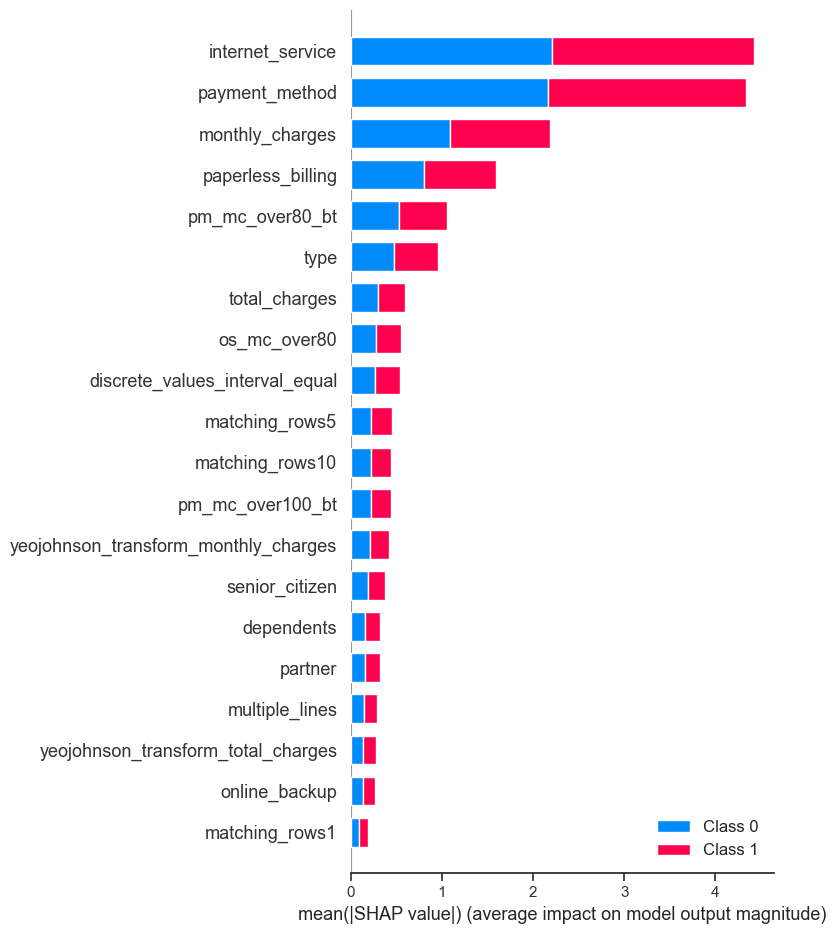

In [118]:
df_test_transformed = pd.DataFrame(df_test_transformed, columns = df_test_transformed_columns)
explainer = shap.TreeExplainer( clf_lgbm1.best_estimator_[1])
shap_values = explainer.shap_values(df_test_transformed)
shap.summary_plot(shap_values, df_test_transformed, plot_type='bar')

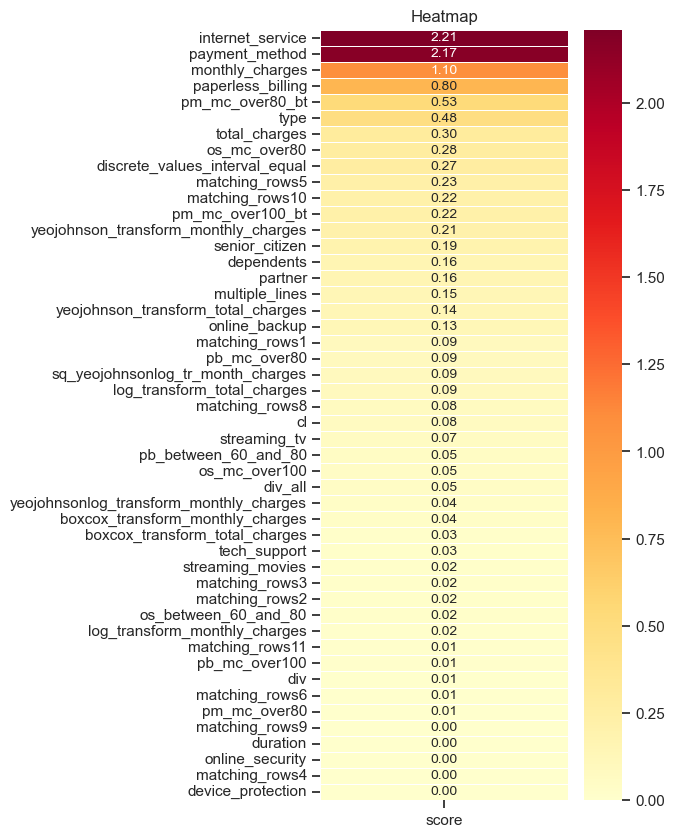

In [119]:
sv = np.abs(shap_values).mean(axis=0).mean(axis=0)  
series = pd.Series(sv, index=df_test_transformed_columns)  
df_heatmap = pd.DataFrame(series.sort_values(ascending=0), columns=['score'])  
  
# Создание тепловой карты  
plt.figure(figsize=(4,10))
sns.heatmap(df_heatmap, cmap='YlOrRd', annot=True, fmt=".2f", cbar=True,  
            linewidths=0.5, annot_kws={"size": 10})  
plt.title('Heatmap')  
plt.show() 

### Лучшая модель 

In [120]:
'''best_model = {'LogReg': [best_score_lr, best_params_lr], 
 'RandomForest' : [best_score_rf, best_params_rf], 
 'LGBM' : [best_score_lgbm, best_params_lgbm]}
best_model = pd.DataFrame(best_model, index = ['score','params'])'''

"best_model = {'LogReg': [best_score_lr, best_params_lr], \n 'RandomForest' : [best_score_rf, best_params_rf], \n 'LGBM' : [best_score_lgbm, best_params_lgbm]}\nbest_model = pd.DataFrame(best_model, index = ['score','params'])"

In [121]:
#best_model

In [122]:
'''models = best_model.columns.tolist()  
scores = best_model.loc['score'].tolist()  
  
plt.figure(figsize=(10, 5))  
plt.bar(models, scores)  
plt.title("Сравнение скоров")  
plt.xlabel("Модели")  
plt.ylabel("Скор")  
plt.ylim([0.5, 1])  
plt.show()  '''

'models = best_model.columns.tolist()  \nscores = best_model.loc[\'score\'].tolist()  \n  \nplt.figure(figsize=(10, 5))  \nplt.bar(models, scores)  \nplt.title("Сравнение скоров")  \nplt.xlabel("Модели")  \nplt.ylabel("Скор")  \nplt.ylim([0.5, 1])  \nplt.show()  '

<link rel="preconnect" href="https://fonts.googleapis.com">
<link rel="preconnect" href="https://fonts.gstatic.com" crossorigin>
<link href="https://fonts.googleapis.com/css2?family=Open+Sans:wght@300&display=swap" rel="stylesheet">
<div style="background-color: #cce5ff; padding: 20px; border: 1px solid #cccccc; border-radius: 10px; box-shadow: 2px 2px 5px #999999;">
    <img src="https://4.downloader.disk.yandex.ru/preview/e94d77672c67e773ce389ba975ff6f93dfa85e6bf38330994ddb167e45d43b2e/inf/FVaRiax1bkEIrSJD3W5o0vltYGLJsoGOy3uYGIvEWK3S0BJTW8uUuR5gEFPx-2OkS79cs8UznKovmnI6Pdz2hw%3D%3D?uid=839951300&filename=icons8-редактировать-20.png&disposition=inline&hash=&limit=0&content_type=image%2Fpng&owner_uid=839951300&tknv=v2&size=1344x964" style="float: left; margin-right: 8px; margin-top: 0;">
    <span style="font-family: 'Open Sans', sans-serif; font-size: 17px;">
        <strong>Заметка</strong>
    </span>
    <br>
    <span style="font-family: 'Open Sans', sans-serif; font-size: 14px;">
        <p>
            LGBM показал лучшее значение roc_auc(0.908). Модель с лучшими гиперпараметрами будет выбрана для теста.
        </p>
    </span>
</div>


### Тест

In [123]:
d

NameError: name 'd' is not defined

In [183]:
df_test1['is_stopped'] = np.where(df_test1['end_date'].isna(), 0,1 )

In [184]:
target = df_test1['is_stopped']


In [185]:
df_test1.loc[df_test1['total_charges'] == 0, 'total_charges'] += 0.0001
df_test_c = create_features(df_test1)

In [186]:
df_test_c = df_test_c.drop(['div12', 'gender', 'matching_rows7','customer_id','begin_date', 'end_date'], axis=1)

In [187]:
df_test_c_features = df_test_c.drop(['is_stopped'], axis=1)

In [188]:
X = df_test_c.loc[:, ['boxcox_transform_monthly_charges','boxcox_transform_total_charges']]

In [189]:
X['cl'] = -1

In [190]:

mask1 = (X['boxcox_transform_monthly_charges'] < limit1) & (X['boxcox_transform_total_charges'] > 0)  
X.loc[mask1, 'cl'] = 0 

mask2 = X['boxcox_transform_total_charges'] < 0  
X.loc[mask2, 'cl'] = 2  

center = np.array([cen_x, cen_y])
radius = 8.5                   

mask3 = np.linalg.norm(X[['boxcox_transform_monthly_charges', 'boxcox_transform_total_charges']] - center, axis=1) <= radius  
X.loc[mask3, 'cl'] = 1 

X['cl'].value_counts()

-1    999
 0    400
 1    359
 2      3
Name: cl, dtype: int64

<AxesSubplot:xlabel='boxcox_transform_monthly_charges', ylabel='boxcox_transform_total_charges'>

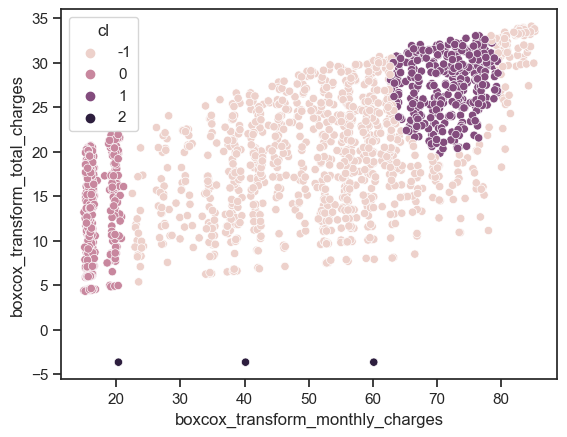

In [191]:
sns.scatterplot(data=X, x='boxcox_transform_monthly_charges',y='boxcox_transform_total_charges', hue='cl')

In [192]:
df_test_c_features['cl'] = X['cl']

In [193]:
df_test_c_features

,type,paperless_billing,payment_method,monthly_charges,total_charges,senior_citizen,partner,dependents,internet_service,online_security,...,matching_rows10,matching_rows11,duration,log_transform_monthly_charges,log_transform_total_charges,boxcox_transform_monthly_charges,boxcox_transform_total_charges,div,div_all,cl
306,Month-to-month,1,Electronic check,74.90,2546.60,1,1,0,Fiber optic,0.0,...,1,1,1036,4.316154,7.842514,55.995603,23.920341,34.000000,0.984556,-1
1294,Month-to-month,0,Electronic check,44.75,410.81,0,0,0,DSL,0.0,...,1,1,276,3.801091,6.018131,34.506035,13.800682,9.180112,0.997838,-1
5215,Month-to-month,0,Bank transfer (automatic),20.15,253.89,0,1,0,NaN,NaN,...,0,0,365,3.003204,5.536901,16.035288,11.806084,12.600000,1.035616,0
5804,Two year,0,Credit card (automatic),23.90,1696.90,0,1,1,NaN,NaN,...,0,1,2163,3.173878,7.436558,18.936748,21.260594,71.000000,0.984743,0
6400,Two year,0,Bank transfer (automatic),59.75,2091.25,0,0,0,DSL,1.0,...,1,1,1065,4.090169,7.645517,45.311042,22.596470,35.000000,0.985915,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3370,Month-to-month,1,Bank transfer (automatic),48.70,1704.50,0,1,1,DSL,1.0,...,1,1,1065,3.885679,7.441027,37.377055,21.288450,35.000000,0.985915,-1
4850,One year,1,Credit card (automatic),100.05,5402.70,0,0,0,Fiber optic,1.0,...,1,1,1645,4.605670,8.594654,73.353494,29.608374,54.000000,0.984802,1
96,One year,1,Credit card (automatic),66.85,5078.59,0,1,1,DSL,1.0,...,1,1,2163,4.202451,8.532789,50.343293,29.099784,75.969933,1.053675,-1
232,Month-to-month,1,Mailed check,84.60,338.40,0,0,0,Fiber optic,1.0,...,1,1,123,4.437934,5.824229,62.740140,12.968493,4.000000,0.975610,-1


In [194]:
df_test_c_features['yeojohnson_transform_monthly_charges'] = yeojohnson(df_test_c_features['monthly_charges'],lmbda_yeojohnson1)
df_test_c_features['yeojohnson_transform_total_charges']= yeojohnson(df_test_c_features['total_charges'],lmbda_yeojohnson2) 

In [195]:
df_test_c_features['yeojohnsonlog_transform_monthly_charges'] = yeojohnson(df_test_c_features['log_transform_monthly_charges'], 
                                                                           lmbda_yeojohnson3) 


In [196]:
df_test_c_features['sq_yeojohnsonlog_tr_month_charges'] = np.sqrt(df_test_c_features['yeojohnsonlog_transform_monthly_charges'])

In [197]:
train_t = disc.transform(df_test_c_features[['monthly_charges','total_charges']])
df_test_c_features['discrete_values_interval_equal'] = train_t['monthly_charges']

In [198]:
df_test_c_features['os_mc_over80'] = 0
df_test_c_features['os_mc_over100'] = 0
df_test_c_features['os_between_60_and_80'] =  0

df_test_c_features['pb_mc_over80'] = 0
df_test_c_features['pb_mc_over100'] = 0
df_test_c_features['pb_between_60_and_80'] = 0

df_test_c_features['pm_mc_over80_bt'] = 0
df_test_c_features['pm_mc_over100_bt'] = 0

df_test_c_features['pm_mc_over80'] = 0


In [199]:
df_test_c_features.loc[(df['online_security'] == 1) & (df_test_c_features['monthly_charges'] > 80), 'os_mc_over80'] = 1
df_test_c_features.loc[(df['online_security'] == 1) & (df_test_c_features['monthly_charges'] >= 100), 'os_mc_over100'] = 1
df_test_c_features.loc[(df['online_security'] == 1) & (df_test_c_features['monthly_charges'] > 60) & (df_test_c_features['monthly_charges'] <= 80), 'os_between_60_and_80'] = 1


df_test_c_features.loc[(df_test_c_features['paperless_billing'] == 1) & (df_test_c_features['monthly_charges'] > 80), 'pb_mc_over80'] = 1
df_test_c_features.loc[(df_test_c_features['paperless_billing'] == 1) & (df_test_c_features['monthly_charges'] >= 100), 'pb_mc_over100'] = 1
df_test_c_features.loc[(df_test_c_features['paperless_billing'] == 1) & (df_test_c_features['monthly_charges'] > 60) & (df_test_c_features['monthly_charges'] <= 80), 'pb_between_60_and_80']=1

df_test_c_features.loc[(df_test_c_features['payment_method'] == 'Bank transfer (automatic)') & (df_test_c_features['monthly_charges'] > 80), 'pm_mc_over80_bt'] = 1
df_test_c_features.loc[(df_test_c_features['payment_method'] == 'Bank transfer (automatic)') & (df_test_c_features['monthly_charges'] >= 100), 'pm_mc_over100_bt'] = 1

df_test_c_features.loc[(df_test_c_features['payment_method'] == 'Credit card (automatic)') & (df_test_c_features['monthly_charges'] > 80), 'pm_mc_over80'] = 1



In [200]:
df_test_c_features.loc[df_test_c_features['online_security'].isna(), 'os_mc_over80'] = np.nan
df_test_c_features.loc[df_test_c_features['online_security'].isna(), 'os_mc_over100'] = np.nan
df_test_c_features.loc[df_test_c_features['online_security'].isna(), 'os_between_60_and_80'] = np.nan

In [201]:
pr = clf_lgbm1.predict_proba(df_test_c_features)  

In [202]:
clf_lgbm1.score(df_test_c_features, target)

0.9134275618374559

In [203]:
df_test_c_features.shape

(1761, 48)

In [204]:
df_test_transformed_columns = df_test_c_features.columns
df_test_transformed = clf_lgbm1.best_estimator_[0].transform(df_test_c_features)
target_test = target

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


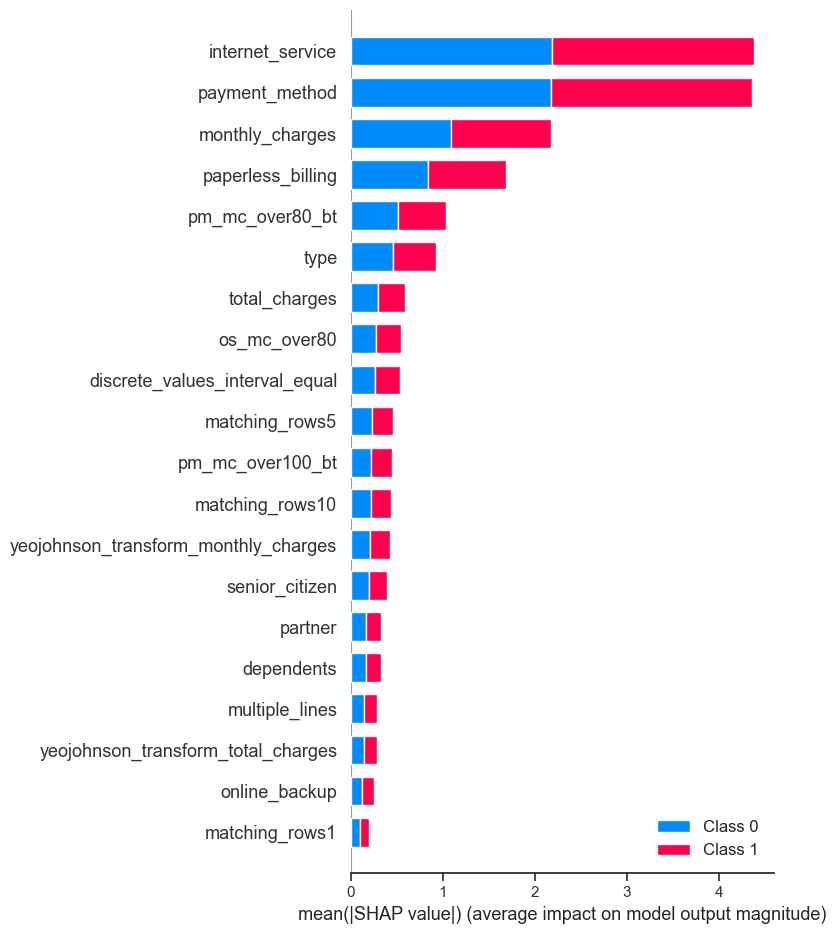

In [205]:
df_test_transformed = pd.DataFrame(df_test_transformed, columns = df_test_transformed_columns)
explainer = shap.TreeExplainer( clf_lgbm1.best_estimator_[1])
shap_values = explainer.shap_values(df_test_transformed)
shap.summary_plot(shap_values, df_test_transformed, plot_type='bar')

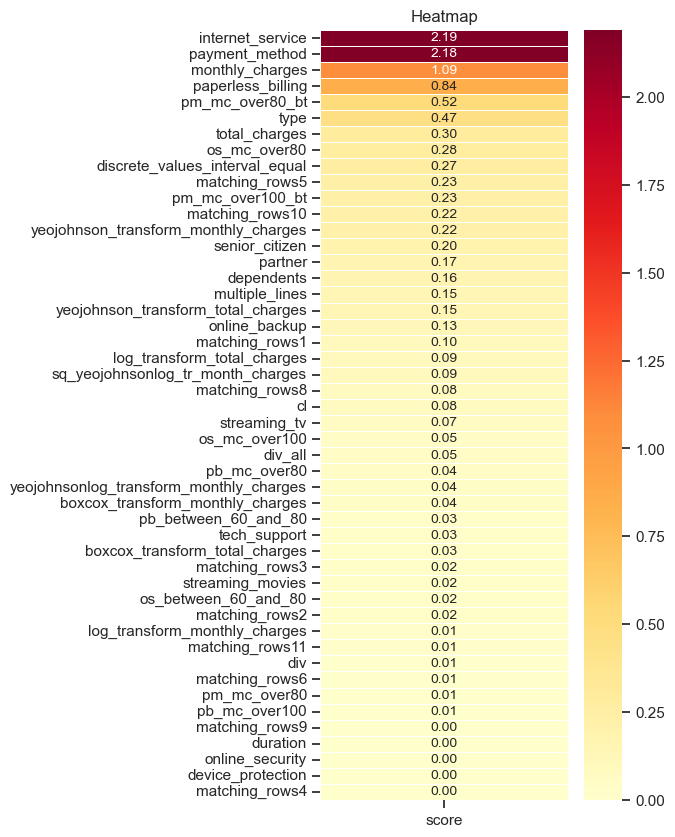

In [209]:
sv = np.abs(shap_values).mean(axis=0).mean(axis=0)  
series = pd.Series(sv, index=df_test_transformed_columns)  
df_heatmap = pd.DataFrame(series.sort_values(ascending=0), columns=['score'])  
  
# Создание тепловой карты  
plt.figure(figsize=(4,10))
sns.heatmap(df_heatmap, cmap='YlOrRd', annot=True, fmt=".2f", cbar=True,  
            linewidths=0.5, annot_kws={"size": 10})  
plt.title('Heatmap')  
plt.show() 

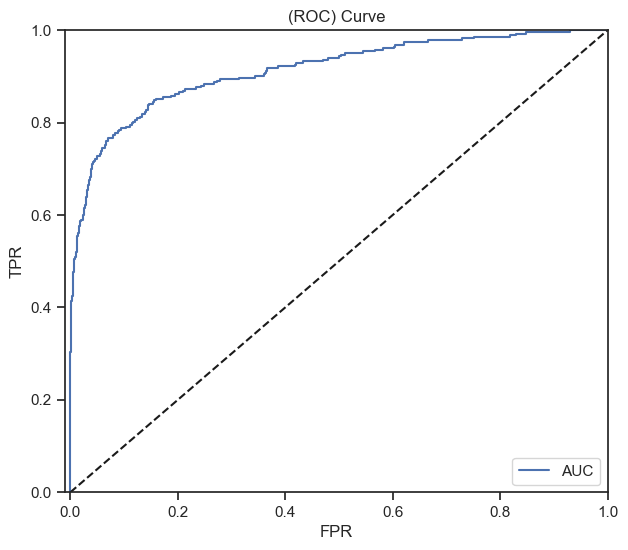

In [206]:
fpr, tpr, th = roc_curve(target, pr[:,1])  
  
# Построение ROC-кривой  
plt.figure(figsize=(7, 6))  
plt.plot(fpr, tpr, label=f'AUC')  
plt.plot([0, 1], [0, 1], 'k--')  
plt.xlim([-0.01, 1])  
plt.ylim([0, 1])  
plt.xlabel('FPR')  
plt.ylabel('TPR')  
plt.title('(ROC) Curve')  
plt.legend(loc='lower right')  
plt.show()  

In [212]:
df['internet_service']

6212            DSL
5401            NaN
313     Fiber optic
2638    Fiber optic
1870            DSL
           ...     
1969            DSL
3047    Fiber optic
6937            DSL
1971            NaN
2006            DSL
Name: internet_service, Length: 5282, dtype: object

In [207]:
confusion_matrix(target, clf_lgbm1.predict(df_test_c_features), normalize='true')

array([[0.98037889, 0.01962111],
       [0.41342756, 0.58657244]])

In [208]:
accuracy_score(target, clf_lgbm1.predict(df_test_c_features))

0.9170925610448609

<link rel="preconnect" href="https://fonts.googleapis.com">
<link rel="preconnect" href="https://fonts.gstatic.com" crossorigin>
<link href="https://fonts.googleapis.com/css2?family=Open+Sans:wght@300&display=swap" rel="stylesheet">
<div style="background-color: #cce5ff; padding: 20px; border: 1px solid #cccccc; border-radius: 10px; box-shadow: 2px 2px 5px #999999;">
    <img src="https://4.downloader.disk.yandex.ru/preview/e94d77672c67e773ce389ba975ff6f93dfa85e6bf38330994ddb167e45d43b2e/inf/FVaRiax1bkEIrSJD3W5o0vltYGLJsoGOy3uYGIvEWK3S0BJTW8uUuR5gEFPx-2OkS79cs8UznKovmnI6Pdz2hw%3D%3D?uid=839951300&filename=icons8-редактировать-20.png&disposition=inline&hash=&limit=0&content_type=image%2Fpng&owner_uid=839951300&tknv=v2&size=1344x964" style="float: left; margin-right: 8px; margin-top: 0;">
    <span style="font-family: 'Open Sans', sans-serif; font-size: 17px;">
        <strong>Заметка</strong>
    </span>
    <br>
    <span style="font-family: 'Open Sans', sans-serif; font-size: 14px;">
        <p>
            LGBM на тестовых данных показал значение roc_auc (0.906). <br>
            97,7% - модель правильно предсказала, что клиент не уйдет.<br>
            2,3% - модель неправильно предсказала, что клиент уйдет, хотя он на самом деле остается.<br>
            45,2% - модель неправильно предсказала, что клиент остается, хотя он на самом деле уходит.<br>
            54,8% - модель правильно предсказала, что клиент уйдет.<br>
            accuracy модели - 0.908 (модель верно классифицирует около 90.8% клиентов )
        </p>
    </span>
</div>


### Важность признаков

In [ ]:
model = clf_lgbm1.best_estimator_.named_steps['lgbmclassifier']  
importances = pd.Series(model.feature_importances_, index=df_test_c_features.columns) 

In [ ]:
importances.plot(kind='bar', figsize=(12,4),title='Важность признаков')

<div style="border:solid Chocolate 2px; padding: 40px">

<h2>✔️ Заключение тимлида: <a class="tocSkip"> </h2> 
    
<b>Егор</b>,  хорошо, проект принят. По метрике отличный результат, порог пройден, поздравляю! Можно приступать к отчету.

## **Отчет: Прогнозирование оттока клиентов телеком-компании**


Подготовка данных:
- Изменены типы столбцов на подходящие.
- Заменены значения 'No' в столбце end_date на NaT.
- выведена вся основная информация о датафреймах до склейки


Исследовательский анализ данных:  
- Сделано объединение датафреймов и выделение тестовой выборки.
- Обнаружены пропущенные значения после объединения данных и принято решение оставить их .
- Выполнена визуализация распределения категориальных признаков.
- Построена визуализация распределения сгруппированных данных по таргету и анализ факторов, влияющих на уход клиентов.
- Построен pairplot для анализа взаимосвязи между ежемесячными и общими тратами.   
- Добавлены дополнительные признаки, такие как группировки услуг и типов подписок.
 - Группа 1 "активных" пользователей, которые одновременно пользуются онлайн-безопасностью, резервным копированием, защитой устройств и технической поддержкой, имеет  дисбаланс и высокий процент ухода (более 20%). Они обладают неким трендом к нахождению на границах диаграммы рассеяния
 - Группа 2 пользователей, которые одновременно пользуются стриминговыми сервисами, также имеет сильный дисбаланс и высокий процент ухода (более 20%). Возможно, эти пользователи ищут лучшие условия либо не устраивает цена.
 - Группа 3 пользователей, которые одновременно пользуются стриминговыми сервисами и 'несколькими' линиями, имеет высокий процент ухода, близкий к 30%. Они также платят больше ежемесячно и имеют примерно равномерное распределение по общим затратам в пределах 95-105 .
 - Группа 4 группа клиентов с длительной подпиской (год/два), не являющихся пенсионерами и с наличием партнера. Эта группа похожа на тех, кто в нее не попал. 
 - Группа клиентов с годовыми/двухгодовыми подписками, являющимися пенсионерами и с наличием партнера, также имеет высокий процент  ухода (около 30%).
 - Создан признак duration, отражающий время пользования услугами.
 - Применены логарифмическое и бокс-кокс преобразование некоторых числовых признаков.
 - До 2017 года был небольшой спад подключения услуг, после чего начался рост. Количество пользователей, прекративших пользоваться услугами, плавно росло, но это логично, так как все больше людей подключалось. Аномальных уходов не выявлено.
  
Был получен примерный портрет уходящего клиента: 

**Уходящий клиент:**  

- Не пользуется набором услуг, такими как онлайн-безопасность, резервное копирование, защита устройств и техническая поддержка.
- Использует стриминговые сервисы.
- Возможно, также пользуется множественными линиями.
- Большие ежемесячные траты .
- У клиента длительная подписка на услуги (год/два).
- Не является пенсионером.
- Есть партнер.  
Также уходящий клиент может быть в группе с длительной подпиской (год/два), является пенсионером и имеет партнера.

**Создание модели прогнозирования оттока:**  
Логистическая регрессия:
- На валидации модель логистической регрессии достигла точности 0.8187.

Случайный лес:
- На валидации модель случайного леса достигла лучшего результата с точностью 0.8574.

LGBM:
- Модель LGBM показала наивысший показатель roc_auc (0.908) на валидации. Было решено выбрать модель LGBM с наилучшими гиперпараметрами для дальнейших тестов.
  
  
Далее, модель LGBM была протестирована на тестовых данных, где она показала значение roc_auc равное 0.907.  
  
Результаты тестирования модели LGBM:  
  
97.7% - модель правильно предсказала, что клиент не уйдет.   
2.3% - модель неправильно предсказала, что клиент уйдет, хотя он на самом деле остается.  
45.2% - модель неправильно предсказала, что клиент остается, хотя он на самом деле уходит.  
54.8% - модель правильно предсказала, что клиент уйдет.  
Точность модели(accuracy) составила 0.908, т.е. модель верно классифицирует около 90.8% клиентов.  
  
модель ошибается в том что клиент остается, хотя он на самом деле уходит, но в целом показывает хороший результат.   



**Одной из трудностей, с которой столкнулися**  - выделение значимых признаков для модели прогнозирования оттока.  
  
Для решения этой задачи был проделан анализ данных, анализ корреляции, визуализация данных.  
  
Удалил признаки с высокой корреляцией и низкой значимостью для модели, чтобы улучшить ее производительность и устранить возможность мультиколлинеарности.  
  
В процессе предобработки данных выполнил:  
  
- Удаление дубликатов: проверили наличие повторяющихся записей.  
  
- Заполнение пропущенных значений: для пропущенных значений в total_charges было выбрано близкое к нулю значение.

- Преобразование категориальных признаков: преобразовали категориальные признаки, такие как пол и семейное положение, в числовые с помощью метода кодирования One-Hot Encoding для линейной модели и для части категориальных для сслучайного леса, для бустинга использовался только OrdinaEncoder кодировщик.

- Масштабирование признаков: стандартизировали числовые признаки, чтобы они имели среднее значение равное 0 и стандартное отклонение равное 1.

- Удаление лишних признаков: на основе анализа корреляции и значимости признаков мы удалили признаки с высокой корреляцией и низкой значимостью для модели.  
  
**Значения гиперпараметров** модели LGBM :  
  
- bagging_fraction: 0.9 означает, что для каждого дерева будет использоваться 90% объектов и признаков.

- feature_fraction: 0.95 означает, что каждое дерево будет обучаться на 95% доступных признаков.

- learning_rate:  0.161 

- ax_depth: 9 ограничивает число уровней дерева.

- min_data_in_leaf: 20 определяет, что в каждом листе должно быть не менее 20 объектов.

- min_sum_hessian_in_leaf: 1e-06 определяет это мин сумму hessian, которая должна быть в листе дерева.

- n_estimators: 240 у- модель будет содержать 240 деревьев.

- n_jobs: -1 - модель будет использовать все доступные ядра процессора.

- num_leaves: 18 - определяет, что каждое дерево будет иметь 18 листьев.

- random_state: случайное значение равное  300623,  для воспроизводимости результатов.
  
Указанные значения гиперпараметров были выбраны после оптимизации и подбора гиперпараметров в соответствии с задачей прогнозирования оттока и максимизации показателя roc_auc.   
**Использованные признаки:**
'type', 'paperless_billing', 'payment_method', 'monthly_charges',
       'total_charges', 'senior_citizen', 'partner', 'dependents',
       'internet_service', 'online_security', 'online_backup',
       'device_protection', 'tech_support', 'streaming_tv', 'streaming_movies',
       'multiple_lines', 'is_stopped', 'matching_rows1', 'matching_rows2',
       'matching_rows3', 'matching_rows4', 'matching_rows5', 'matching_rows6',
       'matching_rows8', 'matching_rows9', 'matching_rows10',
       'matching_rows11', 'duration', 'log_transform_monthly_charges',
       'log_transform_total_charges', 'boxcox_transform_monthly_charges',
       'boxcox_transform_total_charges', 'div', 'div_all'